## **IFI 8420 Final Project: IBM Telecom Customer Churn Prediction**

### ⏩ **Shreyashi Mukhopadhyay**

### ⏩ **Panther ID: 002592906**

In [183]:
## Import drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [184]:
import os
os.chdir('/content/drive/MyDrive/IFI 8420 Classification Project')

## Import libraries

In [185]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [186]:

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score


In [187]:
!pip install shap

In [188]:
import shap
shap.initjs()

## Read the data

In [325]:
df = pd.read_excel("Telco_customer_churn.xlsx")
df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


### Rename the columns by removing the spaces between the words

In [190]:
df.columns = df.columns.str.replace(' ','_')
df.head()

,CustomerID,Count,Country,State,City,Zip_Code,Lat_Long,Latitude,Longitude,Gender,...,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Label,Churn_Value,Churn_Score,CLTV,Churn_Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


## Dimensionality Check

In [191]:
# Print out the shape of the data with print statements for rows and columns

print("Number of rows:", df.shape[0])
print("Number of columns:", df.shape[1])

Number of rows: 7043
Number of columns: 33


In [192]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip_Code           7043 non-null   int64  
 6   Lat_Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior_Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure_Months      7043 non-null   int64  
 14  Phone_Service      7043 non-null   object 
 15  Multiple_Lines     7043 non-null   object 
 16  Internet_Service   7043 

In [193]:
# Get the number of columns of each data type

print(df.dtypes.value_counts())

object     24
int64       6
float64     3
Name: count, dtype: int64


## Change the datatype of Total_Charges & make it numeric:

In [194]:
df['Total_Charges'] = pd.to_numeric(df['Total_Charges'], errors='coerce')

In [195]:
# Make a dataframe of the null value counts and apply gradient color to the dataframe

import seaborn as sns

# Create a dataframe of the null value counts
null_counts = df.isnull().sum().to_frame(name='Null Count').sort_values(by='Null Count', ascending=False)

# Apply gradient color to the dataframe
null_counts.style.background_gradient(cmap='coolwarm')

,Null Count
Churn_Reason,5174
Total_Charges,11
Online_Security,0
CLTV,0
Churn_Score,0
Churn_Value,0
Churn_Label,0
Monthly_Charges,0
Payment_Method,0
Paperless_Billing,0


### ✅ The Churn Reason has many missing values because these customers have not churned. We have more that 5000 customers who are satisfied with their services , so we will not be removing these records.


In [196]:
df.isnull().sum()

CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip_Code                0
Lat_Long                0
Latitude                0
Longitude               0
Gender                  0
Senior_Citizen          0
Partner                 0
Dependents              0
Tenure_Months           0
Phone_Service           0
Multiple_Lines          0
Internet_Service        0
Online_Security         0
Online_Backup           0
Device_Protection       0
Tech_Support            0
Streaming_TV            0
Streaming_Movies        0
Contract                0
Paperless_Billing       0
Payment_Method          0
Monthly_Charges         0
Total_Charges          11
Churn_Label             0
Churn_Value             0
Churn_Score             0
CLTV                    0
Churn_Reason         5174
dtype: int64

## Drop Null Values for Total Charges Column



✅    We see that all clients for which there is no 'Total Charges' value are not in the churn, and also almost all of them have the same contract type - 'Two years', and one customer has 'One Year' contract.





In [197]:
df[df['Total_Charges'].isna()]

,CustomerID,Count,Country,State,City,Zip_Code,Lat_Long,Latitude,Longitude,Gender,...,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Label,Churn_Value,Churn_Score,CLTV,Churn_Reason
2234,4472-LVYGI,1,United States,California,San Bernardino,92408,"34.084909, -117.258107",34.084909,-117.258107,Female,...,Two year,Yes,Bank transfer (automatic),52.55,NaN,No,0,36,2578,NaN
2438,3115-CZMZD,1,United States,California,Independence,93526,"36.869584, -118.189241",36.869584,-118.189241,Male,...,Two year,No,Mailed check,20.25,NaN,No,0,68,5504,NaN
2568,5709-LVOEQ,1,United States,California,San Mateo,94401,"37.590421, -122.306467",37.590421,-122.306467,Female,...,Two year,No,Mailed check,80.85,NaN,No,0,45,2048,NaN
2667,4367-NUYAO,1,United States,California,Cupertino,95014,"37.306612, -122.080621",37.306612,-122.080621,Male,...,Two year,No,Mailed check,25.75,NaN,No,0,48,4950,NaN
2856,1371-DWPAZ,1,United States,California,Redcrest,95569,"40.363446, -123.835041",40.363446,-123.835041,Female,...,Two year,No,Credit card (automatic),56.05,NaN,No,0,30,4740,NaN
4331,7644-OMVMY,1,United States,California,Los Angeles,90029,"34.089953, -118.294824",34.089953,-118.294824,Male,...,Two year,No,Mailed check,19.85,NaN,No,0,53,2019,NaN
4687,3213-VVOLG,1,United States,California,Sun City,92585,"33.739412, -117.173334",33.739412,-117.173334,Male,...,Two year,No,Mailed check,25.35,NaN,No,0,49,2299,NaN
5104,2520-SGTTA,1,United States,California,Ben Lomond,95005,"37.078873, -122.090386",37.078873,-122.090386,Female,...,Two year,No,Mailed check,20.00,NaN,No,0,27,3763,NaN
5719,2923-ARZLG,1,United States,California,La Verne,91750,"34.144703, -117.770299",34.144703,-117.770299,Male,...,One year,Yes,Mailed check,19.70,NaN,No,0,69,4890,NaN
6772,4075-WKNIU,1,United States,California,Bell,90201,"33.970343, -118.171368",33.970343,-118.171368,Female,...,Two year,No,Mailed check,73.35,NaN,No,0,44,2342,NaN


In [198]:
# Drop the rows where total charges are NAN

data = df[~df['Total_Charges'].isna()]

data.head()

,CustomerID,Count,Country,State,City,Zip_Code,Lat_Long,Latitude,Longitude,Gender,...,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Label,Churn_Value,Churn_Score,CLTV,Churn_Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.50,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.30,Yes,1,89,5340,Competitor had better devices


In [199]:
# Describe only numeric columns exclude zipcode, latitude and longitude

data.describe().drop(["Count", "Zip_Code", "Latitude", "Longitude"], axis=1)

,Tenure_Months,Monthly_Charges,Total_Charges,Churn_Value,Churn_Score,CLTV
count,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441,0.265785,58.715301,4401.445108
std,24.545260,30.085974,2266.771362,0.441782,21.531321,1182.414266
min,1.000000,18.250000,18.800000,0.000000,5.000000,2003.000000
25%,9.000000,35.587500,401.450000,0.000000,40.000000,3469.750000
50%,29.000000,70.350000,1397.475000,0.000000,61.000000,4527.500000
75%,55.000000,89.862500,3794.737500,1.000000,75.000000,5381.000000
max,72.000000,118.750000,8684.800000,1.000000,100.000000,6500.000000


In [200]:
data.duplicated().sum()

0

In [201]:
data.isna().sum()

CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip_Code                0
Lat_Long                0
Latitude                0
Longitude               0
Gender                  0
Senior_Citizen          0
Partner                 0
Dependents              0
Tenure_Months           0
Phone_Service           0
Multiple_Lines          0
Internet_Service        0
Online_Security         0
Online_Backup           0
Device_Protection       0
Tech_Support            0
Streaming_TV            0
Streaming_Movies        0
Contract                0
Paperless_Billing       0
Payment_Method          0
Monthly_Charges         0
Total_Charges           0
Churn_Label             0
Churn_Value             0
Churn_Score             0
CLTV                    0
Churn_Reason         5163
dtype: int64

## Target variable Distribution

In [202]:
df1 =data.copy()
df1.shape

(7032, 33)

In [203]:
df1.columns

Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip_Code',
       'Lat_Long', 'Latitude', 'Longitude', 'Gender', 'Senior_Citizen',
       'Partner', 'Dependents', 'Tenure_Months', 'Phone_Service',
       'Multiple_Lines', 'Internet_Service', 'Online_Security',
       'Online_Backup', 'Device_Protection', 'Tech_Support', 'Streaming_TV',
       'Streaming_Movies', 'Contract', 'Paperless_Billing', 'Payment_Method',
       'Monthly_Charges', 'Total_Charges', 'Churn_Label', 'Churn_Value',
       'Churn_Score', 'CLTV', 'Churn_Reason'],
      dtype='object')

In [204]:
df1["Churn_Value"].value_counts()

Churn_Value
0    5163
1    1869
Name: count, dtype: int64

In [205]:
import warnings
warnings.filterwarnings("ignore")

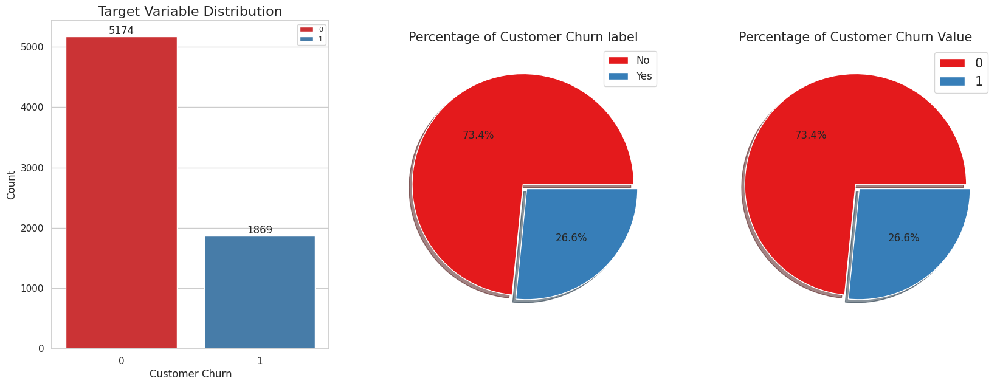

In [206]:
# Target Variable Distribution

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid')

fig, ax = plt.subplots(1, 3, figsize=(20, 7))

# Countplot
sns.countplot(x = 'Churn_Value', data = df, ax=ax[0], palette='Set1')
ax[0].set_title('Target Variable Distribution', fontsize=16)
ax[0].set_xlabel('Customer Churn')
ax[0].set_ylabel('Count')
ax[0].legend(df['Churn_Value'].value_counts().index, loc='best', fontsize=8)
ax[0].bar_label(ax[0].containers[0])
ax[0].bar_label(ax[0].containers[1])

# Pie Chart


ax[1].pie(df1['Churn_Label'].value_counts(), autopct='%1.1f%%', colors=sns.color_palette('Set1'), explode=[0, 0.05], shadow=True)
ax[1].legend(df1['Churn_Label'].value_counts().index, loc='best', fontsize=12)
ax[1].set_title('Percentage of Customer Churn label', fontsize=15)

ax[2].pie(df1['Churn_Value'].value_counts(), autopct='%1.1f%%', colors=sns.color_palette('Set1'), explode=[0, 0.05], shadow=True)
ax[2].legend(df1['Churn_Value'].value_counts().index, loc='best', fontsize=15)
ax[2].set_title('Percentage of Customer Churn Value' , fontsize=15)


plt.show()

## EDA

In [207]:
df1.columns

Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip_Code',
       'Lat_Long', 'Latitude', 'Longitude', 'Gender', 'Senior_Citizen',
       'Partner', 'Dependents', 'Tenure_Months', 'Phone_Service',
       'Multiple_Lines', 'Internet_Service', 'Online_Security',
       'Online_Backup', 'Device_Protection', 'Tech_Support', 'Streaming_TV',
       'Streaming_Movies', 'Contract', 'Paperless_Billing', 'Payment_Method',
       'Monthly_Charges', 'Total_Charges', 'Churn_Label', 'Churn_Value',
       'Churn_Score', 'CLTV', 'Churn_Reason'],
      dtype='object')

## Histograms for Continuous Variables

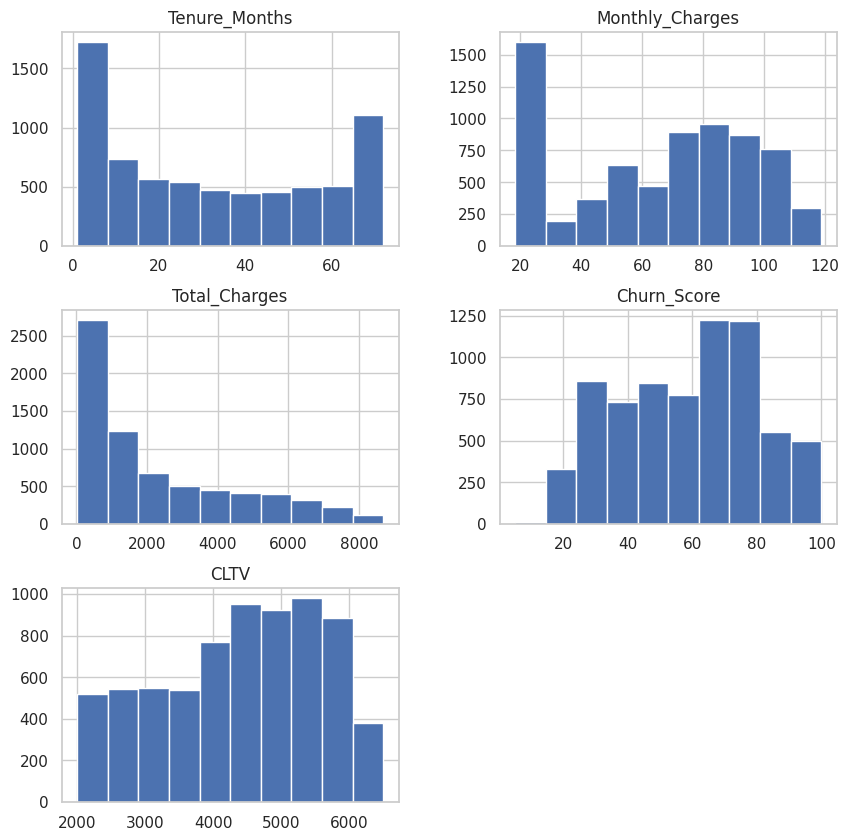

In [208]:
continuous_columns = ["Tenure_Months", 'Monthly_Charges', 'Total_Charges', 'Churn_Score', 'CLTV']

df1 = data.copy()
df1[continuous_columns].hist(figsize=(10,10))
plt.show()

## KDE Plots for continuous variables

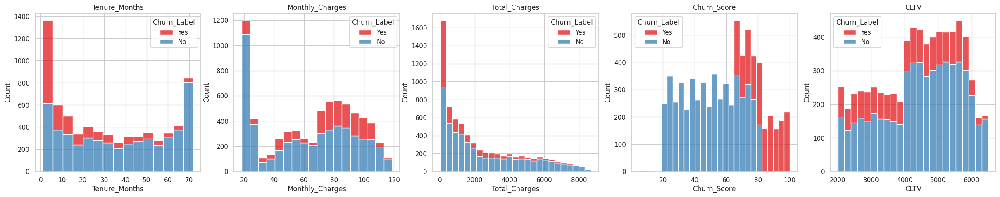

In [209]:
# Continuous variables Plot

sns.set(style='whitegrid')

fig, axes = plt.subplots(1, len(continuous_columns), figsize=(30, 5))

for i, col in enumerate(continuous_columns):
    sns.histplot(data=df1, x=col, hue="Churn_Label", multiple="stack", palette="Set1", ax=axes[i])
    #sns.histplot(data=df1, x=col, hue="Churn_Label", palette="Set1", ax=axes[i])

    axes[i].set_title(col)

plt.show()

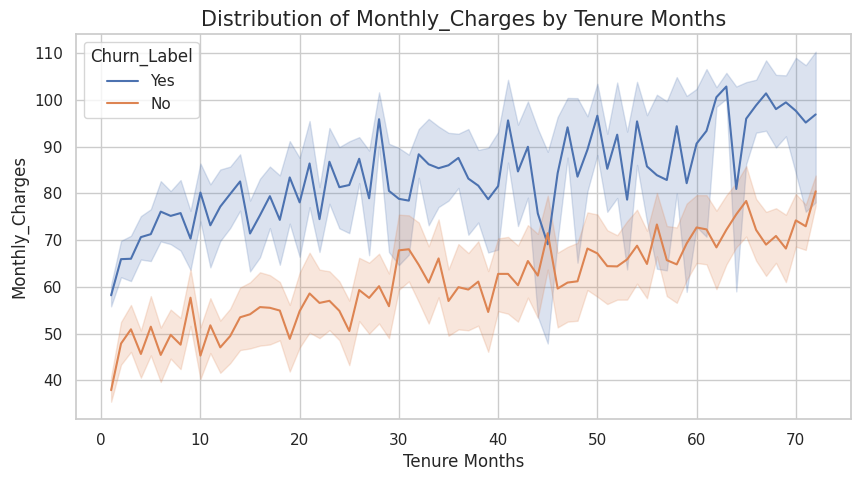

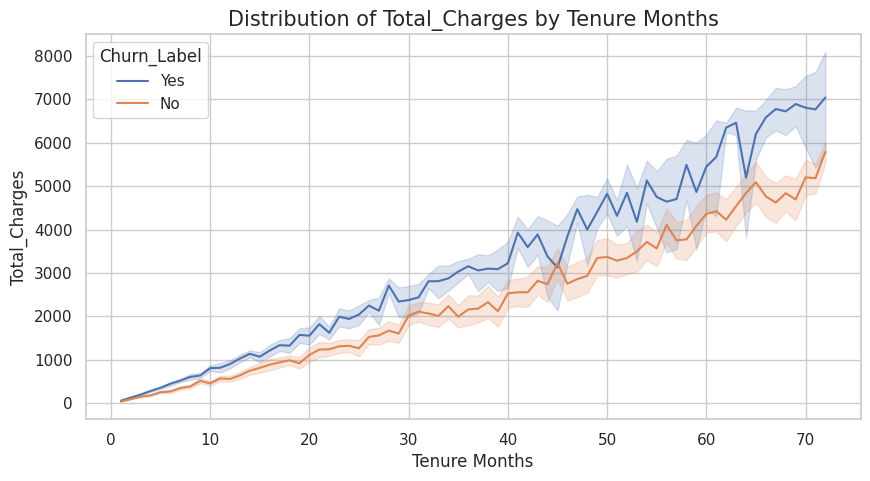

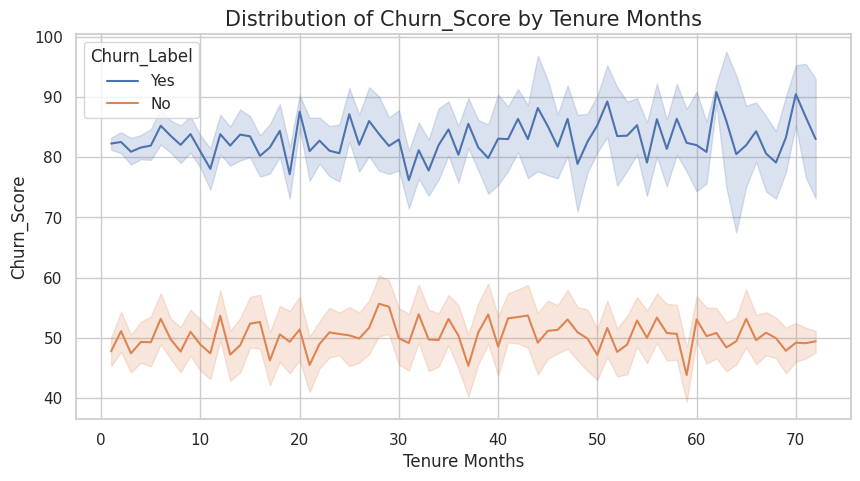

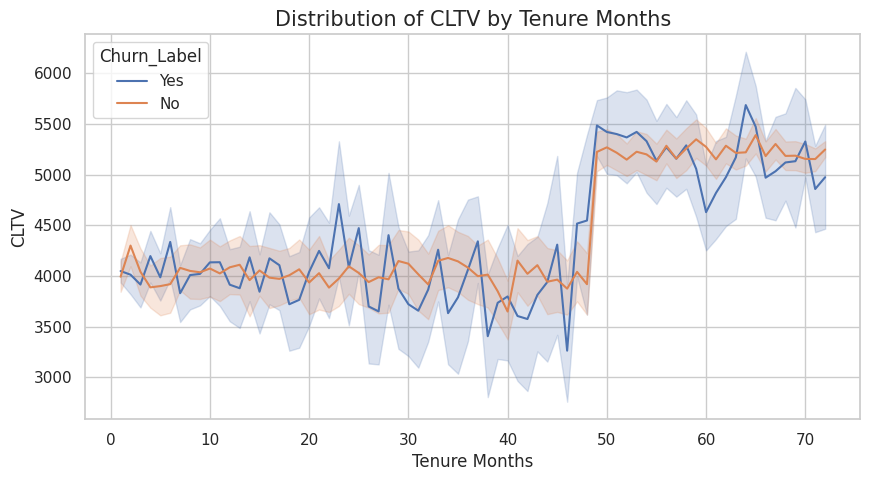

In [210]:
# plot line plots for continuous variables except tenure months

cont_col = ['Monthly_Charges', 'Total_Charges', 'Churn_Score', 'CLTV']
for col in cont_col:
  plt.figure(figsize=(10,5))
  sns.lineplot(x='Tenure_Months', y=col, hue='Churn_Label', data=df1)
  plt.title(f"Distribution of {col} by Tenure Months", size=15)
  plt.xlabel("Tenure Months")
  plt.ylabel(col)
  plt.show()


## Box Plot for continuous variables

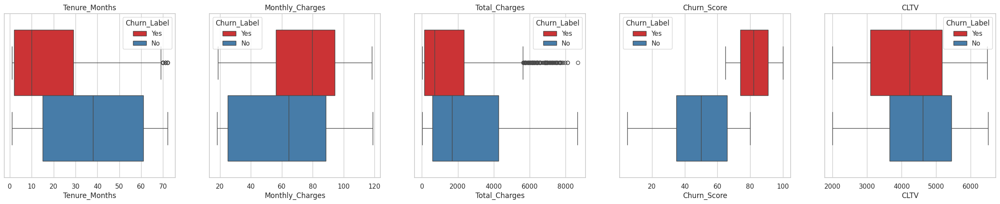

In [211]:
sns.set(style='whitegrid')

fig, axes = plt.subplots(1, len(continuous_columns), figsize=(30,5))

for i, col in enumerate(continuous_columns):
    sns.boxplot(data=df1, x=col, hue="Churn_Label", palette="Set1", ax=axes[i])
    axes[i].set_title(col)

plt.show()

### There are a few outliers in the total charges column and we will retain them for information.

## Plots for Categorical Variables

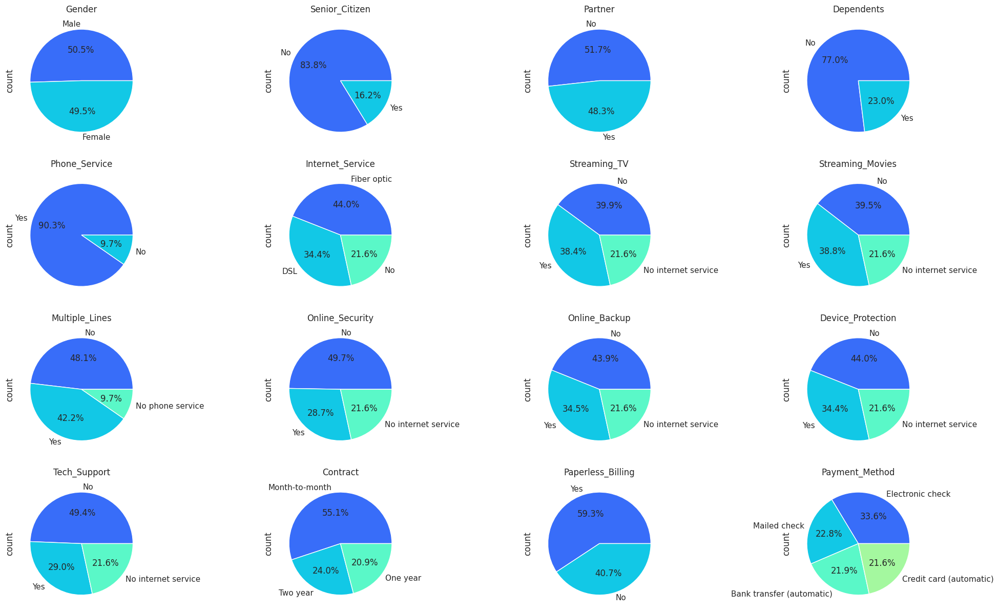

In [212]:
sns.set(style='whitegrid')

Categorical_columns = ['Gender', 'Senior_Citizen',
       'Partner', 'Dependents', 'Phone_Service',
        'Internet_Service', 'Streaming_TV',
       'Streaming_Movies', 'Multiple_Lines', 'Online_Security',
       'Online_Backup', 'Device_Protection', 'Tech_Support', 'Contract', 'Paperless_Billing', 'Payment_Method',
       'Churn_Label', 'Churn_Value']

fig, axes = plt.subplots(4, 4, figsize=(25, 15))

# Plot the pie charts for each categorical column
for i, col in enumerate(Categorical_columns):
    if i < 16:
        ax = axes[i // 4, i % 4]
        df1[col].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=sns.color_palette('rainbow'), ax=ax)
        ax.set_title(col)

plt.show()

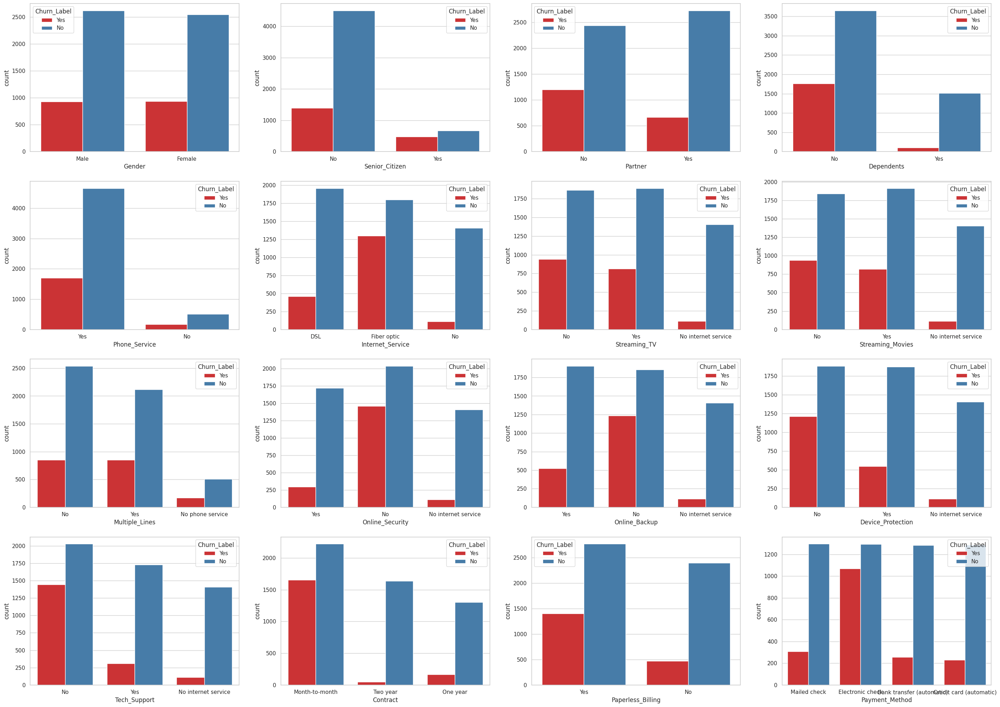

In [213]:
# Plot stacked bar charts for all the categorical variables with hue churn_label in 3 rows

sns.set(style='whitegrid')

fig, axes = plt.subplots(4, 4, figsize=(35, 25))

# Plot the stacked bar charts for each categorical column
for i, col in enumerate(Categorical_columns):
    if i < 16:
        ax = axes[i // 4, i % 4]
        sns.countplot(x=col, hue="Churn_Label", data=df1, palette="Set1", ax=ax)


plt.show()

## Distribution of Products by Contract Type





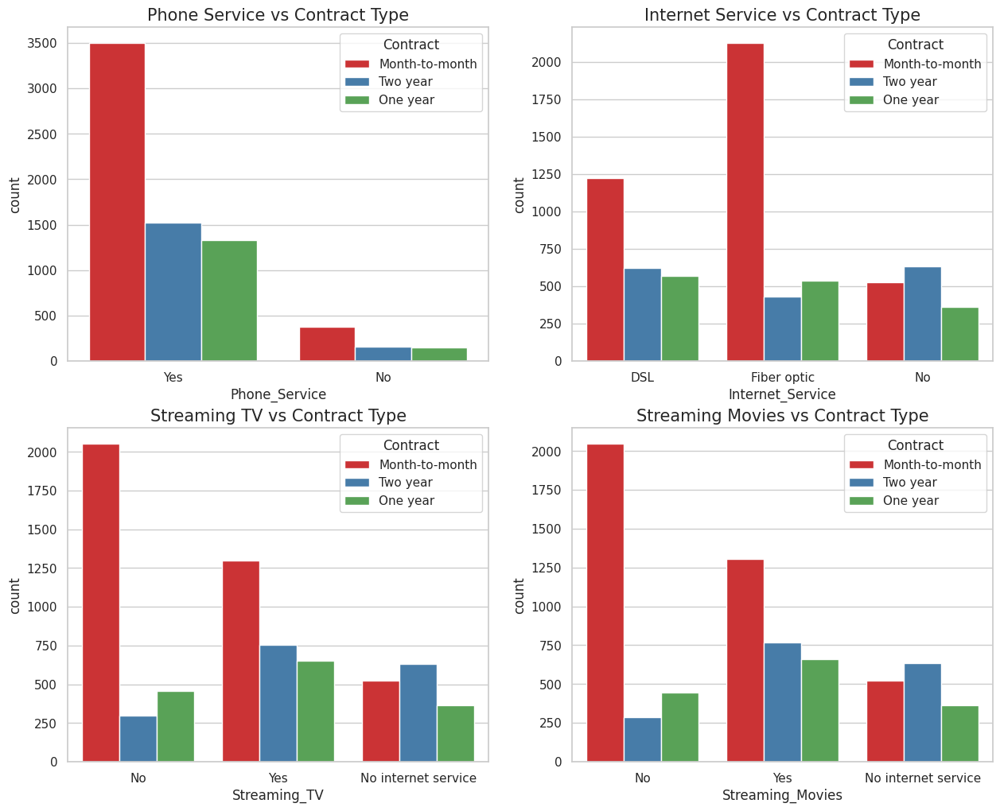

In [214]:
# Plot the distribution of "Phone_Service", "Internet_Service", 'Streaming_TV', 'Streaming_Movies' versus contract type

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('whitegrid')

fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Plot the distribution of "Phone_Service" versus contract type
sns.countplot(x='Phone_Service', hue='Contract', data=df1, palette='Set1', ax=axes[0, 0])
axes[0, 0].set_title('Phone Service vs Contract Type', size=15)

# Plot the distribution of "Internet_Service" versus contract type
sns.countplot(x='Internet_Service', hue='Contract', data=df1, palette='Set1', ax=axes[0, 1])
axes[0, 1].set_title('Internet Service vs Contract Type', size=15)

# Plot the distribution of "Streaming_TV" versus contract type
sns.countplot(x='Streaming_TV', hue='Contract', data=df1, palette='Set1', ax=axes[1, 0])
axes[1, 0].set_title('Streaming TV vs Contract Type', size=15)

# Plot the distribution of "Streaming_Movies" versus contract type
sns.countplot(x='Streaming_Movies', hue='Contract', data=df1, palette='Set1', ax=axes[1, 1])
axes[1, 1].set_title('Streaming Movies vs Contract Type', size=15)

plt.show()

## Distribution of Products across Churn Labels

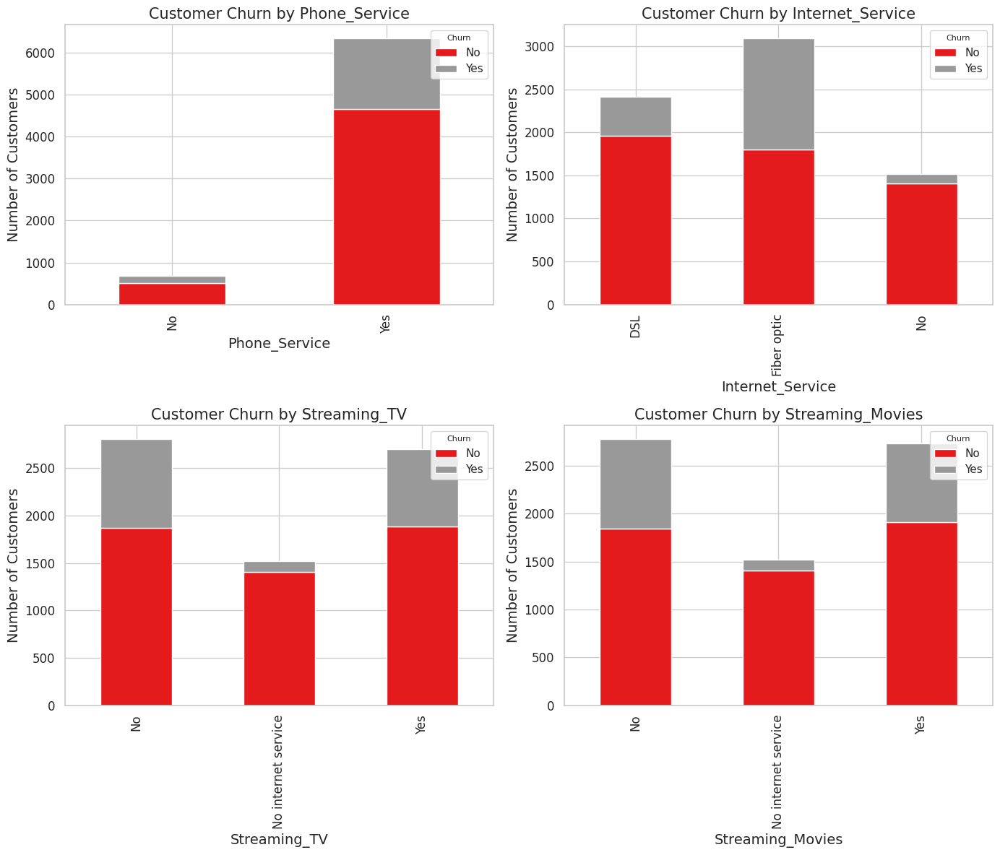

In [215]:
# Plot customer churn by services for all services using group by 3 *3 subplots

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Plot the customer churn by service for each service
services = ['Phone_Service', 'Internet_Service', 'Streaming_TV', 'Streaming_Movies']

for i, service in enumerate(services):
    ax = axes[i // 2, i % 2]
    df1.groupby(service)['Churn_Label'].value_counts().unstack().plot(kind='bar', stacked=True, ax=ax, cmap="Set1")
    ax.set_title(f'Customer Churn by {service}', size=15)
    ax.set_xlabel(service, size=14)
    ax.set_ylabel('Number of Customers', size=14)
    ax.legend(loc='upper right', title='Churn', title_fontsize=8)
    ax.tick_params(axis='both', labelsize=12)

plt.tight_layout()
plt.show()

## Distribution of Services by Contract Type


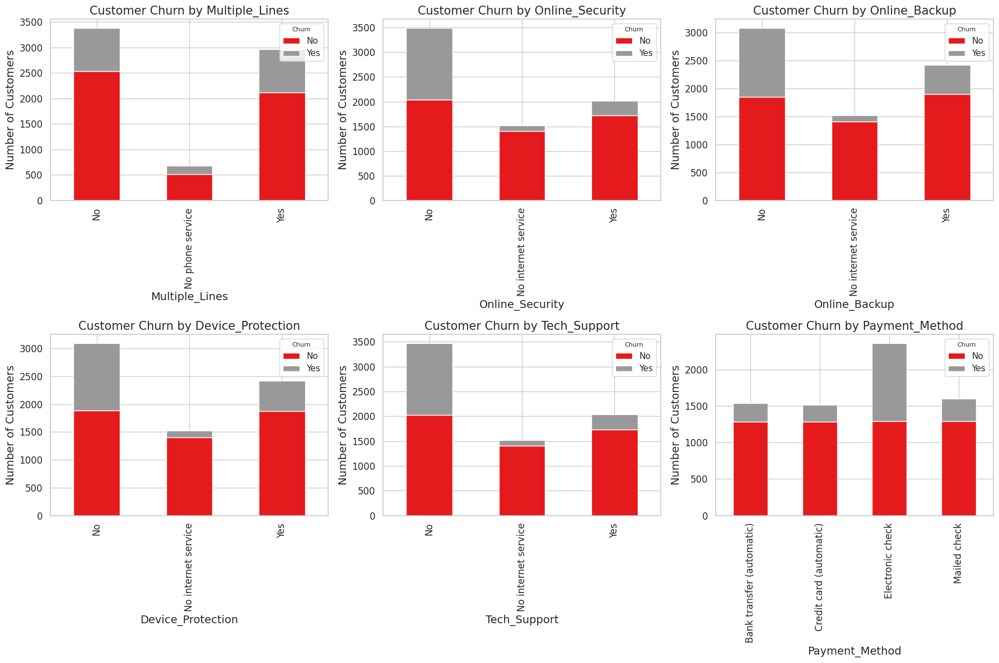

In [216]:
services_columns = [
       'Multiple_Lines', 'Online_Security',
       'Online_Backup', 'Device_Protection', 'Tech_Support', 'Payment_Method']

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Plot the customer churn by service for each service

for i, service in enumerate(services_columns):
    ax = axes[i // 3, i % 3]
    df1.groupby(service)['Churn_Label'].value_counts().unstack().plot(kind='bar', stacked=True, ax=ax, cmap="Set1")
    ax.set_title(f'Customer Churn by {service}', size=15)
    ax.set_xlabel(service, size=14)
    ax.set_ylabel('Number of Customers', size=14)
    ax.legend(loc='upper right', title='Churn', title_fontsize=8)
    ax.tick_params(axis='both', labelsize=12)

plt.tight_layout()
plt.show()

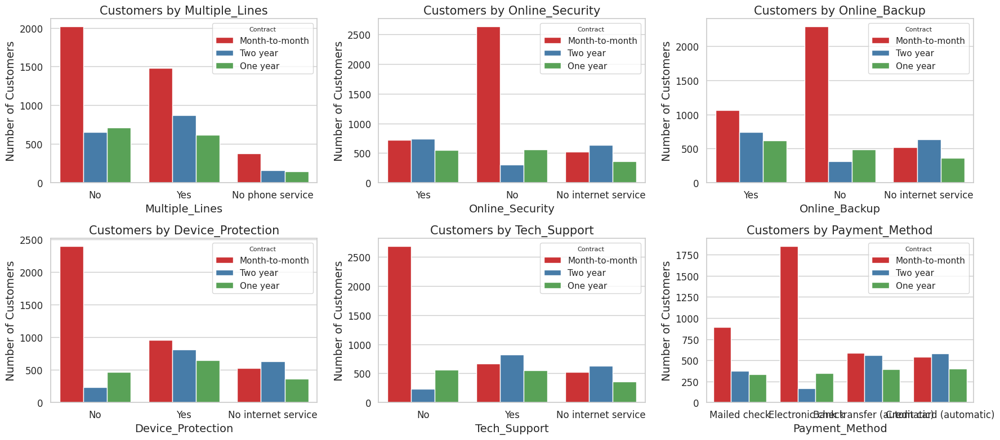

In [217]:
# create count plots for all the services columns in 3 rows using subplots

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('whitegrid')

services_columns = [
       'Multiple_Lines', 'Online_Security',
       'Online_Backup', 'Device_Protection', 'Tech_Support', 'Payment_Method']

# Create a 3x3 subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 8))

# Plot the count plot for each service column
for i, service in enumerate(services_columns):
    ax = axes[i // 3, i % 3]
    sns.countplot(x=service, data=df1, palette='Set1', ax=ax, hue="Contract")
    ax.set_title(f'Customers by {service}', size=15)
    ax.set_xlabel(service, size=14)
    ax.set_ylabel('Number of Customers', size=14)
    ax.legend(loc='upper right', title='Contract', title_fontsize=8)
    ax.tick_params(axis='both', labelsize=12)
    ax.set_xticklabels( labels=ax.get_xticklabels())


plt.tight_layout()
plt.show()

## Customer count by city

In [218]:
# import filter warnings

import warnings
warnings.filterwarnings('ignore')

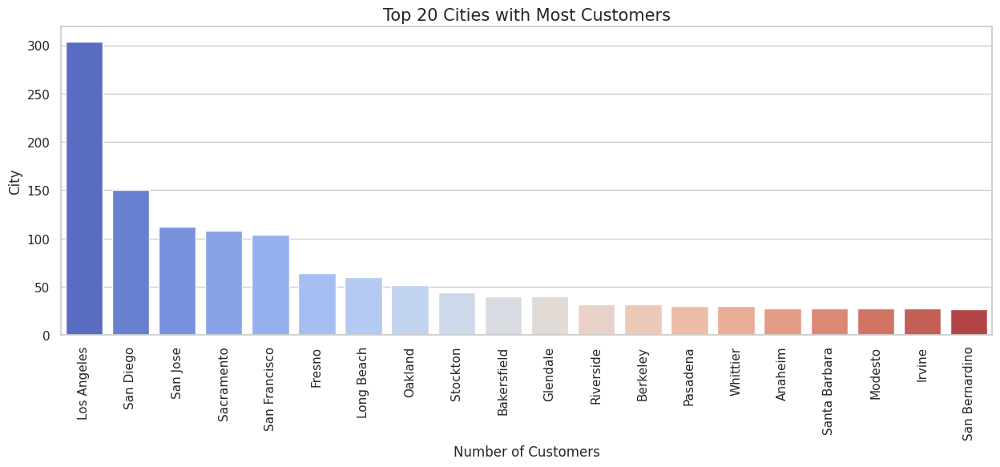

In [219]:
# Plot the customer count by city top 50

# Group by city and count the number of customers

sns.set(style='whitegrid')


df_city_count = df1.groupby('City')['CustomerID'].count().sort_values(ascending=False).head(20)

plt.figure(figsize=(15, 5))
sns.barplot(y=df_city_count.values, x=df_city_count.index, palette="coolwarm")
plt.xlabel('Number of Customers')
plt.ylabel('City')
plt.xticks(rotation=90)
plt.title('Top 20 Cities with Most Customers', size=15)
plt.show()

## Customers Churn by City

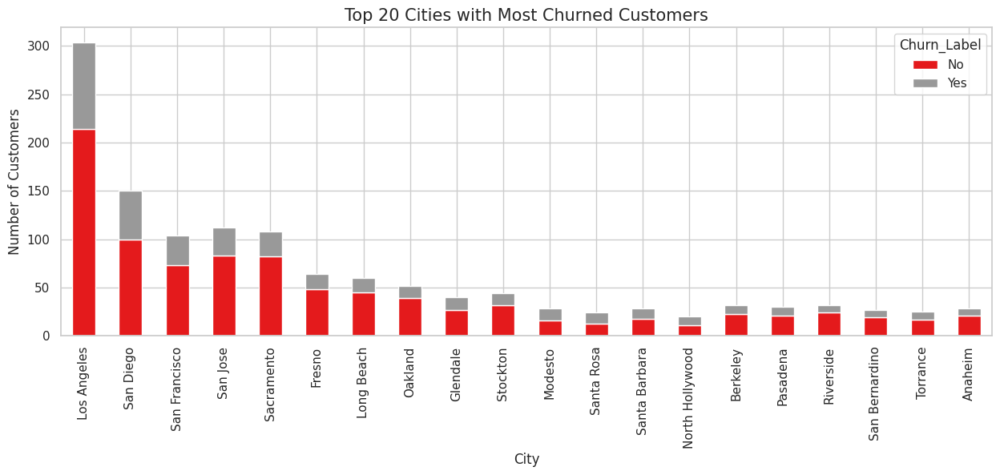

In [220]:

sns.set(style='whitegrid')

# Plot the customer churn by city top 50

# Group by city and churn
grouped_data = df1.groupby('City')['Churn_Label'].value_counts().unstack()

# Sort by churned customers
grouped_data = grouped_data.sort_values(by='Yes', ascending=False)

# Get the top 50 cities with the most churned customers
top_20_cities = grouped_data.head(20)

# Plot the bar chart
top_20_cities.plot(kind='bar',stacked=True, figsize=(15, 5), cmap="Set1")

# Add title and labels
plt.title('Top 20 Cities with Most Churned Customers', size=15)
plt.xlabel('City')
plt.ylabel('Number of Customers')

# Show the plot
plt.show()

## Customer Churn by Contract

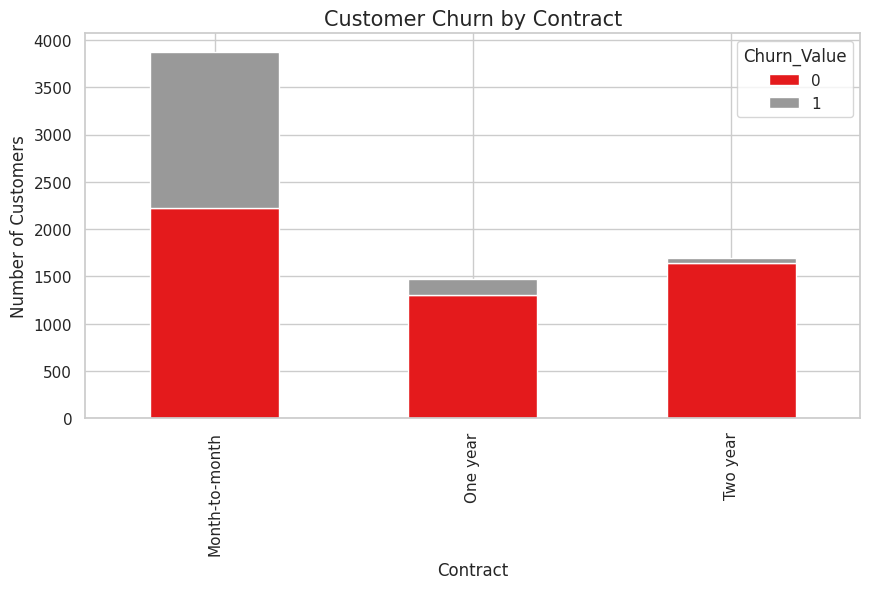

In [221]:
sns.set(style='whitegrid')

contract_df = df.groupby('Contract')['Churn_Value'].value_counts().unstack()
contract_df.plot(kind='bar',stacked=True, figsize=(10, 5), cmap="Set1")
plt.title('Customer Churn by Contract', size=15)
plt.xlabel('Contract')
plt.ylabel('Number of Customers')
plt.show()

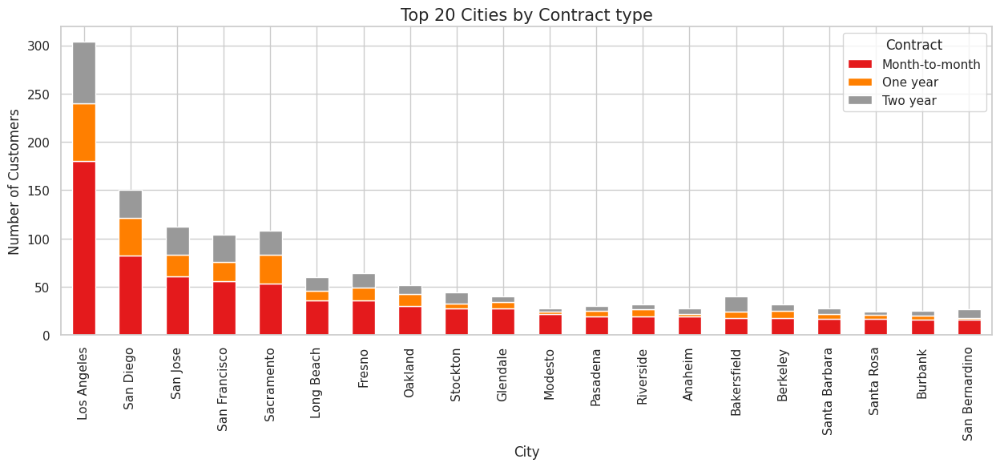

In [222]:
# Plot the distribution of contracts by city from highest to lowest

# Group by city and contract type
grouped_data = df1.groupby('City')['Contract'].value_counts().unstack().fillna(0)

# Sort by two year contracts
grouped_data = grouped_data.sort_values(by='Month-to-month', ascending=False)

# Get the top 20 cities with the most two year contracts
top_20_cities = grouped_data.head(20)

# Plot the bar chart
top_20_cities.plot(kind='bar', stacked=True, figsize=(15, 5), cmap="Set1")

# Add title and labels
plt.title('Top 20 Cities by Contract type', size=15)
plt.xlabel('City')
plt.ylabel('Number of Customers')

# Show the plot
plt.show()

## Churn Reason Distribution

In [223]:
import warnings
warnings.filterwarnings("ignore")

In [224]:
df1["Churn_Reason"].value_counts()

Churn_Reason
Attitude of support person                   192
Competitor offered higher download speeds    189
Competitor offered more data                 162
Don't know                                   154
Competitor made better offer                 140
Attitude of service provider                 135
Competitor had better devices                130
Network reliability                          103
Product dissatisfaction                      102
Price too high                                98
Service dissatisfaction                       89
Lack of self-service on Website               88
Extra data charges                            57
Moved                                         53
Limited range of services                     44
Long distance charges                         44
Lack of affordable download/upload speed      44
Poor expertise of phone support               20
Poor expertise of online support              19
Deceased                                       6
Name: c

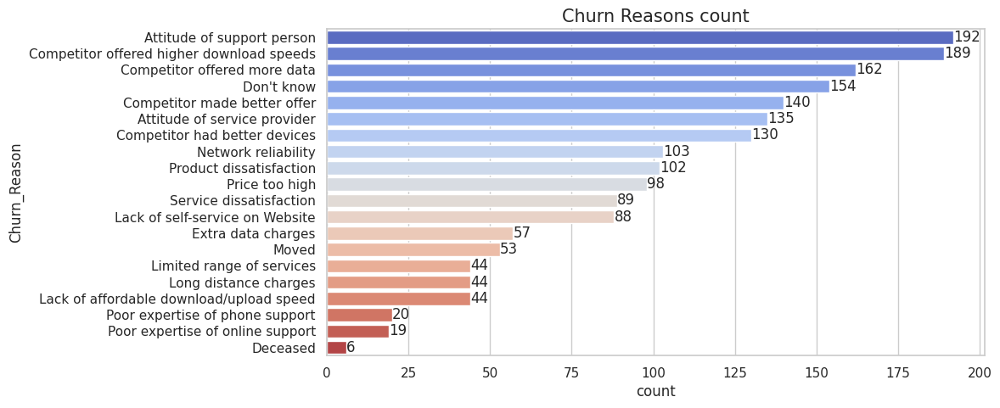

In [225]:
# Convert the above data into a dataframe and plot a bar chart and apply gradient style coloring to the bars and display labels on the bars

# Convert the data into a dataframe
df_churn_reason = df1['Churn_Reason'].value_counts().to_frame(name='Count')

# Plot a bar chart
plt.figure(figsize=(10, 5))
ax = sns.countplot(data=df1, y='Churn_Reason', palette="coolwarm", order=df['Churn_Reason'].value_counts().index)
ax.set_title('Churn Reasons count', size=15)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
for container in ax.containers:
    ax.bar_label(container)

# Show the plot
plt.show()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


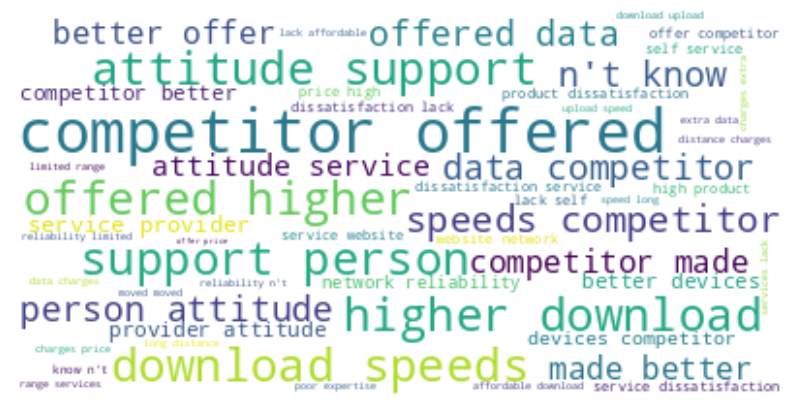

In [226]:
# Create a word cloud for the churn reason column, apply stop words, lower case letters
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Get the text from the "Churn Reason" column
text = " ".join(df1["Churn_Reason"].dropna().astype(str).values)

# Lowercase the text
text = text.lower()

# Tokenize the text
tokens = word_tokenize(text)

# Remove stop words
stop_words = set(stopwords.words("english"))
tokens = [token for token in tokens if token not in stop_words]

# Create a WordCloud object
wordcloud = WordCloud(stopwords=stop_words, background_color="white").generate(" ".join(tokens))

# Display the word cloud
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## Compare CLTV for different Tenure months

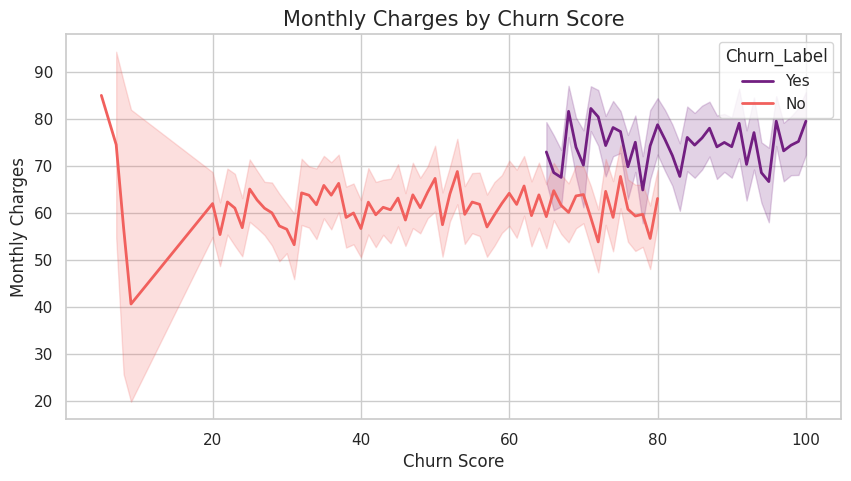

In [227]:
# Plot the line plot for Monthly charges against churn score and make the lines darker and bolder

plt.figure(figsize=(10, 5))
sns.lineplot(x='Churn_Score', y='Monthly_Charges', data=df1, linewidth=2, palette="magma", hue='Churn_Label')
plt.title('Monthly Charges by Churn Score', size=15)
plt.xlabel('Churn Score')
plt.ylabel('Monthly Charges')
plt.show()

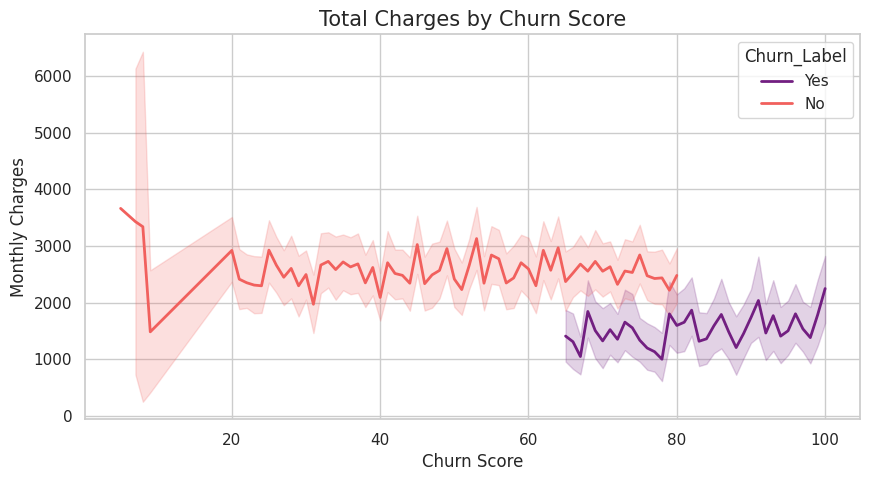

In [228]:
plt.figure(figsize=(10, 5))
sns.lineplot(x='Churn_Score', y='Total_Charges', data=df1, linewidth=2, palette="magma", hue='Churn_Label')
plt.title('Total Charges by Churn Score', size=15)
plt.xlabel('Churn Score')
plt.ylabel('Monthly Charges')
plt.show()

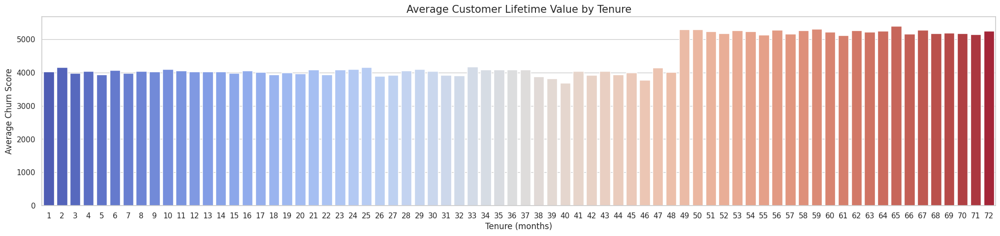

In [229]:
# Plot the churn score by tenure

sns.set(style='whitegrid')

# Group by tenure and calculate the average churn score
churn_score_by_tenure = df1.groupby('Tenure_Months')['CLTV'].mean().reset_index().sort_values(by='CLTV', ascending =True)

# Create a bar chart
plt.figure(figsize=(25, 5))
sns.barplot(x='Tenure_Months', y='CLTV', data=churn_score_by_tenure, palette='coolwarm')
plt.xlabel('Tenure (months)')
plt.ylabel('Average Churn Score')
plt.title('Average Customer Lifetime Value by Tenure', size=15)
plt.show()

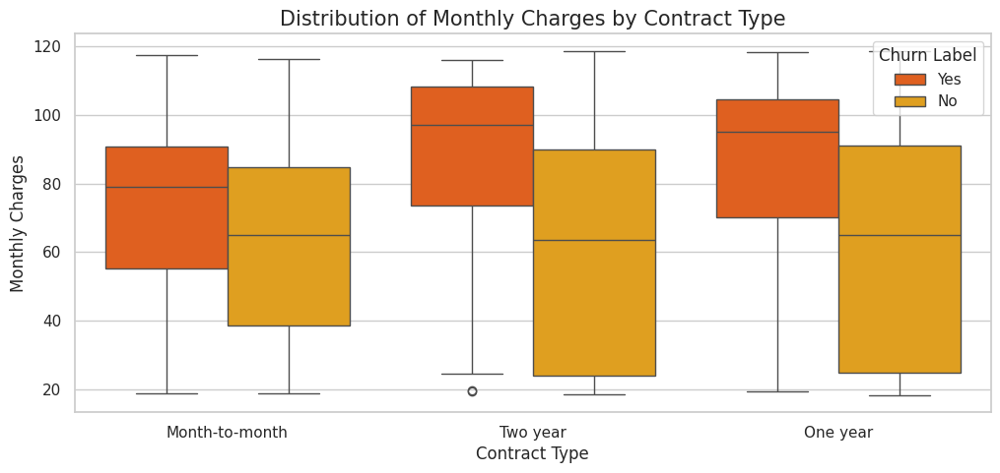

In [230]:
# Plot the distribution of monthly charges by Contract type with hue churn_label

sns.set(style='whitegrid')

# Plot the distribution of monthly charges by Contract type with hue churn_label
plt.figure(figsize=(12, 5))
sns.boxplot(x='Contract', y='Monthly_Charges', hue='Churn_Label', data=df1, palette='autumn')
plt.title('Distribution of Monthly Charges by Contract Type', size=15)
plt.xlabel('Contract Type')
plt.ylabel('Monthly Charges')
plt.legend(title='Churn Label', loc="upper right")
plt.show()

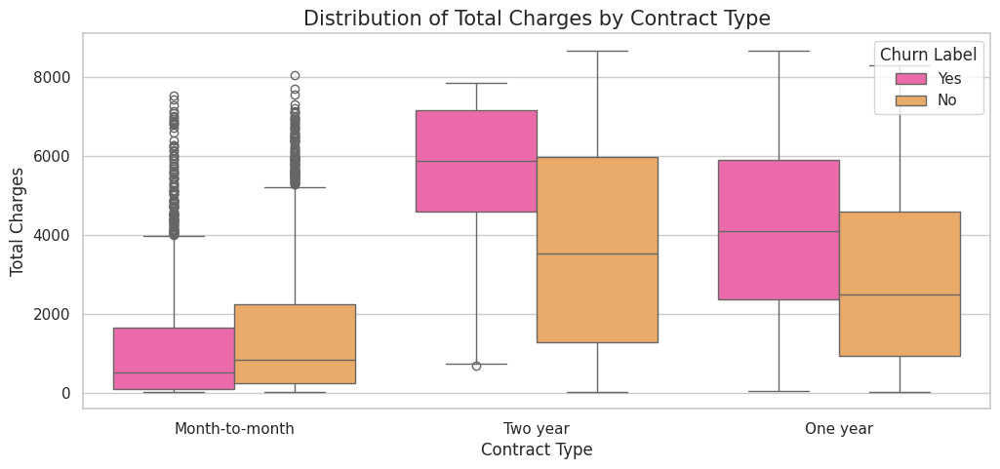

In [231]:
# Plot the distribution of total charges by Contract type with hue churn_label

sns.set(style='whitegrid')

# Plot the distribution of total charges by Contract type with hue churn_label
plt.figure(figsize=(12, 5))
sns.boxplot(x='Contract', y='Total_Charges', hue='Churn_Label', data=df1, palette='spring')
plt.title('Distribution of Total Charges by Contract Type', size=15)
plt.xlabel('Contract Type')
plt.ylabel('Total Charges')
plt.legend(title='Churn Label', loc="upper right")
plt.show()

## Distribution of continuous variables by Contract type

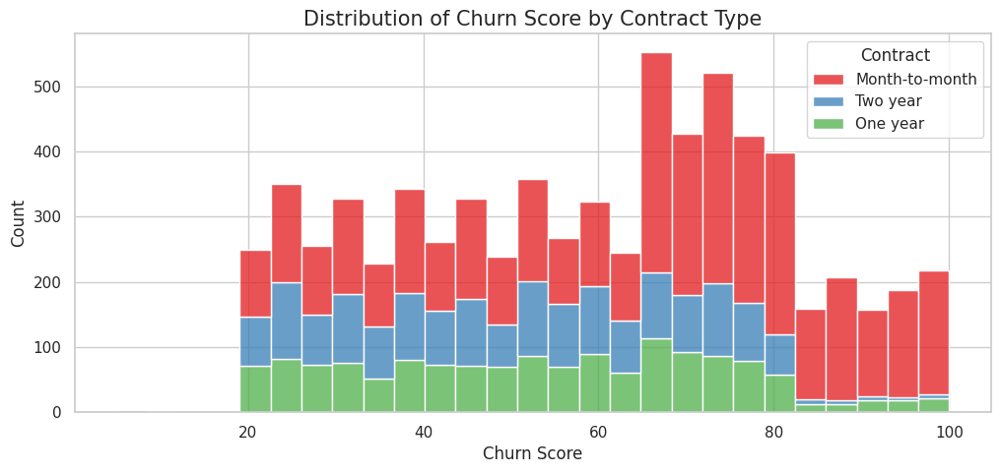

In [232]:

sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(12, 5))

# Plot the distribution of monthly charges by Contract type with hue churn_label
sns.histplot(data=df1, x="Churn_Score", hue="Contract", multiple="stack", palette="Set1", ax=ax)

# Set the title and labels
ax.set_title('Distribution of Churn Score by Contract Type', size=15)
ax.set_xlabel('Churn Score')
ax.set_ylabel('Count')

# Show the plot
plt.show()

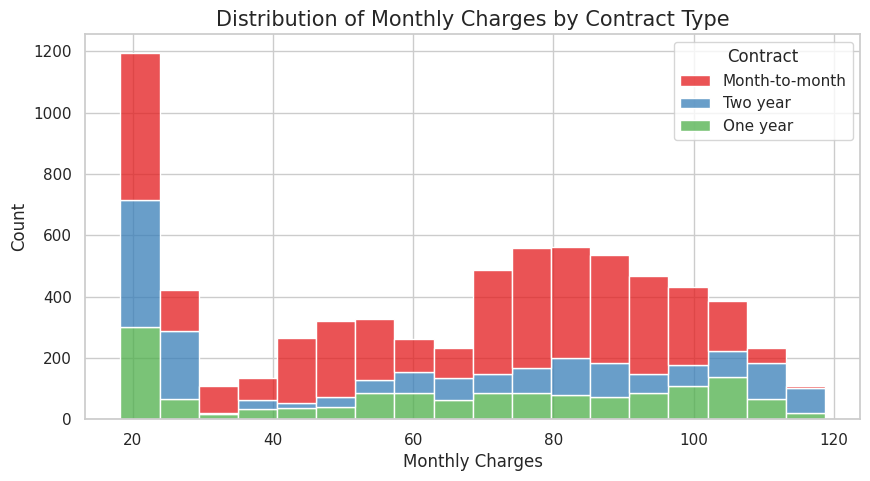

In [233]:
# Plot the distribution of monthly charges by Contract type with hue churn_label

sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(10, 5))

# Plot the distribution of monthly charges by Contract type with hue churn_label
sns.histplot(data=df1, x="Monthly_Charges", hue="Contract", multiple="stack", palette="Set1", ax=ax)

# Set the title and labels
ax.set_title('Distribution of Monthly Charges by Contract Type', size=15)
ax.set_xlabel('Monthly Charges')
ax.set_ylabel('Count')

# Show the plot
plt.show()

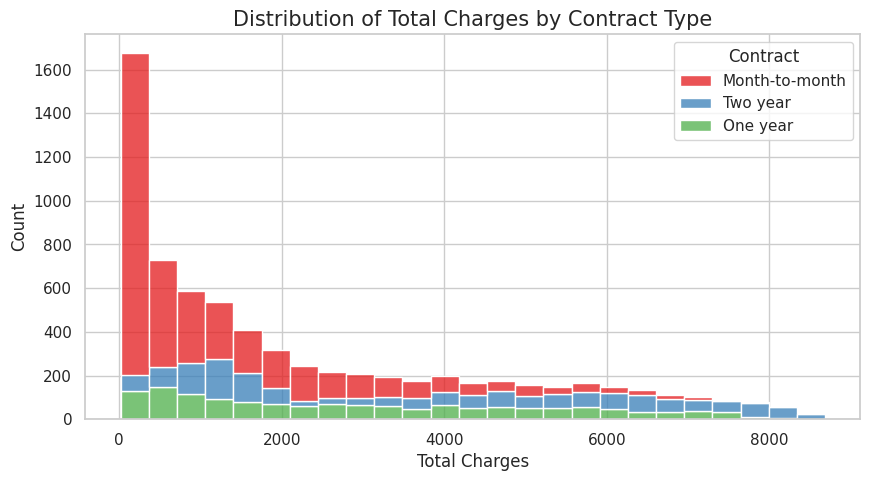

In [234]:
# Plot the distribution of monthly charges by Contract type with hue churn_label

sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(10, 5))

# Plot the distribution of monthly charges by Contract type with hue churn_label
sns.histplot(data=df1, x="Total_Charges", hue="Contract", multiple="stack", palette="Set1", ax=ax)

# Set the title and labels
ax.set_title('Distribution of Total Charges by Contract Type', size=15)
ax.set_xlabel('Total Charges')
ax.set_ylabel('Count')

# Show the plot
plt.show()

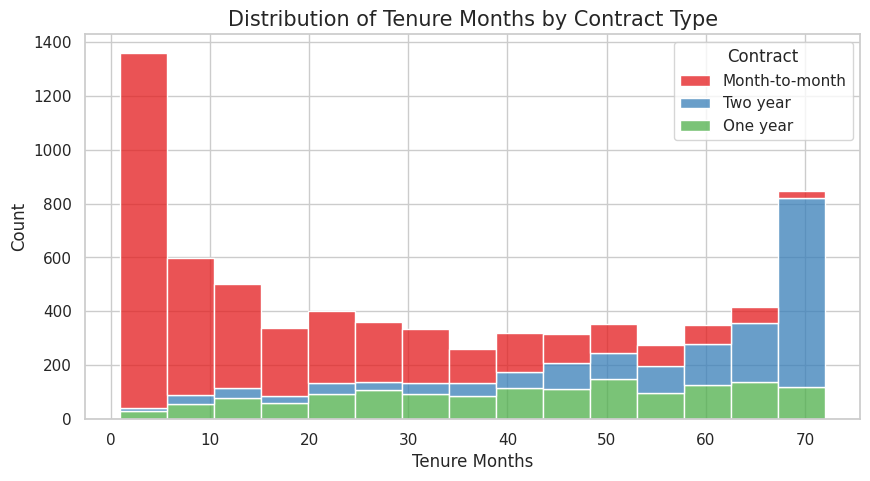

In [235]:
# Plot the distribution of monthly charges by Contract type with hue churn_label

sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(10, 5))

# Plot the distribution of monthly charges by Contract type with hue churn_label
sns.histplot(data=df1, x="Tenure_Months", hue="Contract", multiple="stack", palette="Set1", ax=ax)

# Set the title and labels
ax.set_title('Distribution of Tenure Months by Contract Type', size=15)
ax.set_xlabel('Tenure Months')
ax.set_ylabel('Count')

# Show the plot
plt.show()

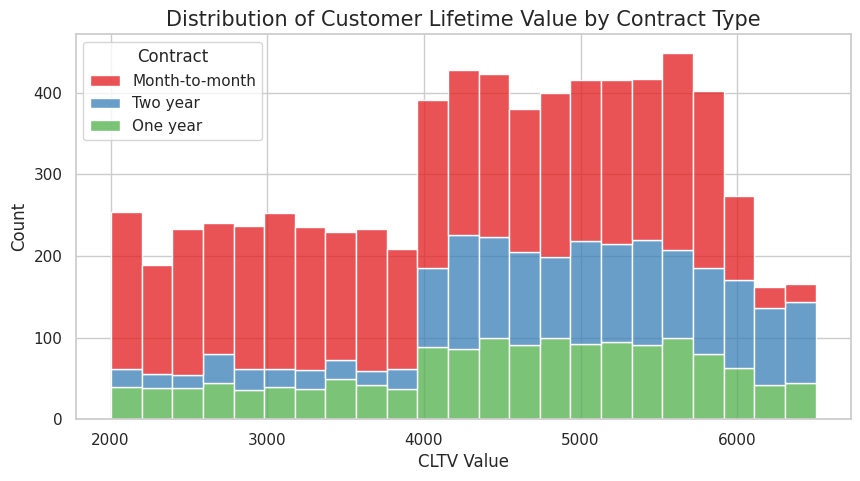

In [236]:
# Plot the distribution of monthly charges by Contract type with hue churn_label

sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(10, 5))

# Plot the distribution of monthly charges by Contract type with hue churn_label
sns.histplot(data=df1, x="CLTV", hue="Contract", multiple="stack", palette="Set1", ax=ax)

# Set the title and labels
ax.set_title('Distribution of Customer Lifetime Value by Contract Type', size=15)
ax.set_xlabel('CLTV Value')
ax.set_ylabel('Count')

# Show the plot
plt.show()

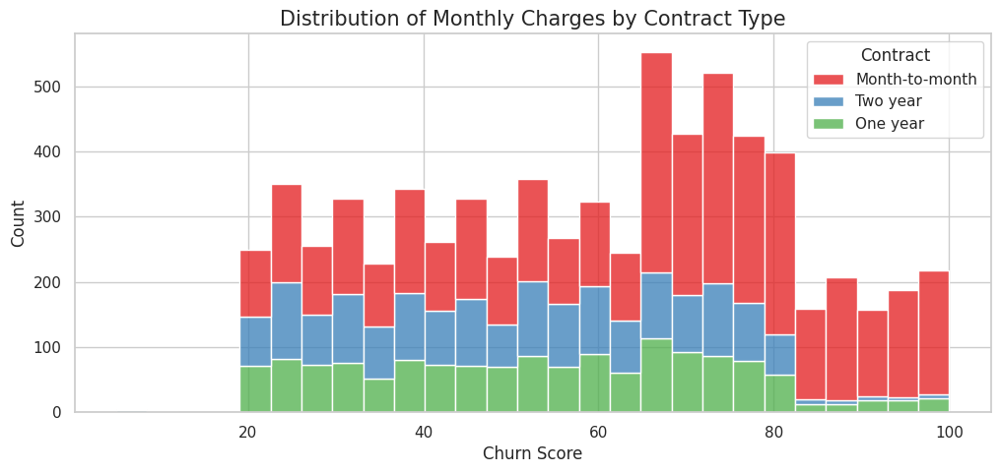

In [237]:
# Plot the distribution of monthly charges by Contract type with hue churn_label

sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(12, 5))

# Plot the distribution of monthly charges by Contract type with hue churn_label
sns.histplot(data=df1, x="Churn_Score", hue="Contract", multiple="stack", palette="Set1", ax=ax)

# Set the title and labels
ax.set_title('Distribution of Monthly Charges by Contract Type', size=15)
ax.set_xlabel('Churn Score')
ax.set_ylabel('Count')

# Show the plot
plt.show()

In [238]:
# Plot the latitude and longitudes on a map

import folium
import pandas as pd

# Load the data

# Create a map object
map = folium.Map(location=[df1["Latitude"].mean(), df1["Longitude"].mean()], zoom_start=5)

# Add markers to the map for each customer
for i, row in df.iterrows():
    folium.Marker([row["Latitude"], row["Longitude"]], popup=row["Zip_Code"]).add_to(map)

# Display the map
map

Output hidden; open in https://colab.research.google.com to view.

In [239]:

import folium

# Create a map object
map = folium.Map(location=[df1["Latitude"].mean(), df1["Longitude"].mean()], zoom_start=5)

# Add markers to the map for each customer, colored by churn label
for i, row in df.iterrows():
    color = "green" if row["Churn_Label"] == "No" else "red"
    folium.Marker([row["Latitude"], row["Longitude"]], popup=row["Zip_Code"], icon=folium.Icon(color=color)).add_to(map)

# Display the map
map

Output hidden; open in https://colab.research.google.com to view.

### Monthly Charges heatmap

In [240]:
# Plot the monthly charges on a map using a heatmap

import folium
from folium.plugins import HeatMap

# Get the data
df = df1.copy()

# Create a map object
map = folium.Map(location=[df1["Latitude"].mean(), df1["Longitude"].mean()], zoom_start=5)

# Create a heatmap layer
heat_data = [[row["Latitude"], row["Longitude"], row["Monthly_Charges"]] for i, row in df1.iterrows()]
heat_map = HeatMap(heat_data, radius=15)

# Add the heatmap layer to the map
map.add_child(heat_map)

# Display the map
map

## Churn Score

In [241]:
## Show the city with the highest churn score
import folium
from folium.plugins import HeatMap

# Get the data
df = df1.copy()

# Create a map object
map = folium.Map(location=[df1["Latitude"].mean(), df1["Longitude"].mean()], zoom_start=5)

# Create a heatmap layer
heat_data = [[row["Latitude"], row["Longitude"], row["Churn_Score"]] for i, row in df1.iterrows()]
heat_map = HeatMap(heat_data, radius=15)

# Add the heatmap layer to the map
map.add_child(heat_map)

# Get the highest churn score and the city
max_churn_score = df["Churn_Score"].max()
max_churn_city = df[df["Churn_Score"] == max_churn_score]["City"].values[0]

# Add a marker to the map for the city with the highest churn score
folium.Marker(
    location=[df[df["City"] == max_churn_city]["Latitude"].values[0], df[df["City"] == max_churn_city]["Longitude"].values[0]],
    popup=f"Highest Churn Score: {max_churn_score} in {max_churn_city}",
).add_to(map)

# Display the map
map

## Encoding Categorical variables

In [242]:
df2 =data.copy()
df2.shape

(7032, 33)

In [243]:
df2.isnull().sum()

CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip_Code                0
Lat_Long                0
Latitude                0
Longitude               0
Gender                  0
Senior_Citizen          0
Partner                 0
Dependents              0
Tenure_Months           0
Phone_Service           0
Multiple_Lines          0
Internet_Service        0
Online_Security         0
Online_Backup           0
Device_Protection       0
Tech_Support            0
Streaming_TV            0
Streaming_Movies        0
Contract                0
Paperless_Billing       0
Payment_Method          0
Monthly_Charges         0
Total_Charges           0
Churn_Label             0
Churn_Value             0
Churn_Score             0
CLTV                    0
Churn_Reason         5163
dtype: int64

In [244]:
df3= df2[['Gender', 'Senior_Citizen',
       'Partner', 'Dependents', 'Tenure_Months', 'Phone_Service',
       'Multiple_Lines', 'Internet_Service', 'Online_Security',
       'Online_Backup', 'Device_Protection', 'Tech_Support', 'Streaming_TV',
       'Streaming_Movies', 'Contract', 'Paperless_Billing', 'Payment_Method',
       'Monthly_Charges', 'Total_Charges', 'Churn_Value',
       'Churn_Score', 'CLTV']]

df3.head()

,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,Multiple_Lines,Internet_Service,Online_Security,Online_Backup,...,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value,Churn_Score,CLTV
0,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,...,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,86,3239
1,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,...,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,67,2701
2,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,...,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,1,86,5372
3,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,...,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1,84,5003
4,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,...,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.30,1,89,5340


In [245]:
df3.dtypes.value_counts()

object     16
int64       4
float64     2
Name: count, dtype: int64

In [246]:
df3.isnull().sum()

Gender               0
Senior_Citizen       0
Partner              0
Dependents           0
Tenure_Months        0
Phone_Service        0
Multiple_Lines       0
Internet_Service     0
Online_Security      0
Online_Backup        0
Device_Protection    0
Tech_Support         0
Streaming_TV         0
Streaming_Movies     0
Contract             0
Paperless_Billing    0
Payment_Method       0
Monthly_Charges      0
Total_Charges        0
Churn_Value          0
Churn_Score          0
CLTV                 0
dtype: int64

In [247]:
df3.columns

Index(['Gender', 'Senior_Citizen', 'Partner', 'Dependents', 'Tenure_Months',
       'Phone_Service', 'Multiple_Lines', 'Internet_Service',
       'Online_Security', 'Online_Backup', 'Device_Protection', 'Tech_Support',
       'Streaming_TV', 'Streaming_Movies', 'Contract', 'Paperless_Billing',
       'Payment_Method', 'Monthly_Charges', 'Total_Charges', 'Churn_Value',
       'Churn_Score', 'CLTV'],
      dtype='object')

## Encoding the Categorical Columns

In [248]:
gender_map = {'Female': 0, 'Male': 1}
yes_or_no_map = {'No': 0, 'Yes': 1} #seniorcitizen, partner, dependents, phoneservice, paperlessbilling
multiplelines_map = {'No phone service': -1, 'No': 0, 'Yes': 1}
internetservice_map = {'No': -1, 'DSL': 0, 'Fiber optic': 1}
add_netservices_map = {'No internet service': -1, 'No': 0, 'Yes': 1} #onlinesecurity, onlinebackup, deviceprotection,techsupport,streaming services
contract_map = {'Month-to-month': 0, 'One year': 1, 'Two year': 2}
paymentmethod_map = {'Electronic check': 0, 'Mailed check': 1, 'Bank transfer (automatic)': 2, 'Credit card (automatic)': 3}


In [249]:

df3['Gender'] = df3['Gender'].map(gender_map).astype('int')
df3['Partner'] = df3['Partner'].map(yes_or_no_map).astype('int')
df3['Senior_Citizen'] = df3['Senior_Citizen'].map(yes_or_no_map).astype('int')
df3['Dependents'] = df3['Dependents'].map(yes_or_no_map).astype('int')
df3['Phone_Service'] = df3['Phone_Service'].map(yes_or_no_map).astype('int')
df3['Multiple_Lines'] = df3['Multiple_Lines'].map(multiplelines_map).astype('int')
df3['Internet_Service'] = df3['Internet_Service'].map(internetservice_map).astype('int')
df3['Online_Security'] = df3['Online_Security'].map(add_netservices_map).astype('int')
df3['Online_Backup'] = df3['Online_Backup'].map(add_netservices_map).astype('int')
df3['Device_Protection'] = df3['Device_Protection'].map(add_netservices_map).astype('int')
df3['Tech_Support'] = df3['Tech_Support'].map(add_netservices_map).astype('int')
df3['Streaming_TV'] = df3['Streaming_TV'].map(add_netservices_map).astype('int')
df3['Streaming_Movies'] = df3['Streaming_Movies'].map(add_netservices_map).astype('int')
df3['Contract'] = df3['Contract'].map(contract_map).astype('int')
df3['Paperless_Billing'] = df3['Paperless_Billing'].map(yes_or_no_map).astype('int')
df3['Payment_Method'] = df3['Payment_Method'].map(paymentmethod_map).astype('int')

In [250]:
df3.dtypes.value_counts()

int64      20
float64     2
Name: count, dtype: int64

## Applying Min-max scaler to the Numeric continuous columns

In [251]:
df4 =df3.copy()
df4.shape

(7032, 22)

In [252]:
df4.head()

,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,Multiple_Lines,Internet_Service,Online_Security,Online_Backup,...,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value,Churn_Score,CLTV
0,1,0,0,0,2,1,0,0,1,1,...,0,0,0,1,1,53.85,108.15,1,86,3239
1,0,0,0,1,2,1,0,1,0,0,...,0,0,0,1,0,70.70,151.65,1,67,2701
2,0,0,0,1,8,1,1,1,0,0,...,1,1,0,1,0,99.65,820.50,1,86,5372
3,0,0,1,1,28,1,1,1,0,0,...,1,1,0,1,0,104.80,3046.05,1,84,5003
4,1,0,0,1,49,1,1,1,0,1,...,1,1,0,1,2,103.70,5036.30,1,89,5340


In [253]:
# Apply minmax scaler to the continuous columns

from sklearn.preprocessing import MinMaxScaler

df4_scaled = df4.copy()


continuous_columns = ["Tenure_Months", 'Monthly_Charges', 'Total_Charges', 'Churn_Score', 'CLTV']

scaler = MinMaxScaler()

# Fit the scaler to the data
df4_scaled[continuous_columns] = scaler.fit_transform(df4_scaled[continuous_columns])

# Transform the data
df4_scaled.head()


,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,Multiple_Lines,Internet_Service,Online_Security,Online_Backup,...,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value,Churn_Score,CLTV
0,1,0,0,0,0.014085,1,0,0,1,1,...,0,0,0,1,1,0.354229,0.010310,1,0.852632,0.274850
1,0,0,0,1,0.014085,1,0,1,0,0,...,0,0,0,1,0,0.521891,0.015330,1,0.652632,0.155215
2,0,0,0,1,0.098592,1,1,1,0,0,...,1,1,0,1,0,0.809950,0.092511,1,0.852632,0.749166
3,0,0,1,1,0.380282,1,1,1,0,0,...,1,1,0,1,0,0.861194,0.349325,1,0.831579,0.667111
4,1,0,0,1,0.676056,1,1,1,0,1,...,1,1,0,1,2,0.850249,0.578987,1,0.884211,0.742050


## Correlation Heatmap

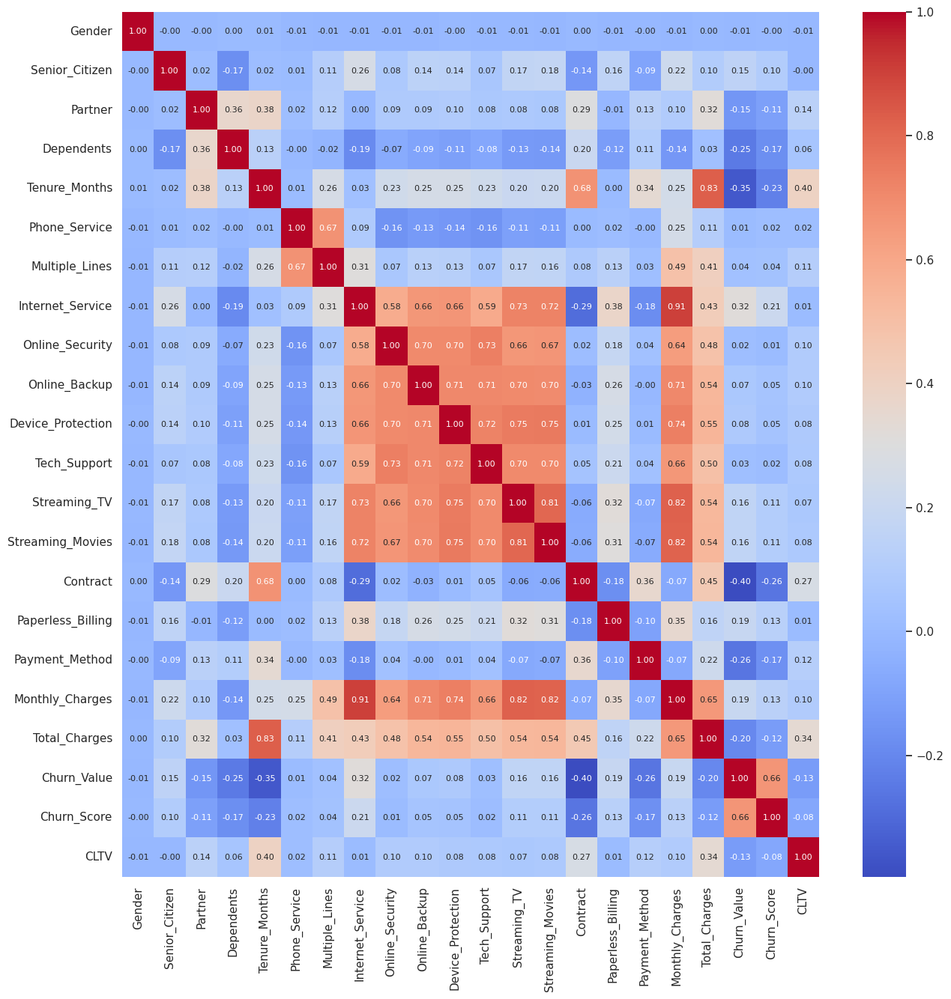

In [254]:
# Plot a correlation heatmap using seaborn

import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
corr = df4_scaled.corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))

# Generate the heatmap
sns.heatmap(corr, annot=True, fmt=".2f", ax=ax, annot_kws={"fontsize": 8}, cmap ="coolwarm")

# Display the heatmap
plt.show()

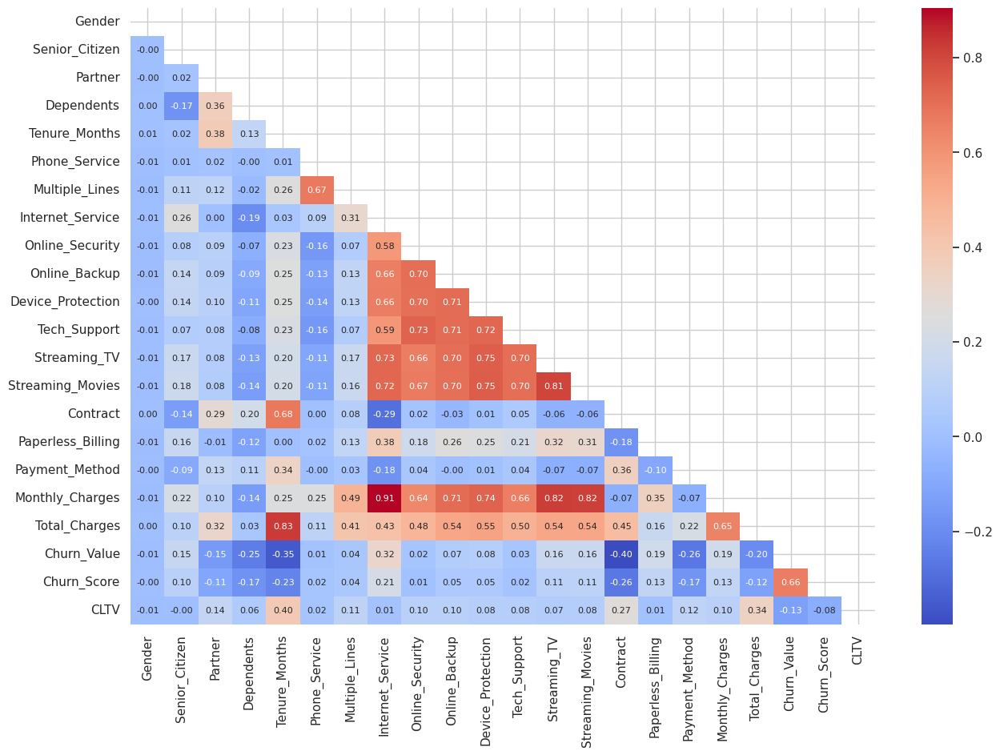

In [255]:

plt.figure(figsize = (15, 10))

corr = df4_scaled.corr()
mask = np.triu(np.ones_like(corr, dtype = bool))

sns.heatmap(corr, mask = mask, annot = True, fmt = ".2f", cmap="coolwarm", annot_kws={"fontsize": 8})
plt.show()

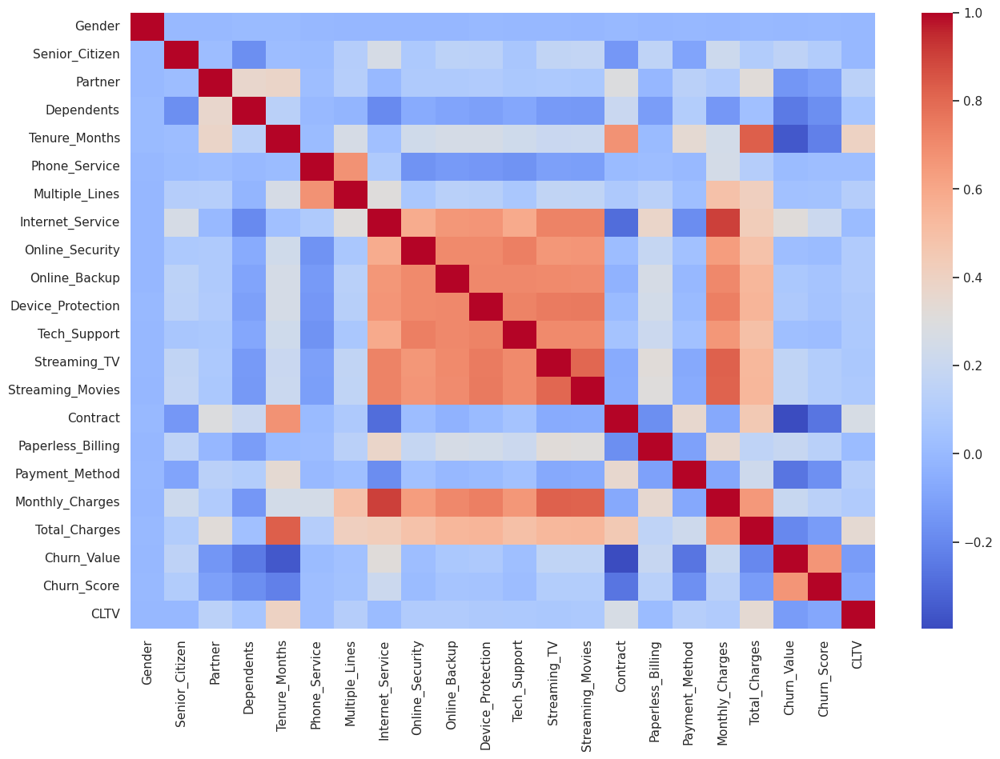

In [256]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
corr = df4_scaled.corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15,10))

# Generate the heatmap
sns.heatmap(corr, fmt=".2f", ax=ax, annot_kws={"fontsize": 8}, cmap ="coolwarm")

# Display the heatmap
plt.show()

In [257]:
# Color format the highest_correlations dataframe

highest_correlations = df4_scaled.corr().abs().unstack().sort_values(ascending=False).drop_duplicates()[:20]
corr_df = pd.DataFrame(highest_correlations)
corr_df.columns = ['Correlation']
corr_df.index.name = 'Features'
corr_df.style.background_gradient(cmap='coolwarm')

,,Correlation
Gender,Gender,1.000000
Monthly_Charges,Internet_Service,0.905389
Tenure_Months,Total_Charges,0.825880
Monthly_Charges,Streaming_TV,0.820193
Streaming_Movies,Monthly_Charges,0.817525
Streaming_TV,Streaming_Movies,0.807118
Streaming_Movies,Device_Protection,0.752755
Device_Protection,Streaming_TV,0.747489
Monthly_Charges,Device_Protection,0.736925
Online_Security,Tech_Support,0.734696


In [258]:
# Show the highest negative correlation values

# Get the highest negative correlations
highest_negative_correlations = df4_scaled.corr().unstack().sort_values().drop_duplicates()[:15]

# Create a DataFrame
corr_df = pd.DataFrame(highest_negative_correlations)
corr_df.columns = ['Correlation']
corr_df.index.name = 'Features'

# Color format the DataFrame
corr_df.style.background_gradient(cmap='coolwarm')

,,Correlation
Churn_Value,Contract,-0.396150
Tenure_Months,Churn_Value,-0.354049
Internet_Service,Contract,-0.288855
Churn_Value,Payment_Method,-0.262918
Churn_Score,Contract,-0.261917
Churn_Value,Dependents,-0.248140
Churn_Score,Tenure_Months,-0.226379
Total_Charges,Churn_Value,-0.199484
Internet_Service,Dependents,-0.193057
Payment_Method,Internet_Service,-0.178655


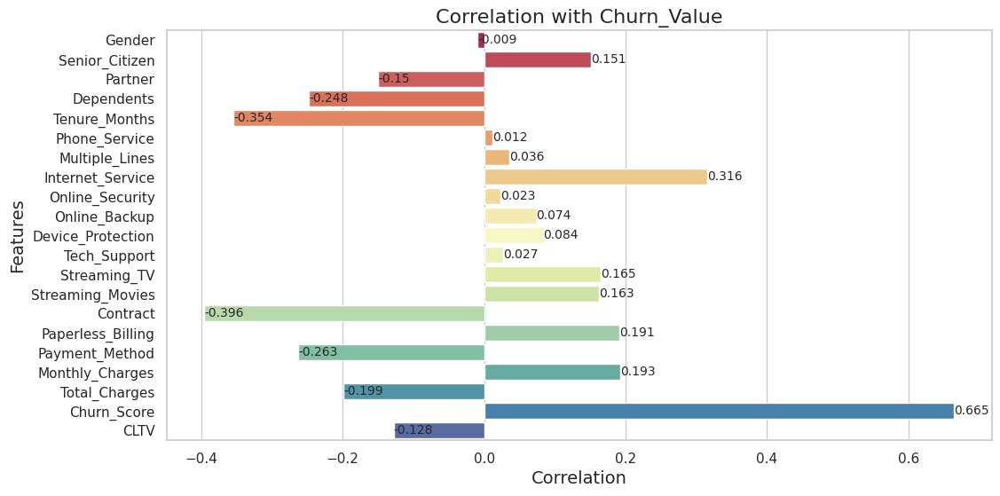

In [259]:
corr_matrix = df4_scaled.corr().round(3)
corr_target = corr_matrix['Churn_Value'].drop('Churn_Value')

fig, ax = plt.subplots(figsize=(12,6))

sns.barplot(x=corr_target.values, y=corr_target.index, ax=ax, palette="Spectral")

ax.set_title('Correlation with Churn_Value', fontsize=16)
ax.set_xlabel('Correlation', fontsize=14)
ax.set_ylabel('Features', fontsize=14)

# Add labels to the bars
for i, v in enumerate(corr_target.values):
    ax.text(v, i, str(v), ha='left', va='center', fontsize=10)

# ax.axis('tight')
# sns.despine(left=True)

plt.show()

## PCA

In [260]:
from sklearn.decomposition import PCA

pcs = PCA()
pcs.fit(df4_scaled)
pcsSummary_df = pd.DataFrame({'Standard deviation': np.sqrt(pcs.explained_variance_),
                           'Proportion of variance': pcs.explained_variance_ratio_,
                           'Cumulative proportion': np.cumsum(pcs.explained_variance_ratio_)})
pcsSummary_df = pcsSummary_df.transpose()
pcsSummary_df.columns = ['PC{}'.format(i) for i in range(1, len(pcsSummary_df.columns) + 1)]
pcsSummary_df.round(4)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22
Standard deviation,1.7397,1.2703,0.8111,0.727,0.5052,0.5002,0.4890,0.4363,0.4080,0.3959,...,0.3577,0.3487,0.3320,0.3199,0.2658,0.2099,0.1861,0.1579,0.0782,0.0378
Proportion of variance,0.3781,0.2016,0.0822,0.066,0.0319,0.0313,0.0299,0.0238,0.0208,0.0196,...,0.0160,0.0152,0.0138,0.0128,0.0088,0.0055,0.0043,0.0031,0.0008,0.0002
Cumulative proportion,0.3781,0.5797,0.6619,0.728,0.7599,0.7911,0.8210,0.8448,0.8656,0.8851,...,0.9355,0.9507,0.9645,0.9773,0.9861,0.9916,0.9959,0.9991,0.9998,1.0000


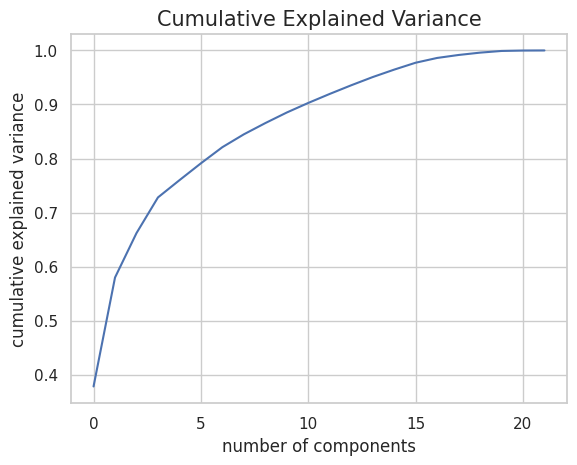

In [261]:
# Plot the number of components

plt.plot(np.cumsum(pcs.explained_variance_ratio_))
plt.xlabel('number of components', size=12)
plt.ylabel('cumulative explained variance', size=12)
plt.title('Cumulative Explained Variance', size=15)
plt.show()

In [262]:
pcsComponents_df = pd.DataFrame(pcs.components_.transpose(), columns=pcsSummary_df.columns,
                                index=df3.columns)
pcsComponents_df.iloc[:,:22]

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22
Gender,0.003261,-0.001838,0.005164,0.010520,0.042791,-0.996537,0.049279,-0.037609,0.012474,-0.022981,...,0.001951,-0.007219,-0.003918,-0.000413,0.003177,-0.009023,0.002651,0.002478,0.000078,0.001726
Senior_Citizen,-0.042812,-0.037762,-0.041059,-0.089440,-0.034667,-0.011817,-0.143528,-0.026478,0.265806,0.189246,...,0.316708,0.292798,0.008196,0.649587,0.061258,-0.070666,-0.033265,-0.002037,0.004970,0.000109
Partner,-0.023381,0.113543,0.217404,-0.072964,0.709606,0.016863,-0.319296,0.101929,0.203112,-0.134283,...,0.306744,0.032096,0.052384,-0.343580,0.114493,-0.087217,0.033368,-0.014591,0.005950,-0.000574
Dependents,0.037902,0.065311,0.125336,0.025024,0.534834,0.019016,-0.047969,0.025896,-0.219233,-0.053224,...,-0.430829,0.017413,-0.117671,0.581262,-0.073596,0.041667,-0.023450,0.011065,-0.000845,-0.002543
Tenure_Months,-0.042927,0.163476,0.211491,-0.069390,-0.005900,-0.009430,-0.053786,-0.066691,0.055631,0.115530,...,0.043207,-0.025115,0.009726,-0.048847,-0.435834,0.582368,-0.280931,0.063913,-0.513639,0.088834
Phone_Service,0.013516,-0.004801,0.016941,-0.303800,0.006343,0.006304,0.151044,0.007790,-0.057216,-0.049712,...,-0.017470,0.017435,0.004336,-0.033269,0.120805,-0.401348,-0.808485,0.048098,-0.132707,-0.161071
Multiple_Lines,-0.081185,0.039930,0.115105,-0.799576,0.012530,0.009959,0.328417,-0.002463,-0.117138,-0.076056,...,0.181358,-0.180277,-0.004060,0.100569,0.039511,0.083601,0.342586,-0.015195,-0.022125,-0.040505
Internet_Service,-0.380924,-0.115483,-0.156237,-0.278804,0.012110,-0.012592,-0.089925,0.051075,0.197551,0.027136,...,-0.530271,0.533974,-0.013477,-0.230598,-0.007715,0.034296,0.117249,-0.022600,-0.081136,-0.165024
Online_Security,-0.328313,0.086127,0.028031,0.210263,0.115756,0.047538,0.395493,-0.164268,0.082686,-0.443533,...,-0.175717,-0.311706,0.039929,0.042827,0.030386,-0.001019,-0.014988,0.000896,-0.001243,0.000225
Online_Backup,-0.360614,0.056900,0.005819,0.096885,0.125190,0.028741,0.201613,-0.386732,0.466943,0.475542,...,0.070816,-0.183198,-0.036033,0.017628,0.105230,-0.079311,0.001748,0.004399,-0.016965,-0.009207


In [263]:
!pip install plotly

In [264]:
import plotly.graph_objects as go

# Create a 2D scatter plot with the first 2 principal components
fig = go.Figure(data=go.Scatter(
    x=pcsComponents_df.iloc[:, 0],
    y=pcsComponents_df.iloc[:, 1],
    text=pcsComponents_df.index,
    mode='markers+text',
    marker=dict(
        size=10,
        color='blue',
        opacity=0.8
    )
))

# Update the layout
fig.update_layout(
    title='2D Scatter Plot of the First 2 Principal Components',
    xaxis=dict(title='PC1'),
    yaxis=dict(title='PC2'),xaxis_showgrid=False,
    yaxis_showgrid=False,
    xaxis_zeroline=False,
    yaxis_zeroline=False
)

# Increase the size of the figure
fig.update_layout(width=1000, height=600)



fig.show()

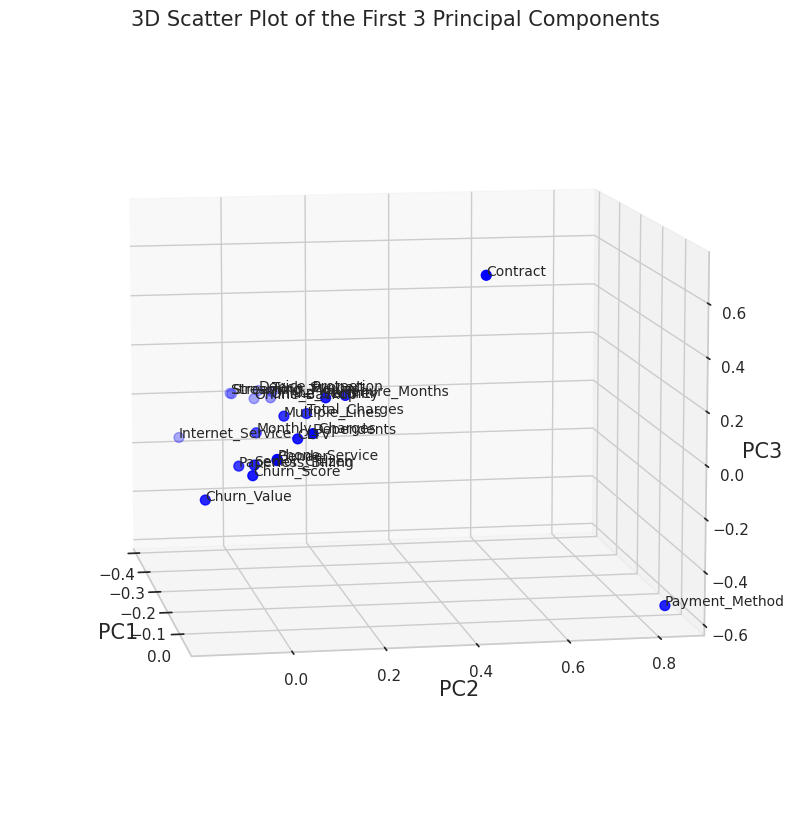

In [265]:
# Create a 3D plot from the above graph  with matplotlib and apply labels to the features


# Create a 3D scatter plot with the first 3 principal components
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pcsComponents_df.iloc[:, 0], pcsComponents_df.iloc[:, 1], pcsComponents_df.iloc[:, 2], s=50, c='blue', marker='o')

# Label the axes
ax.set_xlabel('PC1', fontsize=15)
ax.set_ylabel('PC2', fontsize=15)
ax.set_zlabel('PC3', fontsize=15)

# Label the features
for i, feature in enumerate(pcsComponents_df.index):
    ax.text(pcsComponents_df.iloc[i, 0], pcsComponents_df.iloc[i, 1], pcsComponents_df.iloc[i, 2], feature, fontsize=10)

plt.title('3D Scatter Plot of the First 3 Principal Components', fontsize=15)

# Show the plot
ax.view_init(elev=10, azim=-10)
plt.show()

## Machine Learning with PCA

In [266]:
df4_scaled.head()

,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,Multiple_Lines,Internet_Service,Online_Security,Online_Backup,...,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value,Churn_Score,CLTV
0,1,0,0,0,0.014085,1,0,0,1,1,...,0,0,0,1,1,0.354229,0.010310,1,0.852632,0.274850
1,0,0,0,1,0.014085,1,0,1,0,0,...,0,0,0,1,0,0.521891,0.015330,1,0.652632,0.155215
2,0,0,0,1,0.098592,1,1,1,0,0,...,1,1,0,1,0,0.809950,0.092511,1,0.852632,0.749166
3,0,0,1,1,0.380282,1,1,1,0,0,...,1,1,0,1,0,0.861194,0.349325,1,0.831579,0.667111
4,1,0,0,1,0.676056,1,1,1,0,1,...,1,1,0,1,2,0.850249,0.578987,1,0.884211,0.742050


In [267]:
X = df4_scaled.drop(columns=['Churn_Value'])
y = df4_scaled['Churn_Value']

In [268]:
print(X.shape)
print(y.shape)

(7032, 21)
(7032,)


In [269]:
# Perform PCA
pca = PCA(n_components=21)  # Choose number of components
X_pca = pca.fit_transform(X)

In [270]:
import numpy as np
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score,log_loss,precision_score,roc_auc_score,confusion_matrix
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [271]:

def run_model(model, X_train, y_train, X_test, y_test):

    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)
    pred_prob_test=model.predict_proba(X_test)

    #calculating precision and reall
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    print("Accuracy = {}".format(accuracy))
    print('Precision: ', precision)
    print('Recall: ', recall)
    print('F1 Score: ',f1)

    print("Accuracy = {}".format(accuracy))
    print("ROC Area under Curve = {}".format(roc_auc))
    print(classification_report(y_test,y_pred,digits=5))

    # Compute the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', square=True, cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

    #Plot ROC_AUC Curve
    # Predict probabilities on the test data
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Calculate the ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Calculate the AUC score
    roc_auc = auc(fpr, tpr)

    # Plot the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.show()

    return model, accuracy, precision, recall, f1, roc_auc

In [272]:
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.20, random_state=42, stratify= y, shuffle=True )

In [273]:
print("Shape of X_train is:", X_train.shape)
print("Shape of X_test is:", X_test.shape)
print("Shape of y_train is:", y_train.shape)
print("Shape of y_test is:", y_test.shape)

Shape of X_train is: (5625, 21)
Shape of X_test is: (1407, 21)
Shape of y_train is: (5625,)
Shape of y_test is: (1407,)


## Logistic Regression

Accuracy = 0.9175550817341862
Precision:  0.8359375
Recall:  0.8582887700534759
F1 Score:  0.8469656992084431
Accuracy = 0.9175550817341862
ROC Area under Curve = 0.8986506773791098
              precision    recall  f1-score   support

           0    0.94819   0.93901   0.94358      1033
           1    0.83594   0.85829   0.84697       374

    accuracy                        0.91756      1407
   macro avg    0.89206   0.89865   0.89527      1407
weighted avg    0.91835   0.91756   0.91790      1407



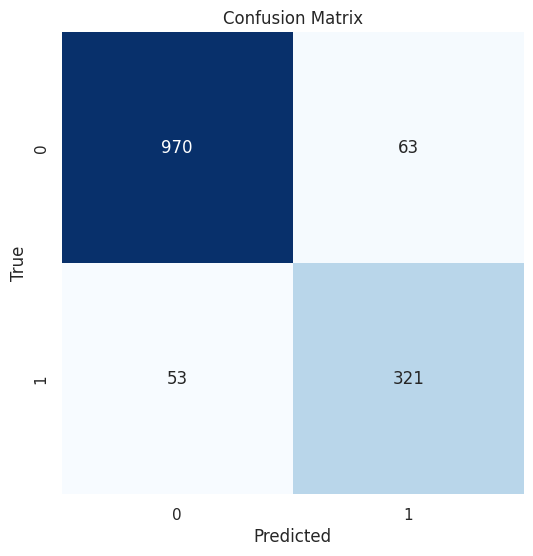

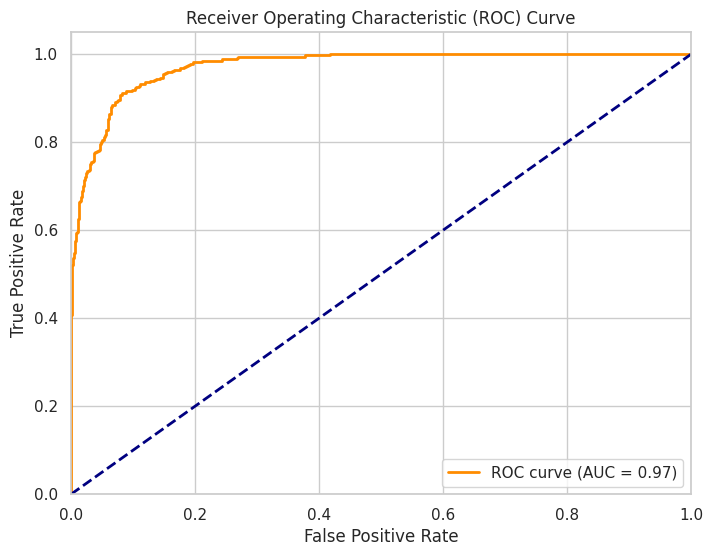

In [274]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import recall_score

params_lr = {"class_weight": None, "solver":'lbfgs', "max_iter":1000}

model_lr = LogisticRegression(**params_lr)
model_lr, accuracy_lr, precision_lr, recall_lr, f1_lr, roc_auc_lr = run_model(model_lr, X_train, y_train, X_test, y_test)

## Decision Tree

Accuracy = 0.8407960199004975
Precision:  0.676056338028169
Recall:  0.7700534759358288
F1 Score:  0.72
Accuracy = 0.8407960199004975
ROC Area under Curve = 0.818230997406443
              precision    recall  f1-score   support

           0    0.91233   0.86641   0.88878      1033
           1    0.67606   0.77005   0.72000       374

    accuracy                        0.84080      1407
   macro avg    0.79420   0.81823   0.80439      1407
weighted avg    0.84953   0.84080   0.84391      1407



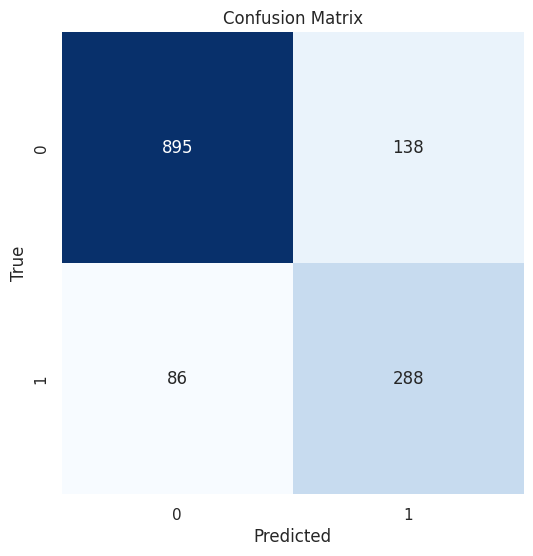

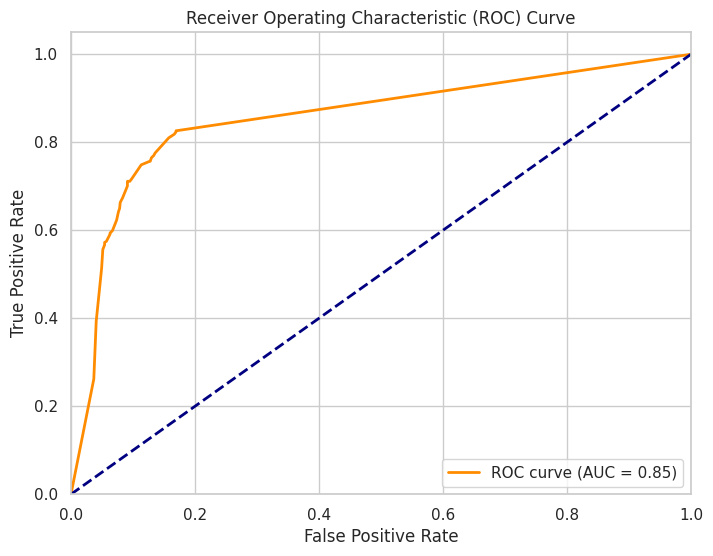

In [275]:
from sklearn.tree import DecisionTreeClassifier

params_dt = {'max_depth': 15,
             'min_samples_split': 10,
             'min_samples_leaf': 5,
             'criterion': 'gini',
             'class_weight': 'balanced',
             #'criterion': 'entropy',
             #'max_features': 'sqrt',
             'random_state': 42
}

model_dt = DecisionTreeClassifier(**params_dt)
model_dt, accuracy_dt, precision_dt, recall_dt, f1_dt, roc_auc_dt = run_model(model_dt, X_train, y_train, X_test, y_test)

In [276]:
!pip install dmba

Classes: 0, 1
Number of features used by the decision tree: 21


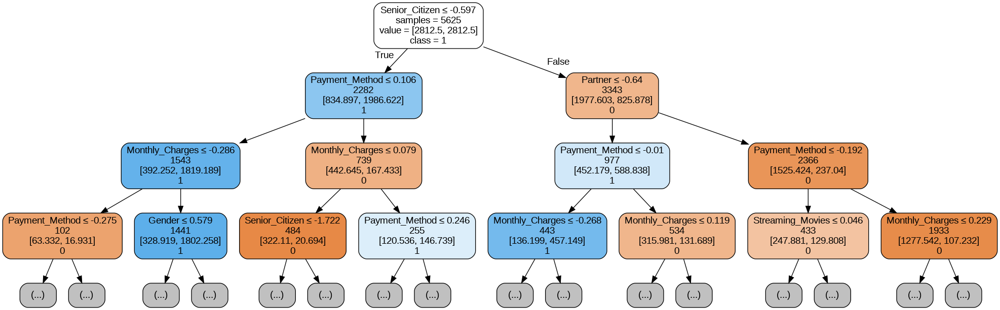

In [277]:
import numpy as np
from dmba import plotDecisionTree, classificationSummary, regressionSummary
from sklearn.tree import DecisionTreeClassifier
import graphviz

# Convert the string array to a float array
model_dt.classes_ = model_dt.classes_.astype(float)

# Apply the format specifier
model_dt.classes_ = np.char.mod('%d', model_dt.classes_)

# Print the classes learned by the decision tree classifier
print("Classes: {}".format(', '.join(model_dt.classes_)))

print("Number of features used by the decision tree:", model_dt.n_features_in_)

if X.shape[1] != model_dt.n_features_in_:
    raise ValueError("The number of features in the data does not match the number of features used by the decision tree.")

# Plot the decision tree
plotDecisionTree(model_dt, feature_names=X.columns, class_names=model_dt.classes_, max_depth=3)

## Random forest classifier

Accuracy = 0.9026297085998578
Precision:  0.8580060422960725
Recall:  0.7593582887700535
F1 Score:  0.8056737588652483
Accuracy = 0.9026297085998578
ROC Area under Curve = 0.8569298704256849
              precision    recall  f1-score   support

           0    0.91636   0.95450   0.93504      1033
           1    0.85801   0.75936   0.80567       374

    accuracy                        0.90263      1407
   macro avg    0.88718   0.85693   0.87036      1407
weighted avg    0.90085   0.90263   0.90065      1407



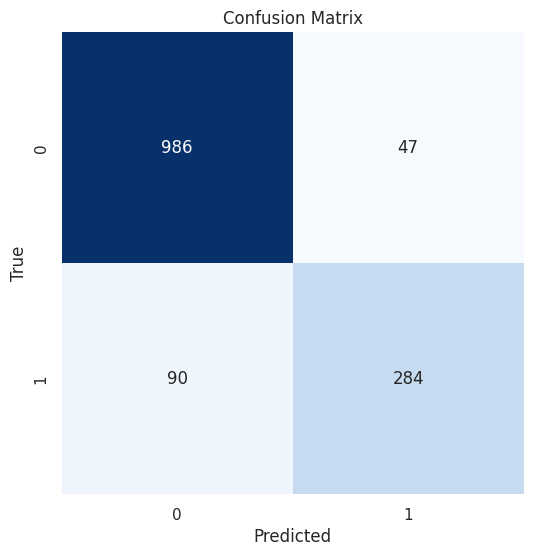

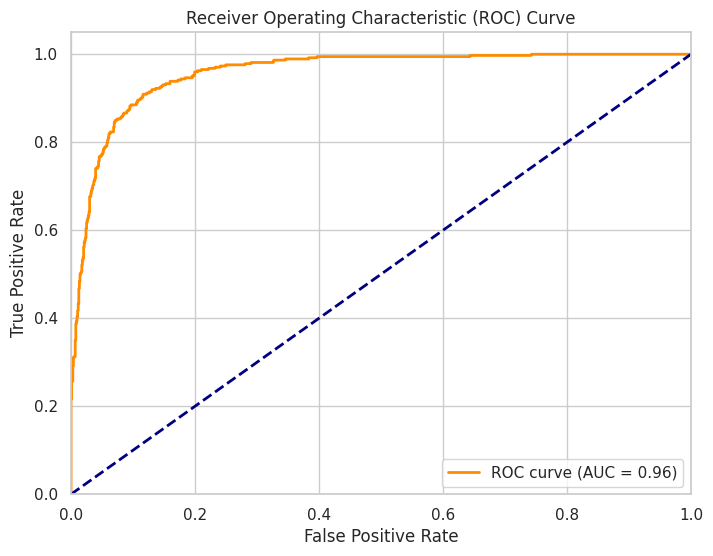

In [278]:
from sklearn.ensemble import RandomForestClassifier

params_rf = {'max_depth': 16,
             'min_samples_leaf': 1,
             'min_samples_split': 2,
             'n_estimators': 100,
             'random_state': 123}

model_rf = RandomForestClassifier(**params_rf)

model_rf, accuracy_rf, precision_rf, recall_rf, f1_rf, roc_auc_rf = run_model(model_rf, X_train, y_train, X_test, y_test)

## XGBoost

Accuracy = 0.9097370291400142
Precision:  0.8538681948424068
Recall:  0.7967914438502673
F1 Score:  0.8243430152143845
Accuracy = 0.9097370291400142
ROC Area under Curve = 0.8737103395437202
              precision    recall  f1-score   support

           0    0.92817   0.95063   0.93926      1033
           1    0.85387   0.79679   0.82434       374

    accuracy                        0.90974      1407
   macro avg    0.89102   0.87371   0.88180      1407
weighted avg    0.90842   0.90974   0.90872      1407



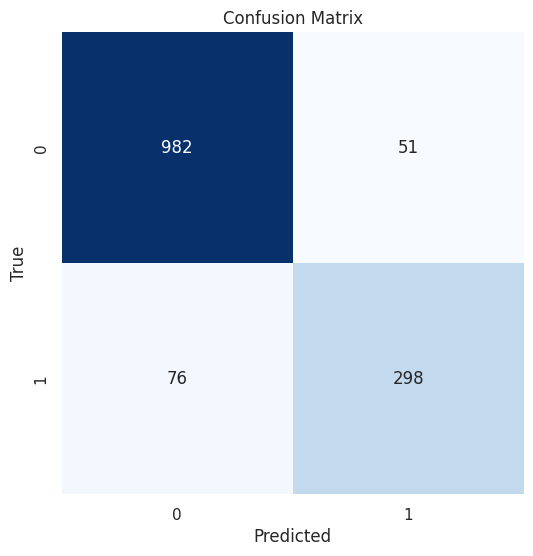

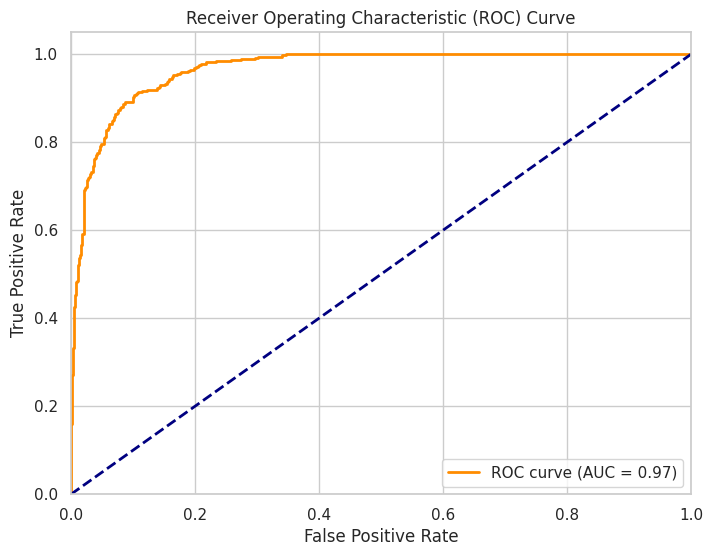

In [279]:
import xgboost as xgb

params_xgb ={'n_estimators': 100,
            'max_depth': 10,
            'learning_rate': 0.1,
            # 'objective': 'binary:logistic',
            # 'eval_metric': 'auc',
            #'random_state': 42
             }

model_xgb = xgb.XGBClassifier(**params_xgb)

model_xgb, accuracy_xgb, precision_xgb, recall_xgb, f1_xgb, roc_auc_xgb = run_model(model_xgb, X_train, y_train, X_test, y_test)

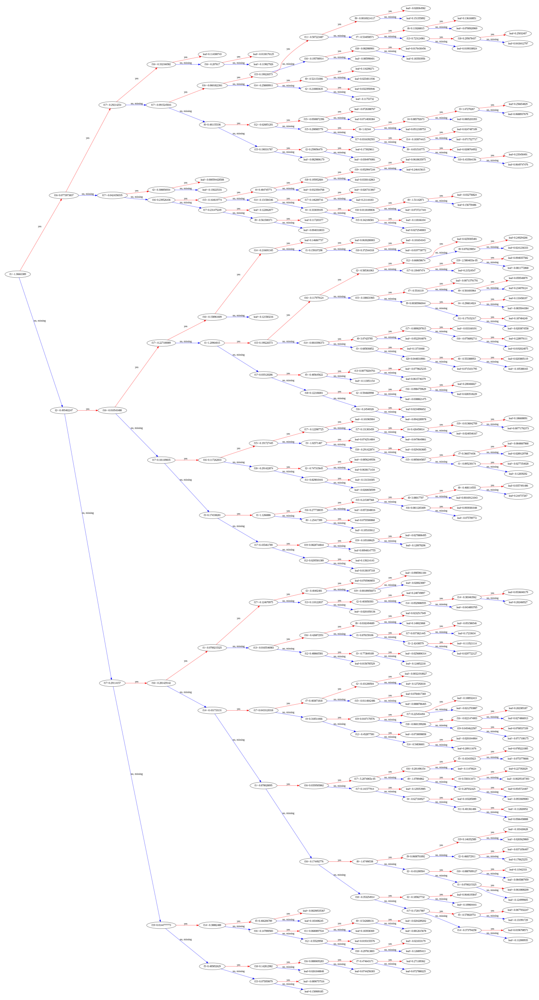

In [280]:
fig, ax = plt.subplots(figsize=(30, 30))
from xgboost import plot_tree
plot_tree(model_xgb,num_trees=1,rankdir="LR",ax=ax)
plt.show()

## KNN

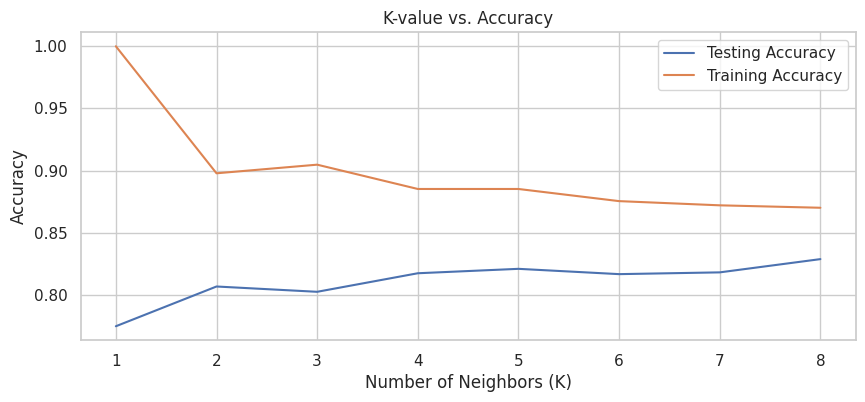

The best K neighbors is: 8


In [281]:
# Fit KNN model to the data by finding the optimal number of neighbors

from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
import numpy as np

# Create a list of possible number of neighbors
k_values = np.arange(1, 9)

# Create an empty list to store the scores
train_accuracy = []
test_accuracy = []

# Loop through the number of neighbors
for i in k_values:
  # Create a KNN classifier with the current number of neighbors
  knn = KNeighborsClassifier(n_neighbors=i)

  # Fit the classifier to the training data
  knn.fit(X_train, y_train)

  # Calculate the training and test accuracy
  train_accuracy.append(knn.score(X_train, y_train))
  test_accuracy.append(knn.score(X_test, y_test))



# Plot the training and testing accuracy for each K value
plt.figure(figsize=[10, 4])
plt.plot(k_values, test_accuracy, label="Testing Accuracy")
plt.plot(k_values, train_accuracy, label="Training Accuracy")
plt.legend()
plt.title('K-value vs. Accuracy')
plt.xlabel('Number of Neighbors (K)')
plt.ylabel('Accuracy')
plt.xticks(k_values)
plt.show()

# Find the K value with the highest testing accuracy
best_k = test_accuracy.index(max(test_accuracy)) + 1

print(f"The best K neighbors is: {best_k}")



Accuracy = 0.8287135749822317
Precision:  0.6985074626865672
Recall:  0.6256684491978609
F1 Score:  0.6600846262341326
Accuracy = 0.8287135749822317
ROC Area under Curve = 0.7639474869416216
              precision    recall  f1-score   support

           0    0.86940   0.90223   0.88551      1033
           1    0.69851   0.62567   0.66008       374

    accuracy                        0.82871      1407
   macro avg    0.78396   0.76395   0.77280      1407
weighted avg    0.82398   0.82871   0.82559      1407



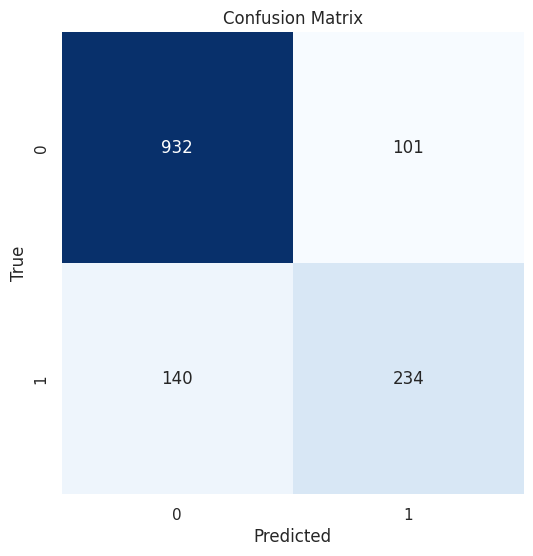

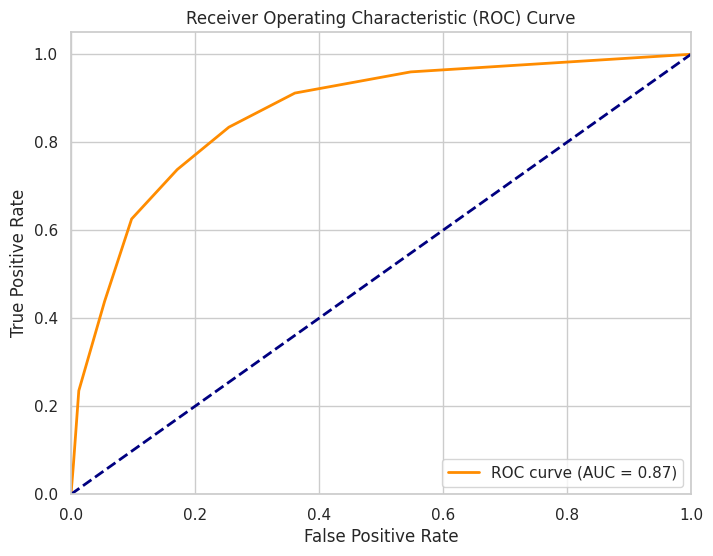

In [282]:

params_knn = {'n_neighbors': 8,
             'metric': 'euclidean',
             'leaf_size': 30,
             'p': 1,
             'algorithm': 'auto',
             'weights': 'uniform'}

model_knn = KNeighborsClassifier(**params_knn)

model_knn, accuracy_knn, precision_knn, recall_knn, f1_knn, roc_auc_knn = run_model(model_knn, X_train, y_train, X_test, y_test)


## ADA Boost

Accuracy = 0.9182658137882018
Precision:  0.8471849865951743
Recall:  0.8449197860962567
F1 Score:  0.8460508701472558
Accuracy = 0.9182658137882018
ROC Area under Curve = 0.8948703480336075
              precision    recall  f1-score   support

           0    0.94391   0.94482   0.94436      1033
           1    0.84718   0.84492   0.84605       374

    accuracy                        0.91827      1407
   macro avg    0.89555   0.89487   0.89521      1407
weighted avg    0.91820   0.91827   0.91823      1407



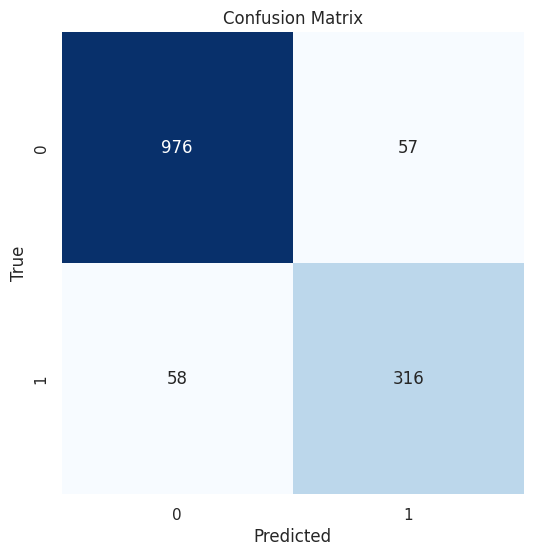

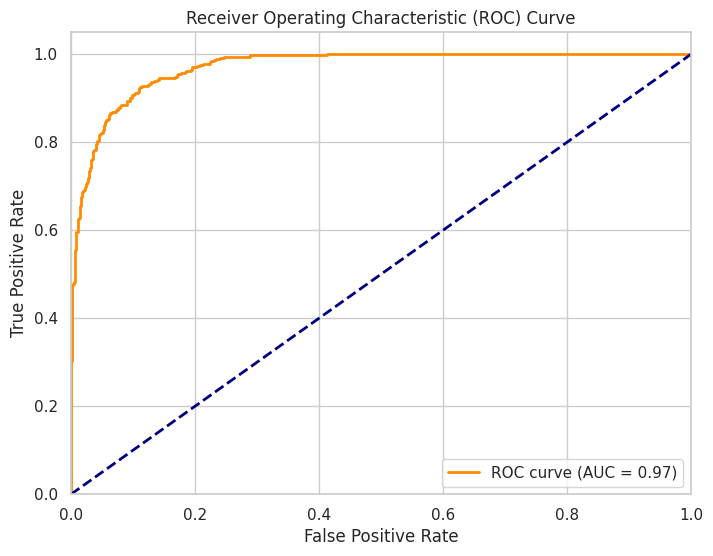

In [283]:
# Fit the above code to ADA Boost model

params_ada = {'n_estimators': 100,
             'learning_rate': 1.0,
             'random_state': 0}

model_ada = AdaBoostClassifier(**params_ada)

model_ada, accuracy_ada, precision_ada, recall_ada, f1_ada, roc_auc_ada = run_model(model_ada, X_train, y_train, X_test, y_test)


In [284]:

!pip3 install catboost

## CATBOOST

0:	total: 20.2ms	remaining: 2s
1:	total: 39.9ms	remaining: 1.96s
2:	total: 59.3ms	remaining: 1.92s
3:	total: 78.5ms	remaining: 1.88s
4:	total: 97.4ms	remaining: 1.85s
5:	total: 117ms	remaining: 1.82s
6:	total: 136ms	remaining: 1.81s
7:	total: 155ms	remaining: 1.78s
8:	total: 175ms	remaining: 1.76s
9:	total: 194ms	remaining: 1.74s
10:	total: 213ms	remaining: 1.72s
11:	total: 233ms	remaining: 1.71s
12:	total: 252ms	remaining: 1.68s
13:	total: 271ms	remaining: 1.66s
14:	total: 290ms	remaining: 1.65s
15:	total: 310ms	remaining: 1.63s
16:	total: 329ms	remaining: 1.61s
17:	total: 349ms	remaining: 1.59s
18:	total: 372ms	remaining: 1.59s
19:	total: 393ms	remaining: 1.57s
20:	total: 413ms	remaining: 1.55s
21:	total: 433ms	remaining: 1.53s
22:	total: 453ms	remaining: 1.52s
23:	total: 472ms	remaining: 1.5s
24:	total: 492ms	remaining: 1.48s
25:	total: 511ms	remaining: 1.45s
26:	total: 534ms	remaining: 1.44s
27:	total: 553ms	remaining: 1.42s
28:	total: 572ms	remaining: 1.4s
29:	total: 594ms	remaini

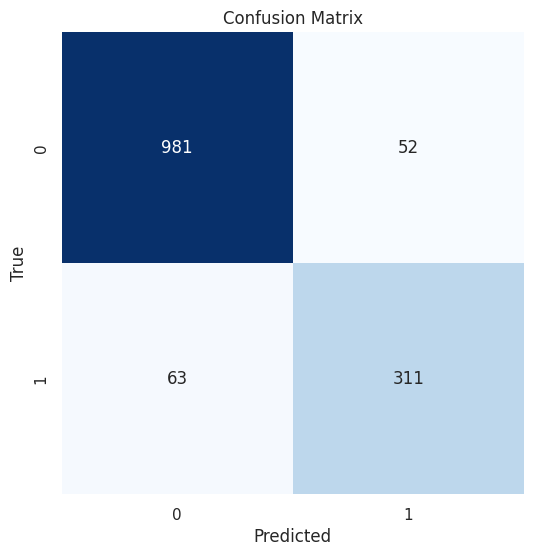

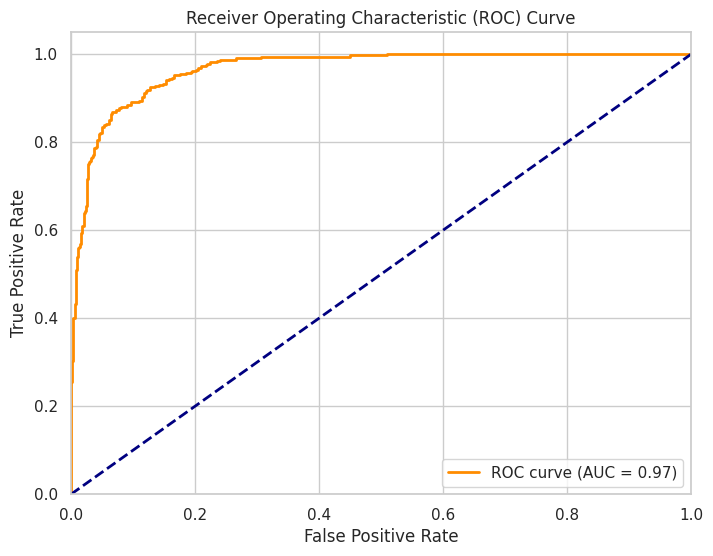

In [285]:
import catboost as cb
from catboost import CatBoostClassifier, Pool, cv


params_cb = {'n_estimators': 100,
             'learning_rate': 0.1,
             'depth': 10,
             'loss_function': 'Logloss',
             'eval_metric': 'AUC',
             'custom_metric': ['Logloss', 'AUC', 'Accuracy'],
             'random_seed': 42}

model_cb = CatBoostClassifier(**params_cb)

model_cb, accuracy_cb, precision_cb, recall_cb, f1_cb, roc_auc_cb = run_model(model_cb, X_train, y_train, X_test, y_test)


##  Model Comparison

In [286]:
accuracy_scores = [accuracy_lr, accuracy_dt, accuracy_rf, accuracy_xgb, accuracy_knn, accuracy_ada, accuracy_cb]

model_data = {'Model': ['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', "KNN", "ADABOOST", "CATBOOST"],
              'Accuracy': accuracy_scores}


plot_data = pd.DataFrame(model_data)


plot_data['Accuracy Score'] = plot_data['Accuracy'] * 100
plot_data = plot_data.sort_values(by='Accuracy Score', ascending=False)
plot_data

,Model,Accuracy,Accuracy Score
5,ADABOOST,0.918266,91.826581
6,CATBOOST,0.918266,91.826581
0,Logistic Regression,0.917555,91.755508
3,XGBoost,0.909737,90.973703
2,Random Forest,0.902630,90.262971
1,Decision Tree,0.840796,84.079602
4,KNN,0.828714,82.871357


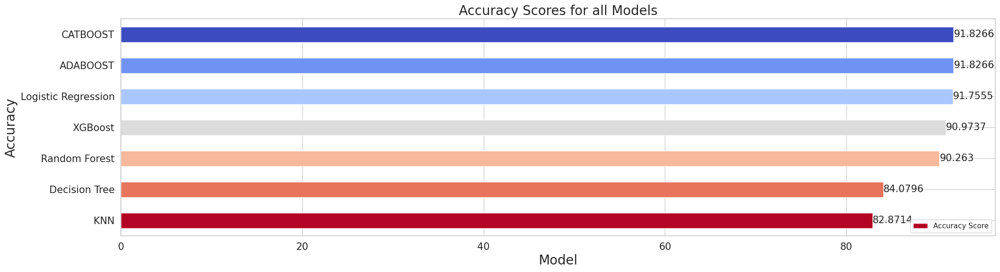

In [287]:
ax = plot_data.sort_values(by="Accuracy Score", ascending = True).plot( x= "Model", y="Accuracy Score", kind='barh', figsize=(24,6), fontsize=15, color=plt.cm.coolwarm(np.linspace(1, 0, len(plot_data.Model))))
ax.bar_label(ax.containers[0], fontsize=15)
plt.xlabel("Model", fontsize=20)
plt.ylabel("Accuracy", fontsize=20)
plt.title("Accuracy Scores for all Models", fontsize=20)
plt.show()

## ROC AUC Scores

In [288]:
rocauc_scores = [roc_auc_lr , roc_auc_dt, roc_auc_rf, roc_auc_xgb, roc_auc_knn , roc_auc_ada,  roc_auc_cb]

precision_scores = [precision_lr,precision_dt,precision_rf,precision_xgb, precision_knn, precision_ada, precision_cb]

recall_scores = [recall_lr,recall_dt,recall_rf,recall_xgb,recall_knn, recall_ada, recall_cb ]

f1_scores = [f1_lr, f1_dt,f1_rf, f1_xgb, f1_knn, f1_ada, f1_cb]

Model = ['Logistic Regression','Decision Tree','Random Forest','XGBoost', "KNN", "ADA BOOST","CATBOOST"]

comp = pd.DataFrame(list(zip( Model, precision_scores, recall_scores, f1_scores, rocauc_scores)), columns =["MODEL", "PRECISION", "RECALL", "F1_SCORE", "ROC_AUC"])

# setting first name as index column
comp.set_index("MODEL", inplace = True)

comp = comp.sort_values(by="ROC_AUC", ascending=True)

#comp.style.background_gradient(cmap='YlGnBu')

comp.style.background_gradient(cmap='Set2_r')

,PRECISION,RECALL,F1_SCORE,ROC_AUC
MODEL,,,,
Decision Tree,0.676056,0.770053,0.720000,0.854341
KNN,0.698507,0.625668,0.660085,0.865078
Random Forest,0.858006,0.759358,0.805674,0.957513
XGBoost,0.853868,0.796791,0.824343,0.965888
CATBOOST,0.856749,0.831551,0.843962,0.966343
ADA BOOST,0.847185,0.844920,0.846051,0.970622
Logistic Regression,0.835938,0.858289,0.846966,0.972278


## Plot


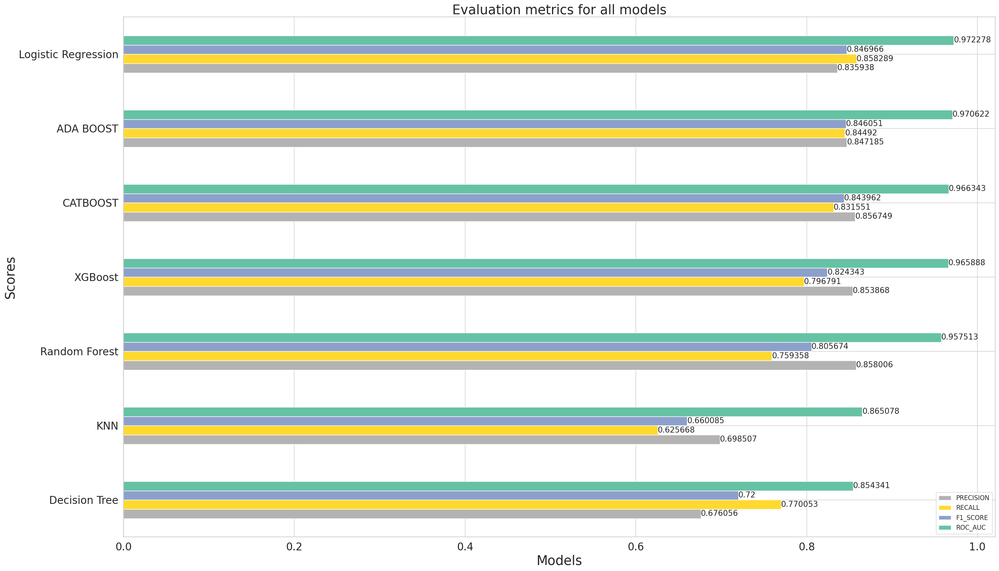

In [289]:
comp = comp.sort_values(by="ROC_AUC", ascending=True)

comp

## Plot

ax = comp.plot(kind="barh", figsize=(30,18), cmap="Set2_r")
ax.bar_label(ax.containers[0], fontsize=15)
ax.bar_label(ax.containers[1], fontsize=15)
ax.bar_label(ax.containers[2], fontsize=15)
ax.bar_label(ax.containers[3], fontsize=15)
plt.legend(fontsize =12)
plt.xlabel("Models", fontsize =25)
plt.ylabel("Scores", fontsize=25)
plt.xticks(fontsize =20)
plt.yticks(fontsize =20)
plt.title("Evaluation metrics for all models", fontsize = 25)
plt.show()

## Best Model: Logistic Regression

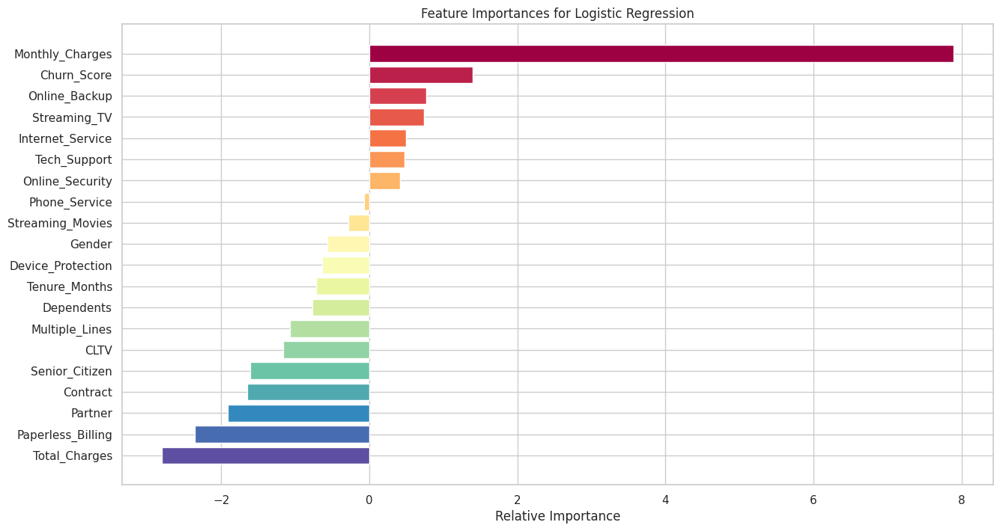

In [290]:
importances = model_lr.coef_[0]
indices = np.argsort(importances)[1::]
features = X.columns

plt.figure(figsize=(15, 8))
plt.title('Feature Importances for Logistic Regression')
plt.barh(range(len(indices)), importances[indices], align='center', color=plt.cm.Spectral(np.linspace(1, 0, len(indices))))
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

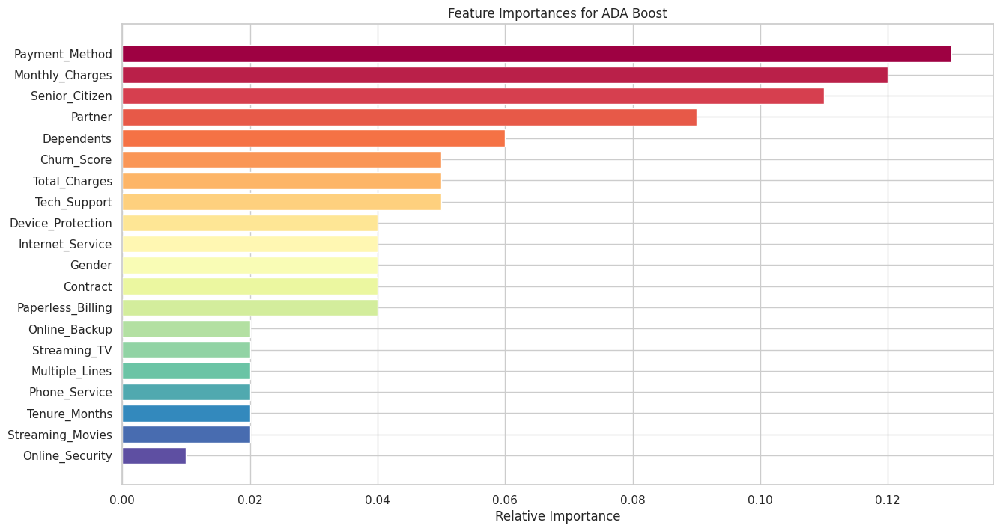

In [291]:
# Plot the feature importances for adaboost

importances = model_ada.feature_importances_
indices = np.argsort(importances)[1::]
features = X.columns

plt.figure(figsize=(15, 8))
plt.title('Feature Importances for ADA Boost')
plt.barh(range(len(indices)), importances[indices], align='center', color=plt.cm.Spectral(np.linspace(1, 0, len(indices))))
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

## Model testing for Logistic Regression

In [292]:
# Test a sample data on logistic regression model

# Create a sample data point
sample_data = X.iloc[10]

# Make a prediction on the sample data
prediction = model_lr.predict([sample_data])

# Print the prediction
print(f"Prediction for the sample data: {prediction}")

# Compare with the orginal value of the churn value from y

actual_value = y.iloc[10]
print(f"Actual label of the churn value: {actual_value}")


Prediction for the sample data: [0]
Actual label of the churn value: 1


## Model Testing for ADA Boost

In [293]:
# Test the model for ADA Boost model

# Test a sample data on ADA Boost model

# Create a sample data point
sample_data = X.iloc[10]

# Make a prediction on the sample data
prediction = model_ada.predict([sample_data])

# Print the prediction
print(f"Prediction for the sample data: {prediction}")

# Compare with the orginal value of the churn value from y

actual_value = y.iloc[10]
print(f"Actual label of the churn value: {actual_value}")


Prediction for the sample data: [0]
Actual label of the churn value: 1


## K-Fold Cross Validation

In [294]:
# Customize the above function for k-fold cross validation

from sklearn.model_selection import KFold

def run_model_kfold(model, X, y, kfolds=5):
    cv_accuracies = []
    cv_precisions = []
    cv_recalls = []
    cv_f1s = []
    cv_roc_aucs = []
    kf = KFold(n_splits=kfolds, shuffle=True)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred)
        pred_prob_test = model.predict_proba(X_test)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        cv_accuracies.append(accuracy)
        cv_precisions.append(precision)
        cv_recalls.append(recall)
        cv_f1s.append(f1)
        cv_roc_aucs.append(roc_auc)

    print("Average Accuracy:", sum(cv_accuracies) / len(cv_accuracies))
    print("Average Precision:", sum(cv_precisions) / len(cv_precisions))
    print("Average Recall:", sum(cv_recalls) / len(cv_recalls))
    print("Average F1 Score:", sum(cv_f1s) / len(cv_f1s))
    print("Average ROC AUC Score:", sum(cv_roc_aucs) / len(cv_roc_aucs))
    print(classification_report(y_test, y_pred, digits=5))

    # Compute the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', square=True, cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

    #Plot ROC_AUC Curve
    # Predict probabilities on the test data
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Calculate the ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Calculate the AUC score
    roc_auc = auc(fpr, tpr)

    # Plot the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.show()

    return model, cv_accuracies, cv_precisions, cv_recalls, cv_f1s, cv_roc_aucs


Average Accuracy: 0.9200813651717029
Average Precision: 0.8531431334332475
Average Recall: 0.8452518628531699
Average F1 Score: 0.8489826756987184
Average ROC AUC Score: 0.896180018515477
              precision    recall  f1-score   support

           0    0.95276   0.94072   0.94670      1029
           1    0.84359   0.87268   0.85789       377

    accuracy                        0.92248      1406
   macro avg    0.89817   0.90670   0.90229      1406
weighted avg    0.92348   0.92248   0.92289      1406



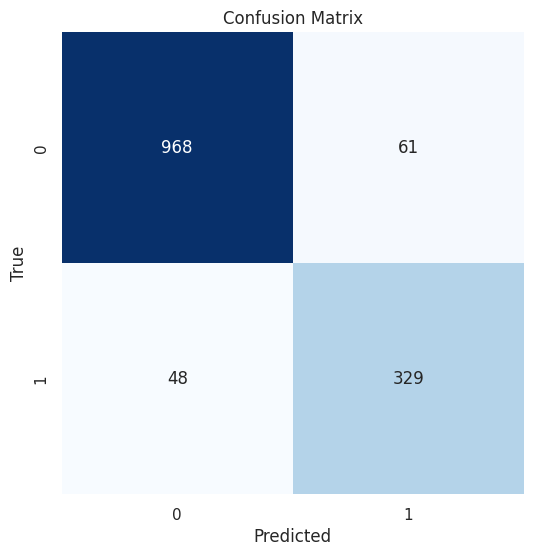

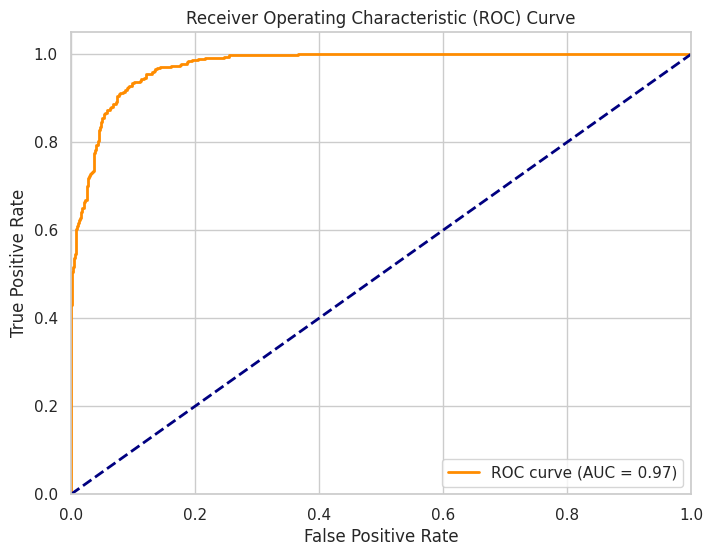

In [295]:
# Fit the above function for logistic regression
params_lr_k = {"class_weight": None, "solver":'lbfgs', "max_iter":1000}
model_lr_kfold = LogisticRegression(**params_lr_k)
model_lr_kfold, cv_accuracies_lr, cv_precisions_lr, cv_recalls_lr, cv_f1s_lr, cv_roc_aucs_lr = run_model_kfold(model_lr, X, y)

Average Accuracy: 0.9131097206509619
Average Precision: 0.7880127182772881
Average Recall: 0.9215040786011051
Average F1 Score: 0.8494762826168267
Average ROC AUC Score: 0.9157946525099259
              precision    recall  f1-score   support

           0    0.97692   0.90652   0.94040      1027
           1    0.78808   0.94195   0.85817       379

    accuracy                        0.91607      1406
   macro avg    0.88250   0.92424   0.89929      1406
weighted avg    0.92601   0.91607   0.91824      1406



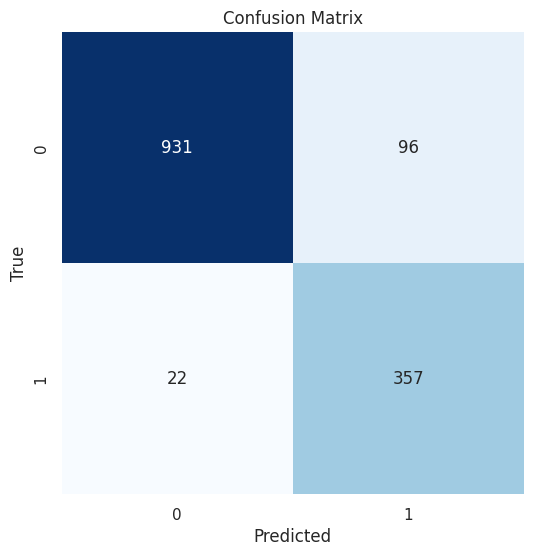

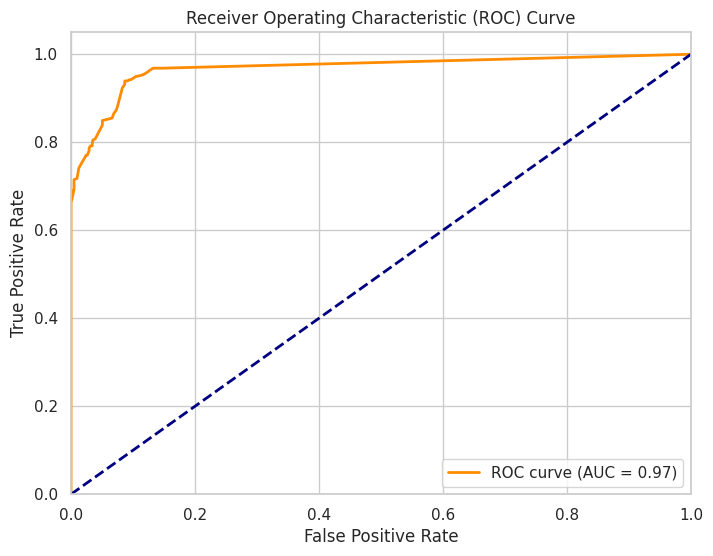

In [296]:
# Fit a decision tree model to the kfold function

# Fit the above function for decision tree
params_dt_k = {'max_depth': 10,
             'min_samples_split': 10,
             'min_samples_leaf': 5,
             'criterion': 'gini',
             'class_weight': 'balanced',
             #'criterion': 'entropy',
             #'max_features': 'sqrt',
             'random_state': 42
}
model_dt_kfold = DecisionTreeClassifier(**params_dt_k)
model_dt_kfold, cv_accuracies_dt, cv_precisions_dt, cv_recalls_dt, cv_f1s_dt, cv_roc_aucs_dt = run_model_kfold(model_dt_kfold, X, y)


Average Accuracy: 0.9279018441626453
Average Precision: 0.8257426304030389
Average Recall: 0.9234692078887893
Average F1 Score: 0.8717465956593948
Average ROC AUC Score: 0.9264663172445019
              precision    recall  f1-score   support

           0    0.97465   0.92850   0.95101      1035
           1    0.82381   0.93261   0.87484       371

    accuracy                        0.92959      1406
   macro avg    0.89923   0.93056   0.91293      1406
weighted avg    0.93484   0.92959   0.93091      1406



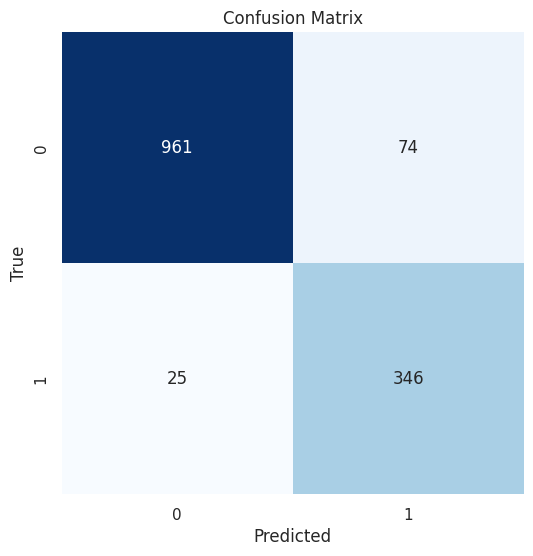

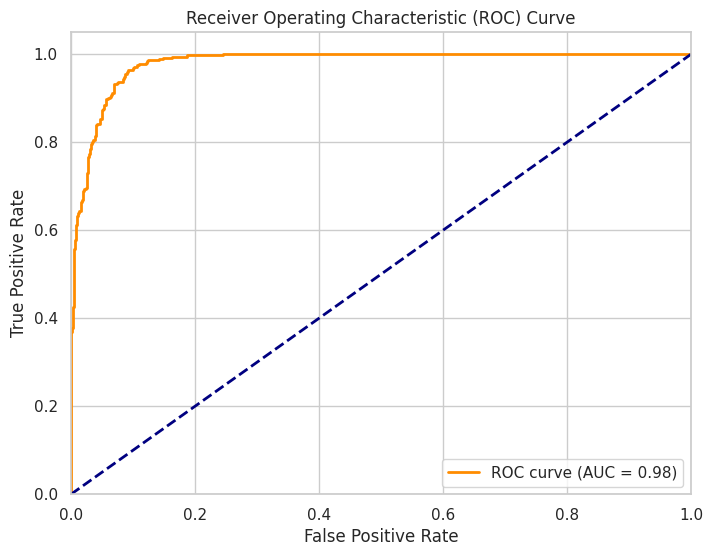

In [297]:
# Fit a random forest model to the kfold function

# Fit the above function for random forest
params_rf_kfold = {'max_depth': 10,
             'class_weight': 'balanced',
             'min_samples_leaf': 1,
             'min_samples_split': 2,
             'n_estimators': 100,
             'random_state': 123}

model_rf_kfold = RandomForestClassifier(**params_rf_kfold)

model_rf_kfold, cv_accuracies_rf, cv_precisions_rf, cv_recalls_rf, cv_f1s_rf, cv_roc_aucs_rf = run_model_kfold(model_rf_kfold, X, y)

Average Accuracy: 0.831769520614768
Average Precision: 0.7177302986070904
Average Recall: 0.60692478207731
Average F1 Score: 0.6560743730082697
Average ROC AUC Score: 0.7602692370806836
              precision    recall  f1-score   support

           0    0.89714   0.90664   0.90187      1039
           1    0.72753   0.70572   0.71646       367

    accuracy                        0.85420      1406
   macro avg    0.81234   0.80618   0.80916      1406
weighted avg    0.85287   0.85420   0.85347      1406



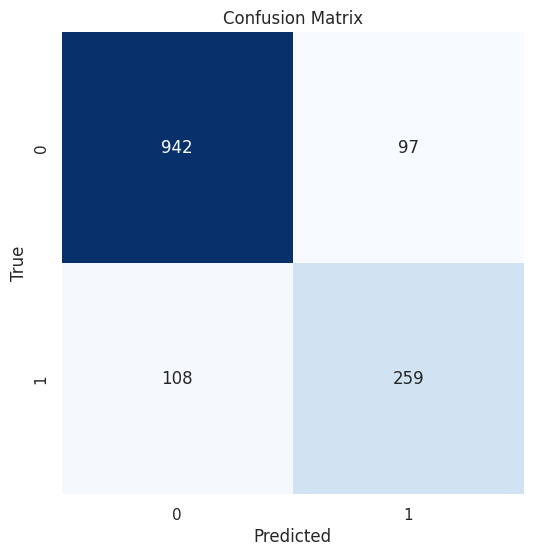

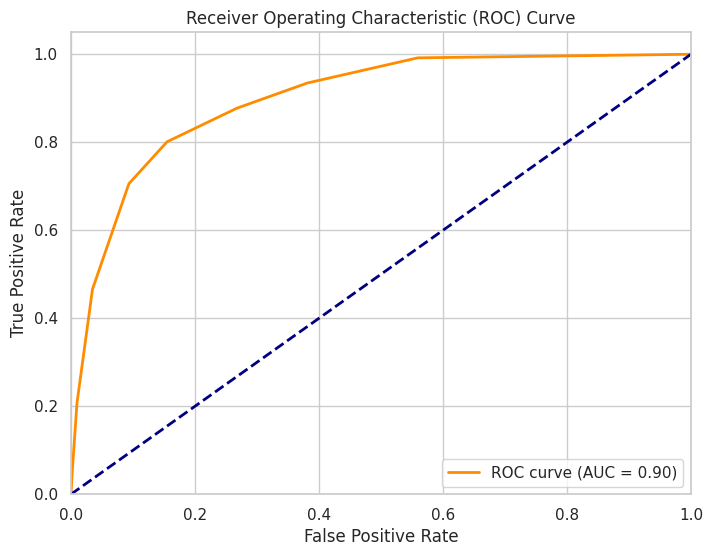

In [298]:
# Fit a KNN model to the kfold function

# Fit the above function for KNN

params_knn_kfold = {'n_neighbors': 8,
             'metric': 'euclidean',
             'leaf_size': 30,
             'p': 1,
             'algorithm': 'auto',
             'weights': 'uniform'}

model_knn_kfold = KNeighborsClassifier(**params_knn_kfold)

model_knn_kfold, cv_accuracies_knn, cv_precisions_knn, cv_recalls_knn, cv_f1s_knn, cv_roc_aucs_knn = run_model_kfold(model_knn_kfold, X, y)


Average Accuracy: 0.924490229203505
Average Precision: 0.8632747980404055
Average Recall: 0.8498723667242027
Average F1 Score: 0.8564401063874303
Average ROC AUC Score: 0.9006582391559054
              precision    recall  f1-score   support

           0    0.94214   0.95972   0.95085      1018
           1    0.88889   0.84536   0.86658       388

    accuracy                        0.92817      1406
   macro avg    0.91551   0.90254   0.90872      1406
weighted avg    0.92745   0.92817   0.92760      1406



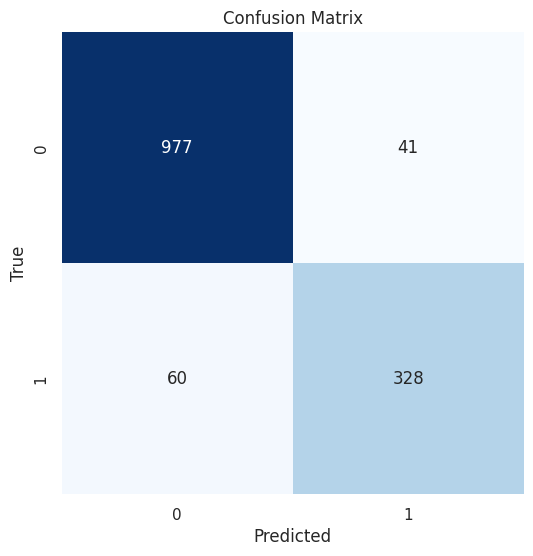

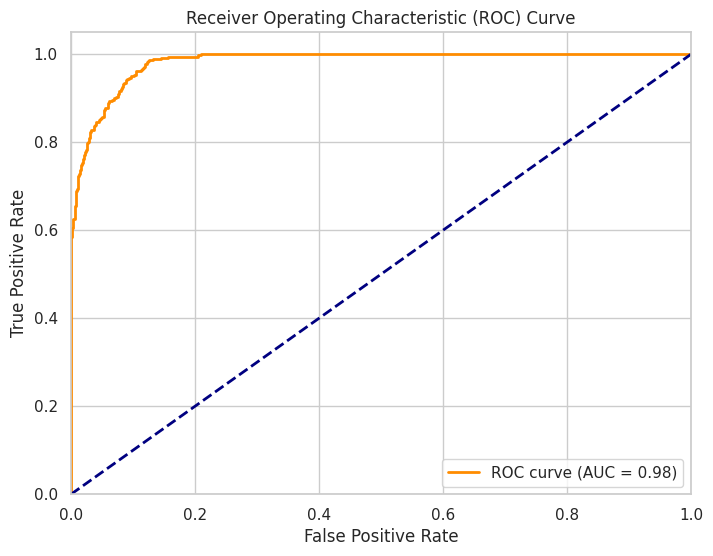

In [299]:
# Fit a xgboost model to the kfold function

# Fit the above function for XGBoost
params_xgb_kfold = {'n_estimators': 100,
            'max_depth': 10,
            'learning_rate': 0.1,
            'objective': 'binary:logistic',
            'eval_metric': 'auc',
            'random_state': 42
             }

model_xgb_kfold = xgb.XGBClassifier(**params_xgb_kfold)
model_xgb_kfold, cv_accuracies_xgb, cv_precisions_xgb, cv_recalls_xgb, cv_f1s_xgb, cv_roc_aucs_xgb = run_model_kfold(model_xgb_kfold, X, y)


Average Accuracy: 0.9261937619361028
Average Precision: 0.8615743316975791
Average Recall: 0.8607285942321482
Average F1 Score: 0.8610773509053061
Average ROC AUC Score: 0.9052639087195665
              precision    recall  f1-score   support

           0    0.95120   0.94089   0.94601      1015
           1    0.85075   0.87468   0.86255       391

    accuracy                        0.92248      1406
   macro avg    0.90097   0.90778   0.90428      1406
weighted avg    0.92326   0.92248   0.92280      1406



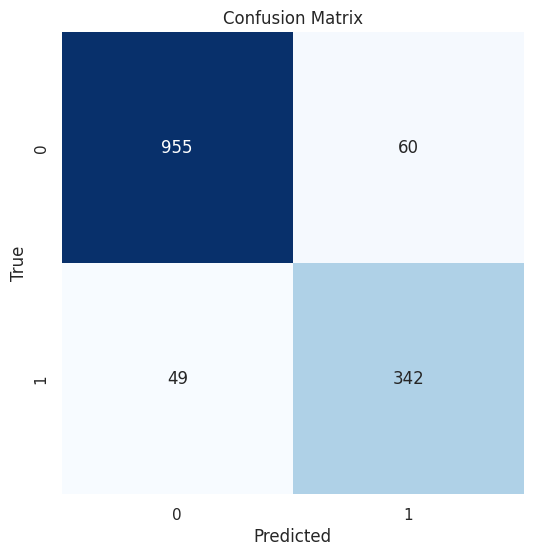

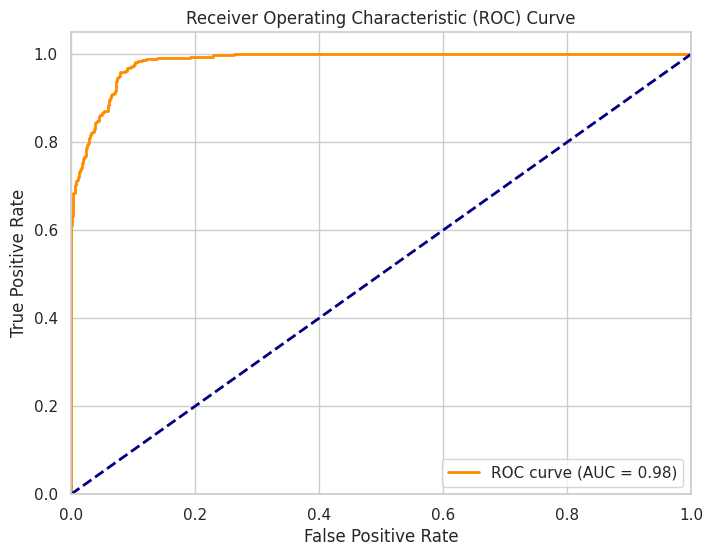

In [300]:
# Fit a ada boost model to the kfold  function


params_ada_kfold = {'n_estimators': 100,
             'learning_rate': 1.0,
             'random_state': 123}

model_ada_kfold = AdaBoostClassifier(**params_ada_kfold)
model_ada_kfold, cv_accuracies_ada, cv_precisions_ada, cv_recalls_ada, cv_f1s_ada, cv_roc_aucs_ada = run_model_kfold(model_ada_kfold, X, y)


0:	total: 4.19ms	remaining: 415ms
1:	total: 12.8ms	remaining: 627ms
2:	total: 21.1ms	remaining: 684ms
3:	total: 30.1ms	remaining: 723ms
4:	total: 33.6ms	remaining: 638ms
5:	total: 41.9ms	remaining: 657ms
6:	total: 50.5ms	remaining: 671ms
7:	total: 61.4ms	remaining: 707ms
8:	total: 70.1ms	remaining: 709ms
9:	total: 79.1ms	remaining: 712ms
10:	total: 88.3ms	remaining: 715ms
11:	total: 97.1ms	remaining: 712ms
12:	total: 106ms	remaining: 711ms
13:	total: 115ms	remaining: 705ms
14:	total: 123ms	remaining: 699ms
15:	total: 132ms	remaining: 694ms
16:	total: 136ms	remaining: 666ms
17:	total: 145ms	remaining: 661ms
18:	total: 154ms	remaining: 656ms
19:	total: 163ms	remaining: 650ms
20:	total: 172ms	remaining: 646ms
21:	total: 181ms	remaining: 640ms
22:	total: 192ms	remaining: 642ms
23:	total: 201ms	remaining: 637ms
24:	total: 210ms	remaining: 631ms
25:	total: 219ms	remaining: 623ms
26:	total: 228ms	remaining: 617ms
27:	total: 237ms	remaining: 610ms
28:	total: 247ms	remaining: 604ms
29:	total: 2

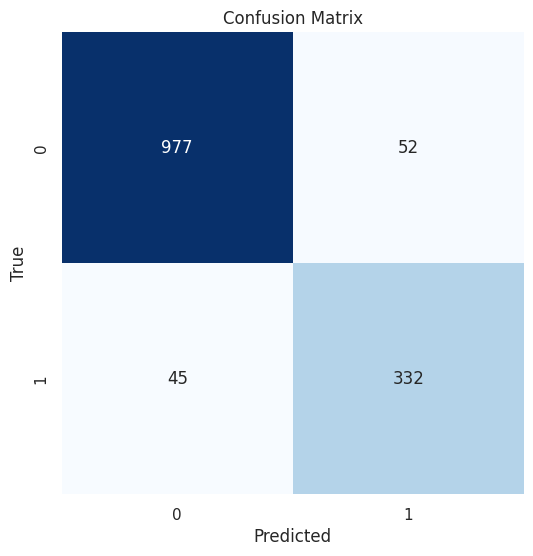

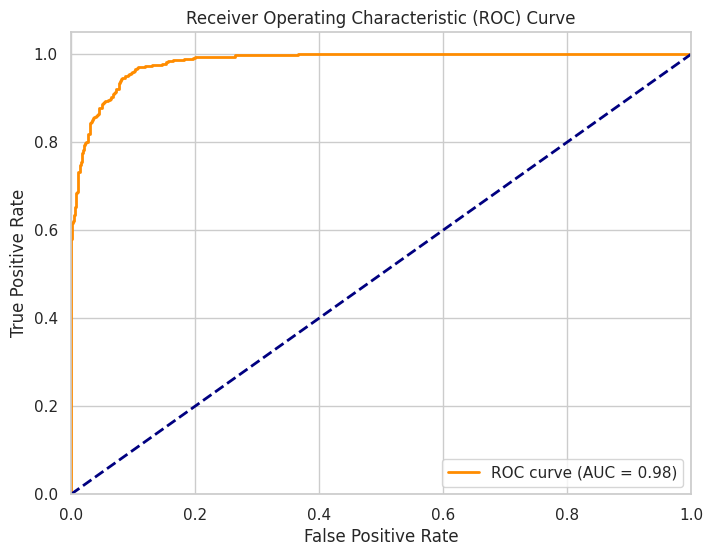

In [301]:
# Fit  catboost model to the kfold  function

# Fit the above function for catboost

params_cb_kfold = {'n_estimators': 100,
             'learning_rate': 0.1,
             'depth': 10,
             'loss_function': 'Logloss',
             'eval_metric': 'AUC',
             'custom_metric': ['Logloss', 'AUC', 'Accuracy'],
             'random_seed': 42}

model_cb_kfold = CatBoostClassifier(**params_cb_kfold)
model_cb_kfold, cv_accuracies_cb, cv_precisions_cb, cv_recalls_cb, cv_f1s_cb, cv_roc_aucs_cb = run_model_kfold(model_cb_kfold, X, y)


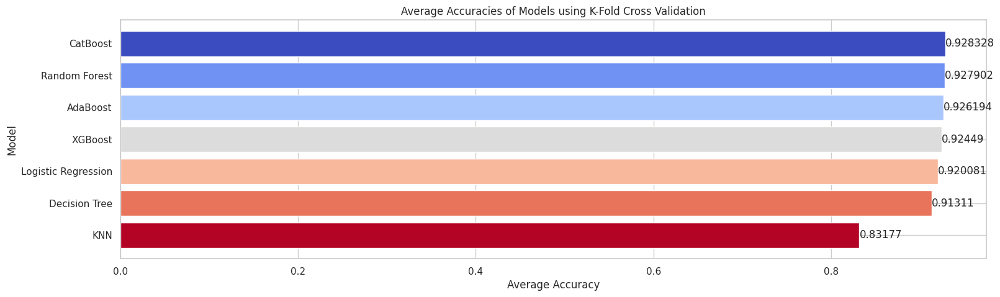

In [302]:
# Order the bars from highest to lowest value

kfold_accuracies = [np.mean(cv_accuracies_lr), np.mean(cv_accuracies_dt), np.mean(cv_accuracies_rf), np.mean(cv_accuracies_xgb), np.mean(cv_accuracies_knn), np.mean(cv_accuracies_ada), np.mean(cv_accuracies_cb)]
model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', 'KNN', 'AdaBoost', 'CatBoost']

data = {'Model': model_names, 'Accuracy': kfold_accuracies}
data = pd.DataFrame(data)

data = data.sort_values(by='Accuracy', ascending=True)
model_names = data['Model'].to_list()
kfold_accuracies = data['Accuracy'].to_list()

plt.figure(figsize=(18, 5))
plt.barh(model_names, kfold_accuracies, align='center', color=plt.cm.coolwarm(np.linspace(1, 0, len(model_names))))
plt.xlabel('Average Accuracy')
plt.ylabel('Model')
plt.title('Average Accuracies of Models using K-Fold Cross Validation')
plt.yticks(range(len(model_names)), model_names)
plt.bar_label(plt.gca().containers[0])
plt.show()


In [303]:
# prompt: plot the precision, recall, f1 score and roc scores for all the kfold models in a single plot

# Order the bars from highest to lowest value
kfold_precisions = [np.mean(cv_precisions_lr), np.mean(cv_precisions_dt), np.mean(cv_precisions_rf), np.mean(cv_precisions_xgb), np.mean(cv_precisions_knn), np.mean(cv_precisions_ada), np.mean(cv_precisions_cb)]
kfold_recalls = [np.mean(cv_recalls_lr), np.mean(cv_recalls_dt), np.mean(cv_recalls_rf), np.mean(cv_recalls_xgb), np.mean(cv_recalls_knn), np.mean(cv_recalls_ada), np.mean(cv_recalls_cb)]
kfold_f1s = [np.mean(cv_f1s_lr), np.mean(cv_f1s_dt), np.mean(cv_f1s_rf), np.mean(cv_f1s_xgb), np.mean(cv_f1s_knn), np.mean(cv_f1s_ada), np.mean(cv_f1s_cb)]
kfold_roc_aucs = [np.mean(cv_roc_aucs_lr), np.mean(cv_roc_aucs_dt), np.mean(cv_roc_aucs_rf), np.mean(cv_roc_aucs_xgb), np.mean(cv_roc_aucs_knn), np.mean(cv_roc_aucs_ada), np.mean(cv_roc_aucs_cb)]

model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', 'KNN', 'AdaBoost', 'CatBoost']

data = {'Model': model_names, 'Precision': kfold_precisions, 'Recall': kfold_recalls, 'F1 Score': kfold_f1s, 'ROC AUC Score': kfold_roc_aucs}
data = pd.DataFrame(data)

comp_data = data.sort_values(by='ROC AUC Score', ascending=False)


comp_data.style.background_gradient(cmap='Blues')


,Model,Precision,Recall,F1 Score,ROC AUC Score
2,Random Forest,0.825743,0.923469,0.871747,0.926466
1,Decision Tree,0.788013,0.921504,0.849476,0.915795
5,AdaBoost,0.861574,0.860729,0.861077,0.905264
6,CatBoost,0.874238,0.853293,0.863498,0.904361
3,XGBoost,0.863275,0.849872,0.856440,0.900658
0,Logistic Regression,0.853143,0.845252,0.848983,0.896180
4,KNN,0.717730,0.606925,0.656074,0.760269


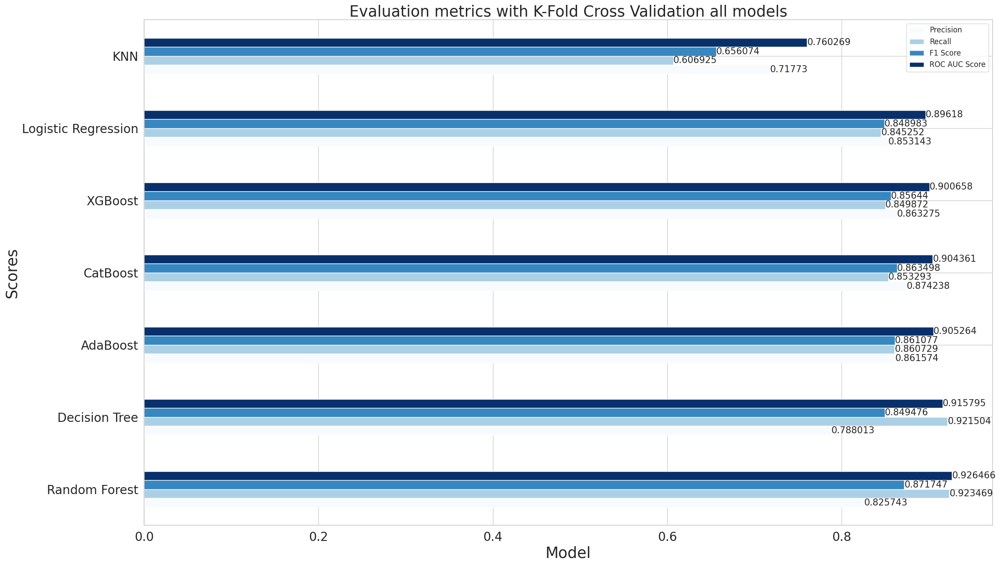

In [304]:
## Plot

comp_data.set_index(comp_data.Model, inplace=True)
ax = comp_data.plot(kind="barh", figsize=(25,15), cmap="Blues")
ax.bar_label(ax.containers[0], fontsize=15)
ax.bar_label(ax.containers[1], fontsize=15)
ax.bar_label(ax.containers[2], fontsize=15)
ax.bar_label(ax.containers[3], fontsize=15)
plt.legend(fontsize =12)
plt.xlabel("Model", fontsize =25)
plt.ylabel("Scores", fontsize=25)
plt.xticks(fontsize =20)
plt.yticks(fontsize =20)
plt.title("Evaluation metrics with K-Fold Cross Validation all models", fontsize = 25)
plt.show()


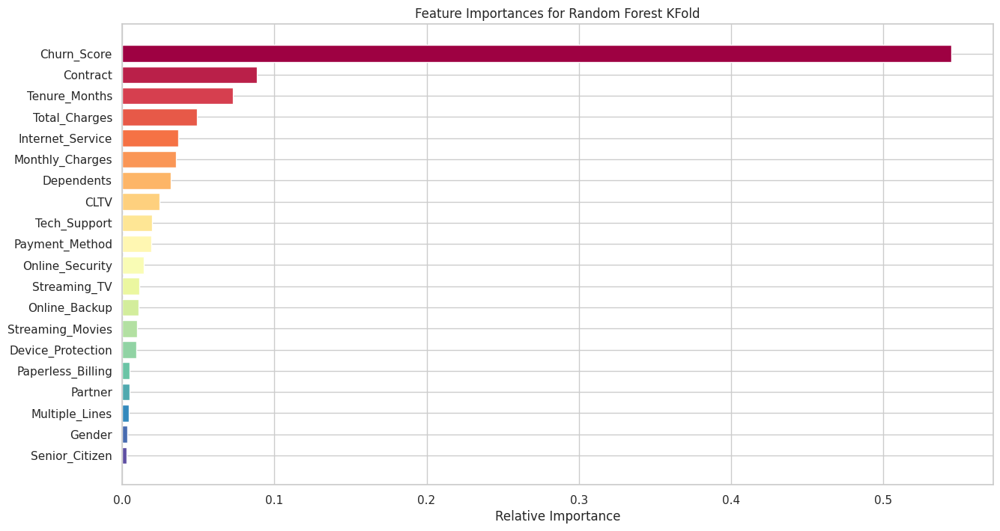

In [305]:
# plot the feature importance for xgboost kfold model

# Create a bar plot of the feature importances for the XGBoost model
importances = model_rf_kfold.feature_importances_
indices = np.argsort(importances)[1::]
features = X.columns

plt.figure(figsize=(15, 8))
plt.title('Feature Importances for Random Forest KFold')
plt.barh(range(len(indices)), importances[indices], align='center', color=plt.cm.Spectral(np.linspace(1, 0, len(indices))))
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [306]:
# create a dataframe using the feature importances of random forest

import pandas as pd

# Create a dataframe of feature importances
feature_importances = pd.DataFrame({
    "feature": X.columns,
    "importance": model_rf_kfold.feature_importances_
})

# Sort the dataframe by importance in descending order
feature_importances = feature_importances.sort_values(by="importance", ascending=False)

# Print the dataframe
feature_importances.style.background_gradient(cmap="coolwarm")


,feature,importance
19,Churn_Score,0.544960
14,Contract,0.088735
4,Tenure_Months,0.072531
18,Total_Charges,0.049342
7,Internet_Service,0.036898
17,Monthly_Charges,0.035367
3,Dependents,0.031896
20,CLTV,0.024670
11,Tech_Support,0.019506
16,Payment_Method,0.018890


## Test model on sample data


In [307]:
# Test the random forest model on a sample data

# Create a sample data point
sample_data = X.iloc[10]

# Make a prediction on the sample data
prediction = model_rf_kfold.predict([sample_data])

# Print the prediction
print(f"Prediction for the sample data: {prediction}")

# Compare with the orginal value of the churn value from y

actual_value = y.iloc[10]
print(f"Actual label of the churn value: {actual_value}")


Prediction for the sample data: [1]
Actual label of the churn value: 1


## SMOTE

In [308]:
# Perform smote on X and y

from imblearn.over_sampling import SMOTE

# Instantiate the SMOTE model
smote = SMOTE(random_state=42)

# Fit the model to the data
X_resampled, y_resampled = smote.fit_resample(X, y)

# Print the shape of the resampled data
print(f"Shape of X after SMOTE: {X_resampled.shape}")
print(f"Shape of y after SMOTE: {y_resampled.shape}")


Shape of X after SMOTE: (10326, 21)
Shape of y after SMOTE: (10326,)


In [309]:
# Create train test split using resampled X and y

X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

print(f"Shape of X_train_resampled: {X_train_resampled.shape}")
print(f"Shape of X_test_resampled: {X_test_resampled.shape}")
print(f"Shape of y_train_resampled: {y_train_resampled.shape}")
print(f"Shape of y_test_resampled: {y_test_resampled.shape}")

Shape of X_train_resampled: (8260, 21)
Shape of X_test_resampled: (2066, 21)
Shape of y_train_resampled: (8260,)
Shape of y_test_resampled: (2066,)


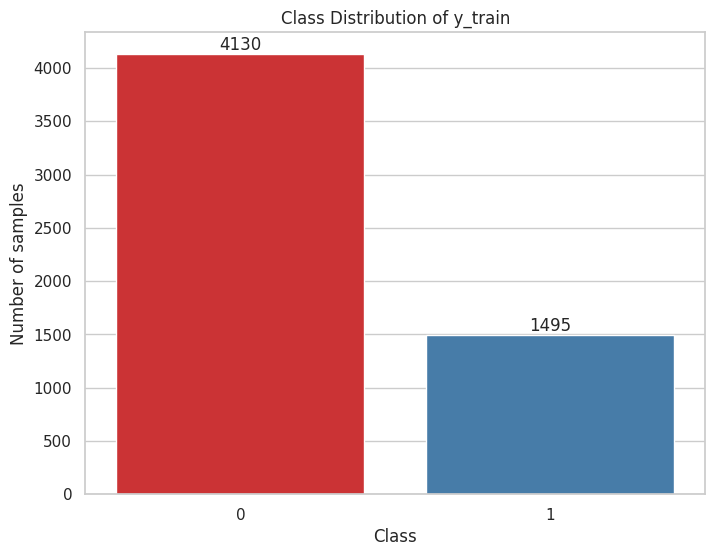

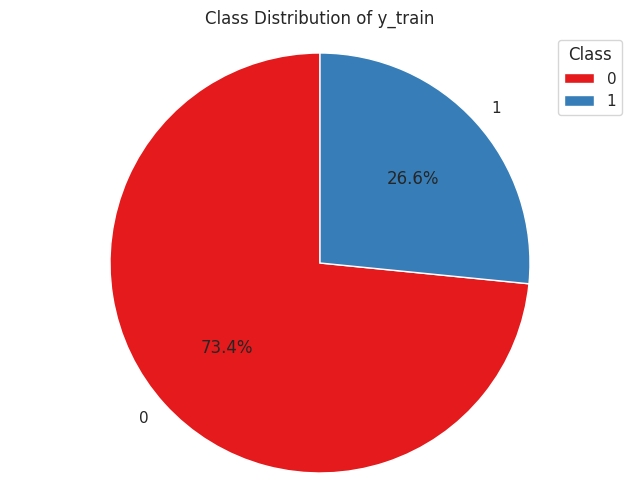

In [310]:
# Plot the class distribution of y_train

import matplotlib.pyplot as plt
import seaborn as sns

# Count the number of samples for each class in y_train
class_counts = y_train.value_counts()

# Create a bar plot of the class distribution
plt.figure(figsize=(8, 6))
sns.barplot(x=class_counts.index, y=class_counts.values, palette="Set1")
plt.xlabel('Class')
plt.ylabel('Number of samples')
plt.title('Class Distribution of y_train')
# Print the data labels on the bars
for i, v in enumerate(class_counts.values):
    plt.text(i, v + 0.05, str(v), ha='center', va='bottom')

plt.show()

#plot a plt.pie chart of the class distribution of y_train

plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=90, colors = sns.color_palette("Set1"))
plt.axis('equal')
plt.title('Class Distribution of y_train')
plt.legend(title='Class')
plt.show()


In [311]:
# Create a function that returns   accuracy, precision, recall, f1 score and plot  classification report, confusion matrix, roc auc curve for X_train_resampled, X_test_resampled,  and y_train_resampled and y_test_resampled

def run_model_smote(model, X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled):
    model.fit(X_train_resampled, y_train_resampled)
    y_pred = model.predict(X_test_resampled)
    accuracy = accuracy_score(y_test_resampled, y_pred)
    precision = precision_score(y_test_resampled, y_pred)
    recall = recall_score(y_test_resampled, y_pred)
    f1 = f1_score(y_test_resampled, y_pred)
    roc_auc = roc_auc_score(y_test_resampled, y_pred)
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    print("ROC AUC Score:", roc_auc)
    print(classification_report(y_test_resampled, y_pred))

    # Compute the confusion matrix
    cm = confusion_matrix(y_test_resampled, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', square=True, cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

    # Plot ROC_AUC Curve
    # Predict probabilities on the test data
    y_pred_proba = model.predict_proba(X_test_resampled)[:, 1]

    # Calculate the ROC curve
    fpr, tpr, thresholds = roc_curve(y_test_resampled, y_pred_proba)

    # Calculate the AUC score
    roc_auc = auc(fpr, tpr)

    # Plot the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.show()

    return accuracy, precision, recall, f1, roc_auc


Accuracy: 0.9303000968054211
Precision: 0.9147940074906367
Recall: 0.9485436893203884
F1 Score: 0.9313632030505243
ROC AUC Score: 0.9303529257412753
              precision    recall  f1-score   support

           0       0.95      0.91      0.93      1036
           1       0.91      0.95      0.93      1030

    accuracy                           0.93      2066
   macro avg       0.93      0.93      0.93      2066
weighted avg       0.93      0.93      0.93      2066



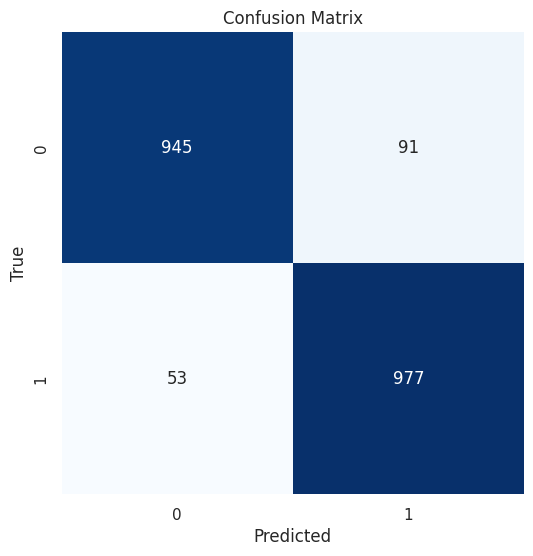

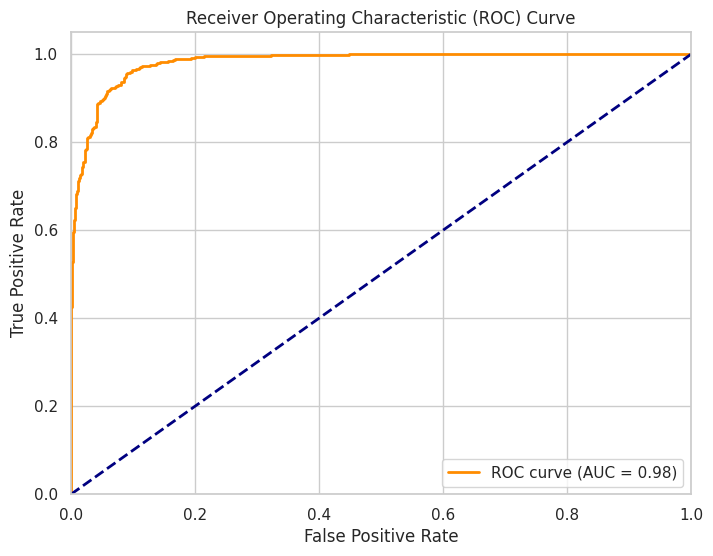

In [312]:
# Fit a logistic regression model to the above function

params_lr_smote = {"class_weight": None, "solver":'lbfgs', "max_iter":1000}
model_lr_smote = LogisticRegression(**params_lr_smote)
accuracy_lr_smote, precision_lr_smote, recall_lr_smote, f1_lr_smote, roc_auc_lr_smote = run_model_smote(model_lr_smote, X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled)


Accuracy: 0.9303000968054211
Precision: 0.9094269870609981
Recall: 0.9553398058252427
F1 Score: 0.9318181818181819
ROC AUC Score: 0.930372605615324
              precision    recall  f1-score   support

           0       0.95      0.91      0.93      1036
           1       0.91      0.96      0.93      1030

    accuracy                           0.93      2066
   macro avg       0.93      0.93      0.93      2066
weighted avg       0.93      0.93      0.93      2066



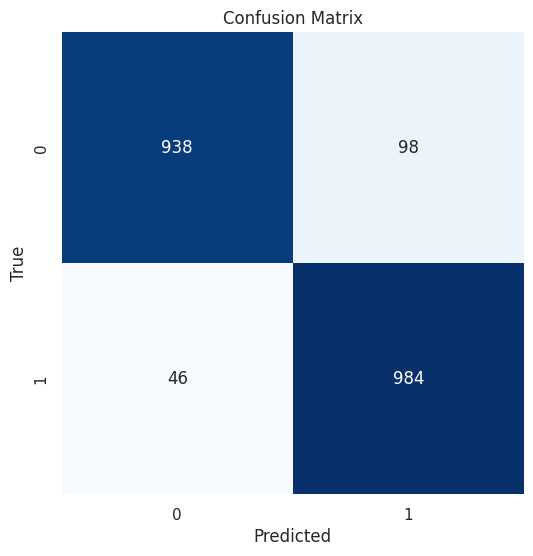

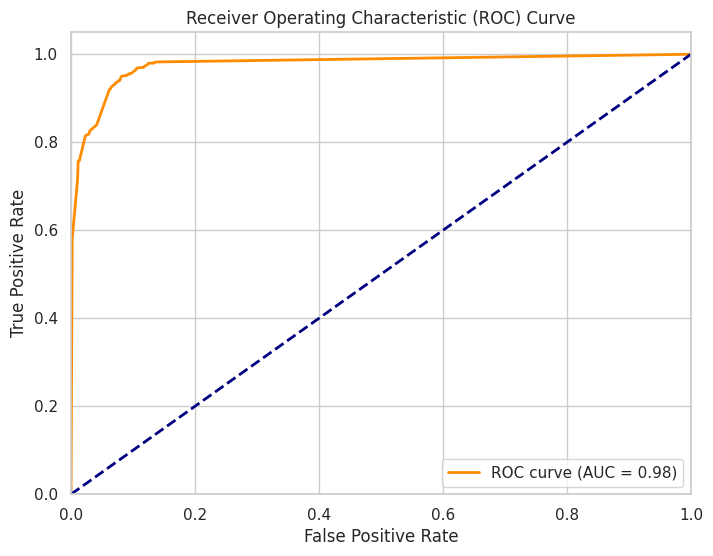

In [313]:
# Fit a decision tree model to the above function

params_dt_smote = {'max_depth': 10,
             'min_samples_split': 10,
             'min_samples_leaf': 5,
             'criterion': 'gini',
             'class_weight': 'balanced',
             #'criterion': 'entropy',
             #'max_features': 'sqrt',
             'random_state': 42
}
model_dt_smote = DecisionTreeClassifier(**params_dt_smote)
accuracy_dt_smote, precision_dt_smote, recall_dt_smote, f1_dt_smote, roc_auc_dt_smote = run_model_smote(model_dt_smote, X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled)


Accuracy: 0.9443368828654405
Precision: 0.9287722586691659
Recall: 0.962135922330097
F1 Score: 0.9451597520267048
ROC AUC Score: 0.9443884244855119
              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1036
           1       0.93      0.96      0.95      1030

    accuracy                           0.94      2066
   macro avg       0.94      0.94      0.94      2066
weighted avg       0.94      0.94      0.94      2066



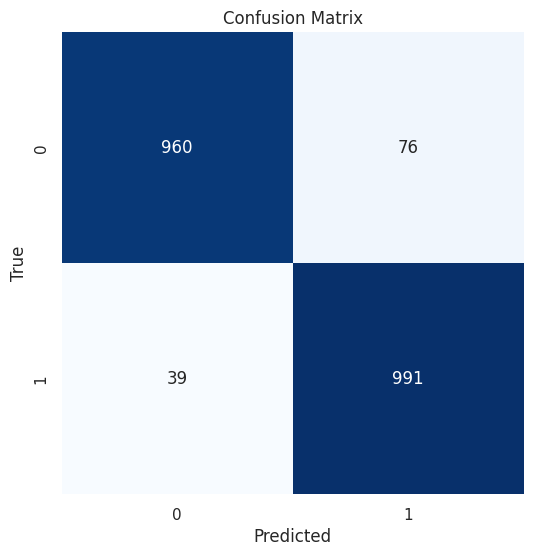

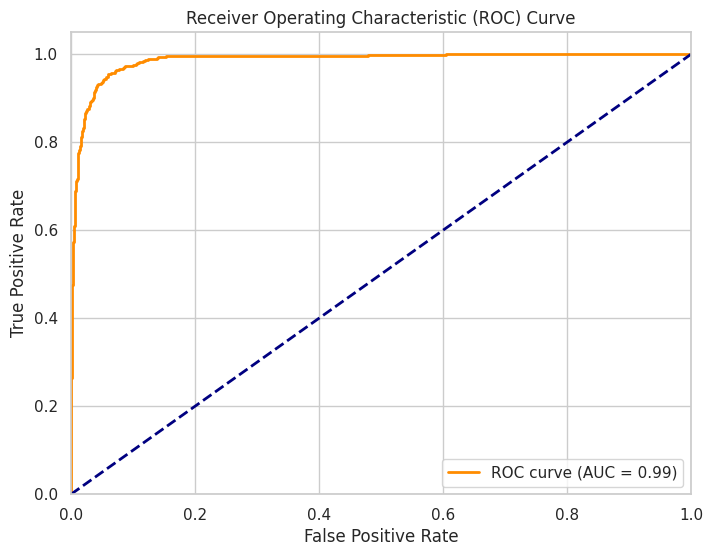

In [314]:
# Fit a random forest model to the above function

params_rf_smote = {'max_depth': 10,
             'class_weight': 'balanced',
             'min_samples_leaf': 1,
             'min_samples_split': 2,
             'n_estimators': 100,
             'random_state': 123}

model_rf_smote = RandomForestClassifier(**params_rf_smote)
accuracy_rf_smote, precision_rf_smote, recall_rf_smote, f1_rf_smote, roc_auc_rf_smote = run_model_smote(model_rf_smote, X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled)


Accuracy: 0.856727976766699
Precision: 0.8180242634315424
Recall: 0.916504854368932
F1 Score: 0.8644688644688644
ROC AUC Score: 0.8569010758331146
              precision    recall  f1-score   support

           0       0.91      0.80      0.85      1036
           1       0.82      0.92      0.86      1030

    accuracy                           0.86      2066
   macro avg       0.86      0.86      0.86      2066
weighted avg       0.86      0.86      0.86      2066



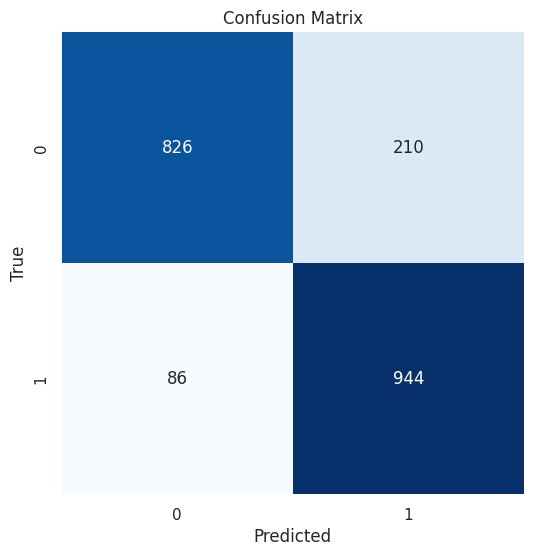

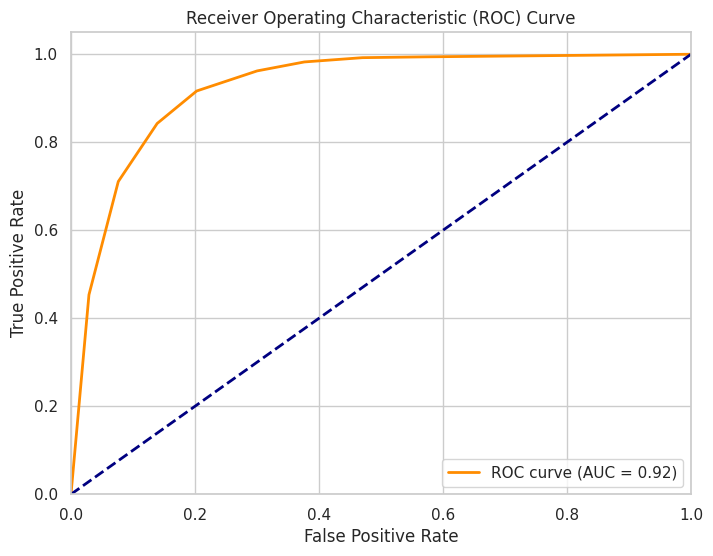

In [315]:
# Fit a KNN model to the above function

params_knn_smote = {'n_neighbors': 8,
             'metric': 'euclidean',
             'leaf_size': 30,
             'p': 1,
             'algorithm': 'auto',
             'weights': 'uniform'}

model_knn_smote = KNeighborsClassifier(**params_knn_smote)
accuracy_knn_smote, precision_knn_smote, recall_knn_smote, f1_knn_smote, roc_auc_knn_smote = run_model_smote(model_knn_smote, X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled)


Accuracy: 0.9472410454985479
Precision: 0.9381541389153187
Recall: 0.9572815533980582
F1 Score: 0.9476213358962038
ROC AUC Score: 0.9472701203283727
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1036
           1       0.94      0.96      0.95      1030

    accuracy                           0.95      2066
   macro avg       0.95      0.95      0.95      2066
weighted avg       0.95      0.95      0.95      2066



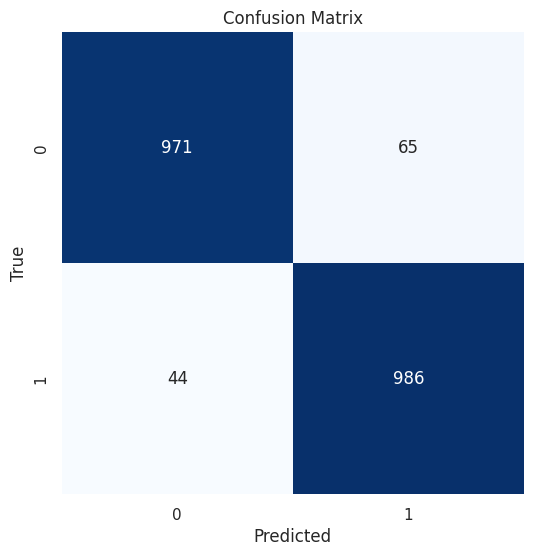

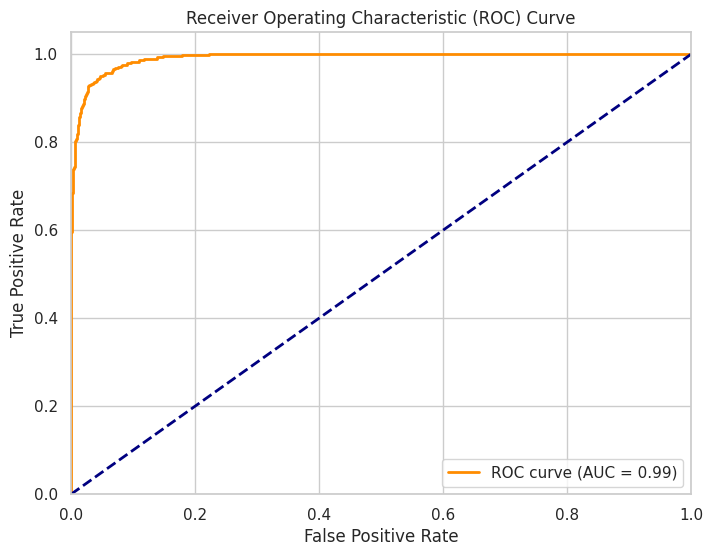

In [316]:
# Fit XG Boost model to the smote function

params_xgb_smote = {'n_estimators': 100,
            'max_depth': 10,
            'learning_rate': 0.1,
            'objective': 'binary:logistic',
            'eval_metric': 'auc',
            'random_state': 42
             }

model_xgb_smote = xgb.XGBClassifier(**params_xgb_smote)
accuracy_xgb_smote, precision_xgb_smote, recall_xgb_smote, f1_xgb_smote, roc_auc_xgb_smote = run_model_smote(model_xgb_smote, X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled)


Accuracy: 0.9424007744433688
Precision: 0.932573599240266
Recall: 0.9533980582524272
F1 Score: 0.9428708593374939
ROC AUC Score: 0.9424326198598044
              precision    recall  f1-score   support

           0       0.95      0.93      0.94      1036
           1       0.93      0.95      0.94      1030

    accuracy                           0.94      2066
   macro avg       0.94      0.94      0.94      2066
weighted avg       0.94      0.94      0.94      2066



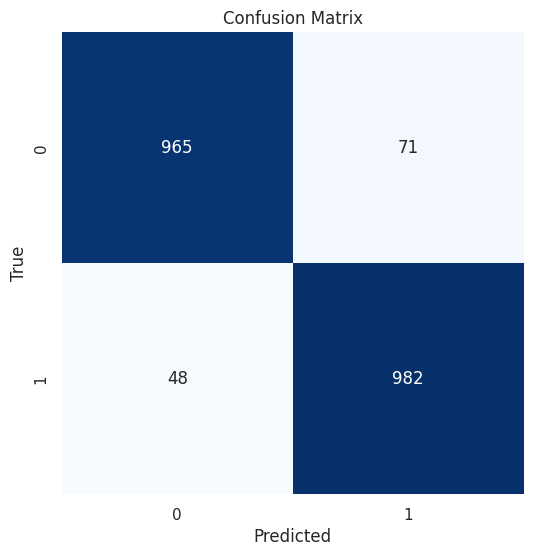

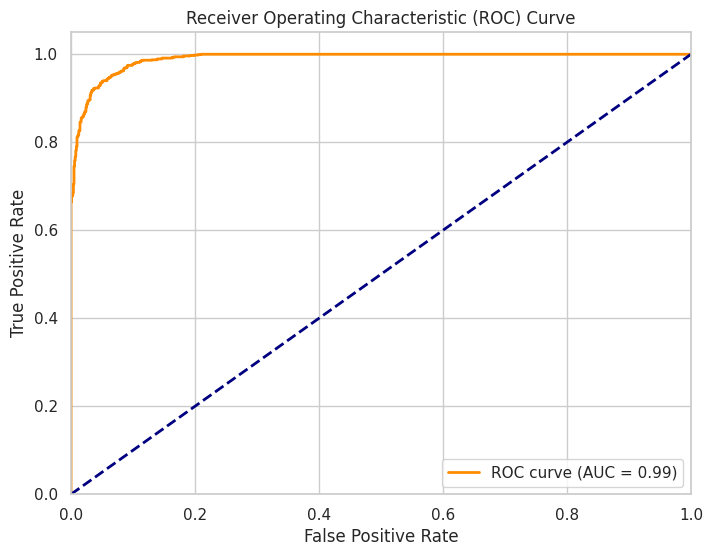

In [317]:
# Fit a ADA boost model to the smote function

params_ada_smote = {'n_estimators': 100,
             'learning_rate': 1.0,
             'random_state': 123}

model_ada_smote = AdaBoostClassifier(**params_ada_smote)
accuracy_ada_smote, precision_ada_smote, recall_ada_smote, f1_ada_smote, roc_auc_ada_smote = run_model_smote(model_ada_smote, X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled)


0:	total: 4.95ms	remaining: 491ms
1:	total: 14.4ms	remaining: 705ms
2:	total: 23.7ms	remaining: 766ms
3:	total: 32.9ms	remaining: 790ms
4:	total: 42.5ms	remaining: 808ms
5:	total: 52.6ms	remaining: 823ms
6:	total: 62.8ms	remaining: 835ms
7:	total: 72.3ms	remaining: 831ms
8:	total: 81.4ms	remaining: 823ms
9:	total: 91ms	remaining: 819ms
10:	total: 100ms	remaining: 811ms
11:	total: 110ms	remaining: 805ms
12:	total: 119ms	remaining: 797ms
13:	total: 128ms	remaining: 789ms
14:	total: 138ms	remaining: 782ms
15:	total: 147ms	remaining: 773ms
16:	total: 156ms	remaining: 762ms
17:	total: 165ms	remaining: 752ms
18:	total: 174ms	remaining: 743ms
19:	total: 183ms	remaining: 734ms
20:	total: 193ms	remaining: 726ms
21:	total: 202ms	remaining: 718ms
22:	total: 212ms	remaining: 709ms
23:	total: 221ms	remaining: 701ms
24:	total: 231ms	remaining: 692ms
25:	total: 240ms	remaining: 682ms
26:	total: 249ms	remaining: 673ms
27:	total: 258ms	remaining: 664ms
28:	total: 268ms	remaining: 657ms
29:	total: 277ms

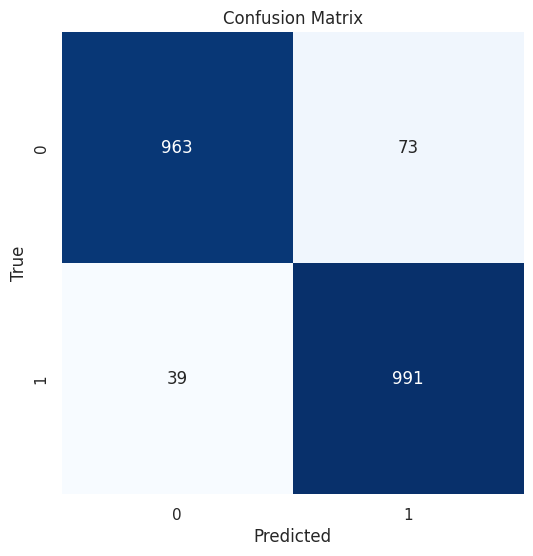

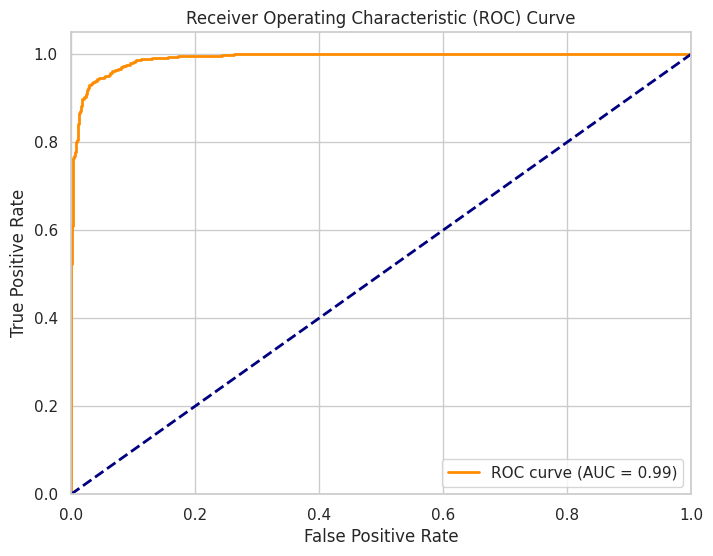

In [318]:
# Fit a catboost model to the smote function

params_cb_smote = {'n_estimators': 100,
             'learning_rate': 0.1,
             'depth': 10,
             'loss_function': 'Logloss',
             'eval_metric': 'AUC',
             'custom_metric': ['Logloss', 'AUC', 'Accuracy'],
             'random_seed': 42}

model_cb_smote = CatBoostClassifier(**params_cb_smote)
accuracy_cb_smote, precision_cb_smote, recall_cb_smote, f1_cb_smote, roc_auc_cb_smote = run_model_smote(model_cb_smote, X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled)



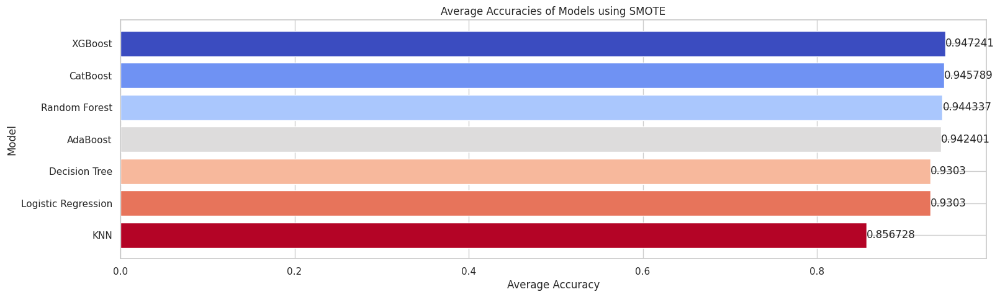

In [319]:
# Compare model accuracy for all smote models

smote_model_accuracies = [accuracy_lr_smote, accuracy_dt_smote, accuracy_rf_smote, accuracy_xgb_smote, accuracy_knn_smote, accuracy_ada_smote, accuracy_cb_smote]
model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', 'KNN', 'AdaBoost', 'CatBoost']

smote_data = {'Model': model_names, 'Accuracy': smote_model_accuracies}
smote_data = pd.DataFrame(smote_data)

smote_data = smote_data.sort_values(by='Accuracy', ascending=True)
model_names = smote_data['Model'].to_list()
smote_model_accuracies = smote_data['Accuracy'].to_list()

plt.figure(figsize=(18, 5))
plt.barh(model_names, smote_model_accuracies, align='center', color=plt.cm.coolwarm(np.linspace(1, 0, len(model_names))))
plt.xlabel('Average Accuracy')
plt.ylabel('Model')
plt.title('Average Accuracies of Models using SMOTE')
plt.yticks(range(len(model_names)), model_names)
plt.bar_label(plt.gca().containers[0])
plt.show()


In [320]:
# Compare precision, recall, f1score, ROC AUC scores and plot them for all models

smote_model_precisions = [precision_lr_smote, precision_dt_smote, precision_rf_smote, precision_xgb_smote, precision_knn_smote, precision_ada_smote, precision_cb_smote]
smote_model_recalls = [recall_lr_smote, recall_dt_smote, recall_rf_smote, recall_xgb_smote, recall_knn_smote, recall_ada_smote, recall_cb_smote]
smote_model_f1s = [f1_lr_smote, f1_dt_smote, f1_rf_smote, f1_xgb_smote, f1_knn_smote, f1_ada_smote, f1_cb_smote]
smote_model_roc_aucs = [roc_auc_lr_smote, roc_auc_dt_smote, roc_auc_rf_smote, roc_auc_xgb_smote, roc_auc_knn_smote, roc_auc_ada_smote, roc_auc_cb_smote]

smote_data = {'Model': model_names, 'Precision': smote_model_precisions, 'Recall': smote_model_recalls, 'F1 Score': smote_model_f1s, 'ROC AUC Score': smote_model_roc_aucs}
smote_data = pd.DataFrame(smote_data)

smote_data = smote_data.sort_values(by='ROC AUC Score', ascending=True)


smote_data.style.background_gradient(cmap='Spectral')


,Model,Precision,Recall,F1 Score,ROC AUC Score
4,Random Forest,0.818024,0.916505,0.864469,0.924996
1,Logistic Regression,0.909427,0.955340,0.931818,0.976447
0,KNN,0.914794,0.948544,0.931363,0.982118
2,Decision Tree,0.928772,0.962136,0.945160,0.986623
5,CatBoost,0.932574,0.953398,0.942871,0.989755
6,XGBoost,0.931391,0.962136,0.946514,0.990974
3,AdaBoost,0.938154,0.957282,0.947621,0.991540


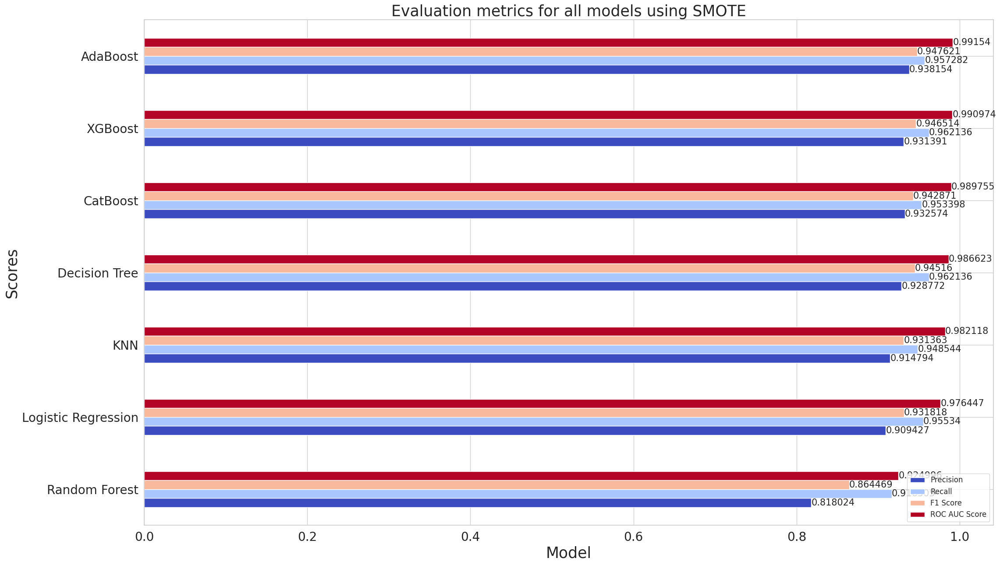

In [321]:

## Plot

smote_data.set_index(smote_data.Model, inplace=True)
ax = smote_data.plot(kind="barh", figsize=(25,15), cmap="coolwarm")
ax.bar_label(ax.containers[0], fontsize=15)
ax.bar_label(ax.containers[1], fontsize=15)
ax.bar_label(ax.containers[2], fontsize=15)
ax.bar_label(ax.containers[3], fontsize=15)
plt.legend(fontsize =12)
plt.xlabel("Model", fontsize =25)
plt.ylabel("Scores", fontsize=25)
plt.xticks(fontsize =20)
plt.yticks(fontsize =20)
plt.title("Evaluation metrics for all models using SMOTE", fontsize = 25)
plt.show()


In [322]:
# Test the AdaBoost model on a sample data point from SMOTE

# Create a sample data point from SMOTE
sample_data_smote = X_resampled.iloc[10]

# Make a prediction on the sample data
prediction_smote = model_ada_smote.predict([sample_data_smote])

# Print the prediction
print(f"Prediction for the sample data: {prediction_smote}")

# Compare with the orginal value of the churn value from y_resampled

actual_value_smote = y_resampled.iloc[10]
print(f"Actual label of the churn value: {actual_value_smote}")


Prediction for the sample data: [1]
Actual label of the churn value: 1


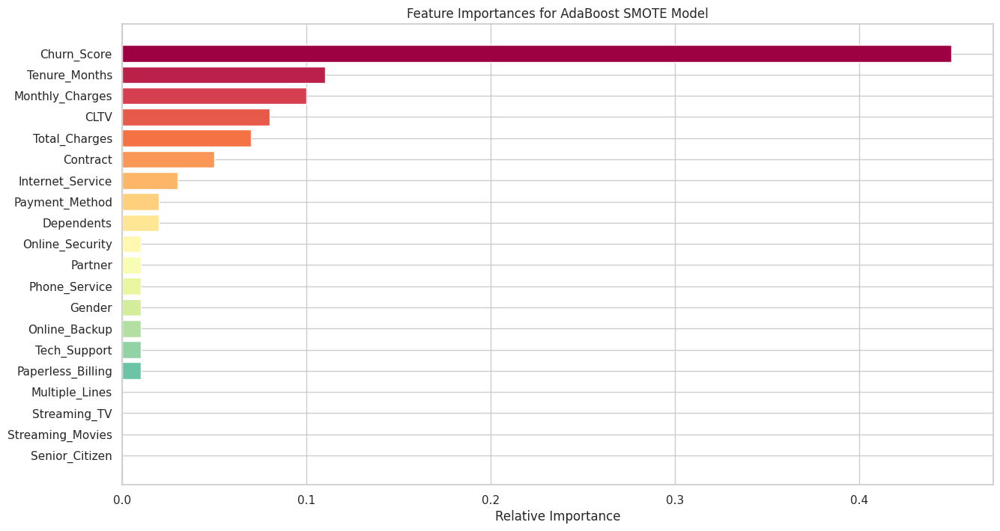

In [323]:
# Plot the feature importances for ada boost smote model

# Create a bar plot of the feature importances for the AdaBoost model
importances = model_ada_smote.feature_importances_
indices = np.argsort(importances)[1::]
features = X.columns

plt.figure(figsize=(15, 8))
plt.title('Feature Importances for AdaBoost SMOTE Model')
plt.barh(range(len(indices)), importances[indices], align='center', color=plt.cm.Spectral(np.linspace(1, 0, len(indices))))
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()


In [324]:
# Create a dataframe with the adaboost smote feature importances

# Create a dataframe of feature importances
feature_importances = pd.DataFrame({
    "feature": X.columns,
    "importance": model_ada_smote.feature_importances_
})

# Sort the dataframe by importance in descending order
feature_importances = feature_importances.sort_values(by="importance", ascending=False)

# Print the dataframe
feature_importances.style.background_gradient(cmap="Spectral")


,feature,importance
19,Churn_Score,0.450000
4,Tenure_Months,0.110000
17,Monthly_Charges,0.100000
20,CLTV,0.080000
18,Total_Charges,0.070000
14,Contract,0.050000
7,Internet_Service,0.030000
3,Dependents,0.020000
16,Payment_Method,0.020000
11,Tech_Support,0.010000
